In [339]:
#To use the notebook click the 5th button down on the left side (files) and upload/drag in the dataset
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
import seaborn as sns

In [340]:
df = pd.read_excel("./Louisana tank farms version 3.0.xlsm", sheet_name="Raw Data Louisiana", engine = "openpyxl")

In [341]:
df.shape

(44685, 14)

In [342]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44685 entries, 0 to 44684
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tank_id               44685 non-null  object        
 1   farm_type             44685 non-null  object        
 2   region                44685 non-null  object        
 3   imaging_time          44685 non-null  object        
 4   image_time_round_day  44685 non-null  datetime64[ns]
 5   max_vol               44685 non-null  float64       
 6   fill_pct              44685 non-null  float64       
 7   tank volume           44685 non-null  float64       
 8   scene_id              44685 non-null  object        
 9   provider_scene_id     44685 non-null  object        
 10  scene_source_id       44685 non-null  object        
 11  Location              44685 non-null  object        
 12  tank_id.1             44685 non-null  object        
 13  tank farm       

In [343]:
df.nunique()

tank_id                   693
farm_type                   2
region                      1
imaging_time              992
image_time_round_day      382
max_vol                   693
fill_pct                44196
tank volume             44204
scene_id                 1589
provider_scene_id         993
scene_source_id             6
Location                  693
tank_id.1                 693
tank farm                  28
dtype: int64

# EDA and Cleaning

In [344]:
(df['tank_id'] == df['tank_id.1']).sum()


44685

In [345]:
df = df.drop(columns='tank_id.1')
df

,tank_id,farm_type,region,imaging_time,image_time_round_day,max_vol,fill_pct,tank volume,scene_id,provider_scene_id,scene_source_id,Location,tank farm
0,082dc832-0355-4443-8d74-0bbe5a59ce23,REFINERY,padd3,2014-01-18T11:16:57.000000,2014-01-18,208035.532654,0.384068,79899.732773,054643765010_01_P001---207001017A163B00,103001002C3D8200,WV02,POINT(-91.20718456 30.47517597),9456
1,110aa251-7c5c-48c5-85dc-aac98b401e6c,REFINERY,padd3,2014-01-18T11:16:57.000000,2014-01-18,58083.897039,0.245030,14232.307369,054643765010_01_P001---207001017A163B00,103001002C3D8200,WV02,POINT(-91.21692658 30.47698114),9456
2,1bae0ebf-883c-4c34-97ab-33016517ec43,REFINERY,padd3,2014-01-18T11:16:57.000000,2014-01-18,629576.864940,0.480066,302238.143471,054643765010_01_P001---207001017A163B00,103001002C3D8200,WV02,POINT(-91.22101618 30.4773222),9456
3,1ccdea2c-56ab-4ae4-a25b-023f48c1442c,REFINERY,padd3,2014-01-18T11:16:57.000000,2014-01-18,29136.899392,0.627026,18269.592691,054643765010_01_P001---207001017A163B00,103001002C3D8200,WV02,POINT(-91.20782668 30.47552346),9456
4,205ad502-9b71-4e9e-86c1-835fa6c7e1f6,REFINERY,padd3,2014-01-18T11:16:57.000000,2014-01-18,20953.719142,0.768291,16098.562474,054643765010_01_P001---207001017A163B00,103001002C3D8200,WV02,POINT(-91.20785969 30.47517532),9456
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44680,e7540968-2382-48d7-aa3f-2b5108a26db1,TERMINAL,padd3,2018-04-05T12:01:46.000000,2018-04-05,234904.531997,0.487484,114512.135501,057782445010_01_P001---103001007A6AC200,103001007A6AC200,WV02,POINT(-89.9367856979403 29.9393607739819),undefined
44681,f1f72f60-ff4a-4a3b-86ec-0feb1aa4b6e3,REFINERY,padd3,2018-04-05T12:01:46.000000,2018-04-05,55582.655905,0.296094,16457.715266,057782445010_01_P001---103001007A6AC200,103001007A6AC200,WV02,POINT(-89.93917414 29.93484178),9294
44682,f6e40339-e294-460d-b077-b1d0e1383ff5,REFINERY,padd3,2018-04-05T12:01:46.000000,2018-04-05,339019.718234,0.725951,246111.661608,057782445010_01_P001---103001007A6AC200,103001007A6AC200,WV02,POINT(-89.93626576 29.94053702),9294
44683,f97e1023-e233-485c-8ebb-da8cf91b85e7,REFINERY,padd3,2018-04-05T12:01:46.000000,2018-04-05,174125.667706,0.789281,137433.996768,057782445010_01_P001---103001007A6AC200,103001007A6AC200,WV02,POINT(-89.95787414 29.93026184),9325


In [346]:
# Calculate the expected tank volume
df['expected_tank_vol'] = df['max_vol'] * df['fill_pct']

# Check if the actual tank volume is close to the expected value (use np.isclose to account for floating point precision)
df['tank_vol_check'] = np.isclose(df['tank volume'], df['expected_tank_vol'])

# Print out any rows where the check fails
if not df['tank_vol_check'].all():
    print("Rows that do not match the condition (tank vol != max_vol * fill_pct):")
    print(df[~df['tank_vol_check']])
else:
    print("All rows match: tank volume equals max_vol * fill_pct")


# Check if each tank_id has only one unique max_vol
inconsistent_max_vols = df.groupby('tank_id')['max_vol'].nunique().reset_index()
inconsistent_max_vols = inconsistent_max_vols[inconsistent_max_vols['max_vol'] > 1]

if not inconsistent_max_vols.empty:
    print("Tank IDs with inconsistent max_vol values:")
    print(inconsistent_max_vols)
    
    # Optional: show the original rows for those tank_ids
    inconsistent_ids = inconsistent_max_vols['tank_id']
    print("Details of inconsistent tank_id entries:")
    print(df[df['tank_id'].isin(inconsistent_ids)])
else:
    print("All tank_ids have consistent max_vol values.")

All rows match: tank volume equals max_vol * fill_pct
All tank_ids have consistent max_vol values.


In [347]:
import pandas as pd
import folium
from shapely.wkt import loads

# Extract unique locations
df["Location"] = df["Location"].astype(str)
df["geometry"] = df["Location"].apply(loads)  # Convert WKT to geometry
df["latitude"] = df["geometry"].apply(lambda point: point.y)
df["longitude"] = df["geometry"].apply(lambda point: point.x)

# Get unique lat/lon pairs
unique_locations = df[["latitude", "longitude"]].drop_duplicates()

# Create a map centered around the first point
m = folium.Map(location=[unique_locations["latitude"].mean(), unique_locations["longitude"].mean()], zoom_start=5)

# Add markers for each unique location
for _, row in unique_locations.iterrows():
    folium.Marker([row["latitude"], row["longitude"]]).add_to(m)

# Save map as HTML and display
m.save("tank_locations_map.html")
m

In [348]:
# Compute average location for each tank farm
farm_locations = df.groupby("tank farm")[["latitude", "longitude"]].mean().reset_index()

# Create a map centered at the mean location
m = folium.Map(location=[farm_locations["latitude"].mean(), farm_locations["longitude"].mean()], zoom_start=5)

# Add markers for each tank farm
for _, row in farm_locations.iterrows():
    folium.Marker(
        location=[row["latitude"], row["longitude"]],
        popup=row["tank farm"],  # Show tank farm name on click
        icon=folium.Icon(color="red", icon="info-sign")
    ).add_to(m)

# Get unique lat/lon pairs
unique_locations = df[["latitude", "longitude", "tank farm"]].drop_duplicates()
unique_locations = unique_locations[unique_locations["tank farm"] == "undefined"]

# Add markers for each unique location
for _, row in unique_locations.iterrows():
    folium.Marker([row["latitude"], row["longitude"]]).add_to(m)

# Save map as HTML and display
m.save("tank_locations_map.html")
m

In [349]:
filtered = df[df["tank farm"] == "undefined"]
unique_counts = filtered.groupby(["longitude", "latitude", "tank_id"]).size().reset_index(name="count")
print(unique_counts)

    longitude   latitude                               tank_id  count
0  -93.791555  32.467994  92936121-ef05-448a-932c-c3aff80b1fca     27
1  -93.337572  30.174953  172b830d-f6ba-46ea-8e32-90eba90633f0     48
2  -93.334890  30.178219  3dd24217-cf05-4aeb-befb-11ed832e449c     53
3  -93.333172  30.171101  2f6dc5b0-ee24-49ec-bdb6-2e8d98bee62e     19
4  -93.329171  30.182855  57e31d29-b532-43af-819a-ba12d21a5e08     53
5  -93.329166  30.183078  01b8a7e6-e52f-4f97-93f6-951829a3cbb2     48
6  -93.328922  30.182612  820bc924-224a-4809-8f14-f798bc541047     53
7  -93.328916  30.182855  1807da43-44b6-4074-951e-0df0ea104b68     52
8  -93.328662  30.182605  26bb1b69-7609-4d58-8af8-6fdf4eb7c497     53
9  -93.311855  30.185132  fe7194f0-0c81-47df-abe9-6a1d12d051bd     19
10 -93.276646  30.238951  0017ffca-6b06-4c8a-a787-7893441c3bf0     51
11 -93.168576  32.949593  2b36aade-f7a4-4407-bab1-32cd820e9a97      8
12 -91.278105  30.635567  bf6b1963-04b5-488b-8bdb-83a46274a9d6     11
13 -91.203990  30.47

In [350]:
from sklearn.neighbors import NearestNeighbors

# Step 1: Separate defined and undefined tank farm entries
defined = df[df["tank farm"] != "undefined"].copy()
undefined = df[df["tank farm"] == "undefined"].copy()

# Step 2: Fit NearestNeighbors on defined entries (using lat/lon)
nn = NearestNeighbors(n_neighbors=1, metric='euclidean')  # or 'haversine' for more accuracy (if in radians)
nn.fit(defined[["latitude", "longitude"]])

# Step 3: Find nearest neighbor for each undefined entry
distances, indices = nn.kneighbors(undefined[["latitude", "longitude"]])

# Step 4: Assign nearest tank farm to undefined entries
undefined["nearest_tank_farm"] = defined.iloc[indices.flatten()]["tank farm"].values

# Optional: Replace the "undefined" entries in the original df
df.loc[df["tank farm"] == "undefined", "tank farm"] = undefined["nearest_tank_farm"]

In [351]:
filtered = df[df["tank farm"] == "undefined"]
unique_counts = filtered.groupby(["longitude", "latitude", "tank_id"]).size().reset_index(name="count")
print(unique_counts)

Empty DataFrame
Columns: [longitude, latitude, tank_id, count]
Index: []


In [352]:
df["imaging_time"] = pd.to_datetime(df["imaging_time"])

In [353]:
image_unique = df.groupby("tank_id")[["scene_id", "provider_scene_id", "scene_source_id"]]
print(image_unique.nunique())

                                      scene_id  provider_scene_id  \
tank_id                                                             
0017ffca-6b06-4c8a-a787-7893441c3bf0        51                 44   
00b5a68a-9cc8-48a1-a647-19e72634e80c        95                 91   
00d8f211-0c0f-48d8-877e-bc405db9cf2c        19                 19   
00daeac9-dfb4-4553-8438-7bcbb9fce649        79                 58   
0163732b-747d-4f23-8e27-02a9f8fab7b5        66                 66   
...                                        ...                ...   
ff3bbf36-2459-4a24-84fe-2583a6e01041        63                 63   
ff4296d5-2595-4aab-b351-485a79099ac8        63                 63   
ff87ee1c-fe36-4973-8336-ba81d7bc3184        86                 86   
ffb175c9-28dc-4950-939b-cdbd8bc1597d        70                 68   
ffda825a-86c2-4f36-b361-afe788a0b7e1        52                 41   

                                      scene_source_id  
tank_id                                       

In [354]:
df.describe()

,imaging_time,image_time_round_day,max_vol,fill_pct,tank volume,expected_tank_vol,latitude,longitude
count,44685,44685,44685.000000,44685.000000,44685.000000,44685.000000,44685.000000,44685.000000
mean,2016-09-17 14:02:08.526037760,2016-09-17 02:24:45.438066688,185252.383882,0.553984,107016.730418,107016.730418,30.131942,-91.042907
min,2014-01-18 11:16:57,2014-01-18 00:00:00,7196.083461,0.030723,980.608068,980.608068,29.445149,-93.796697
25%,2016-01-23 10:50:12,2016-01-23 00:00:00,64364.626945,0.353751,27363.604008,27363.604008,29.990863,-91.207597
50%,2016-10-12 12:00:24,2016-10-12 00:00:00,117880.168602,0.539150,61608.265424,61608.265424,30.052823,-90.853707
75%,2017-06-19 11:53:52,2017-06-19 00:00:00,250264.617689,0.761213,130987.785355,130987.785355,30.241805,-90.395940
max,2018-04-05 12:01:46,2018-04-05 00:00:00,816298.924484,1.000000,807237.350481,807237.350481,32.950343,-89.936266
std,NaN,NaN,172959.682740,0.236869,125167.250307,125167.250307,0.344895,1.040011


In [355]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44685 entries, 0 to 44684
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   tank_id               44685 non-null  object        
 1   farm_type             44685 non-null  object        
 2   region                44685 non-null  object        
 3   imaging_time          44685 non-null  datetime64[ns]
 4   image_time_round_day  44685 non-null  datetime64[ns]
 5   max_vol               44685 non-null  float64       
 6   fill_pct              44685 non-null  float64       
 7   tank volume           44685 non-null  float64       
 8   scene_id              44685 non-null  object        
 9   provider_scene_id     44685 non-null  object        
 10  scene_source_id       44685 non-null  object        
 11  Location              44685 non-null  object        
 12  tank farm             44685 non-null  object        
 13  expected_tank_vo

In [356]:
df.nunique()

tank_id                   693
farm_type                   2
region                      1
imaging_time              992
image_time_round_day      382
max_vol                   693
fill_pct                44196
tank volume             44204
scene_id                 1589
provider_scene_id         993
scene_source_id             6
Location                  693
tank farm                  27
expected_tank_vol       44204
tank_vol_check              1
geometry                  693
latitude                  692
longitude                 693
dtype: int64

In [357]:
# Get the tank IDs that have at least one "undefined" in the "tank farm" column
undefined_tank_ids = df.loc[df["tank farm"] == "undefined", "tank_id"].unique()

# Filter the DataFrame for rows corresponding to these tank IDs
filtered_tanks = df[df["tank_id"].isin(undefined_tank_ids)]

# Group by tank_id and collect all unique "tank farm" values
result = filtered_tanks.groupby("tank_id")["tank farm"].unique().reset_index()

print(filtered_tanks["tank farm"].unique())

[]


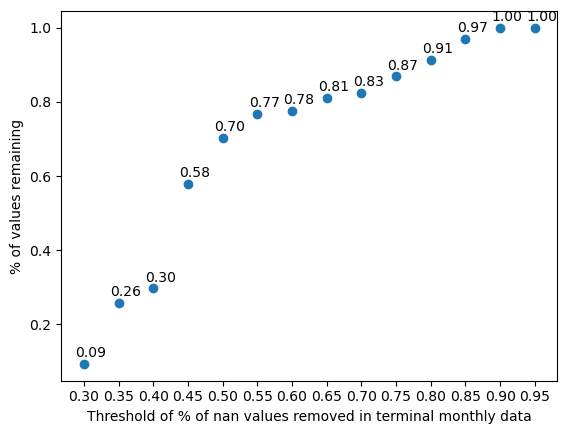

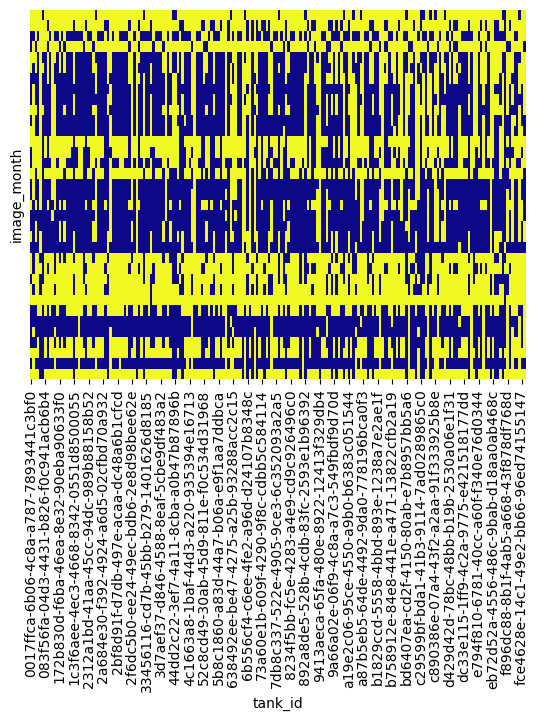

Percentage of NaN values: 47.67%


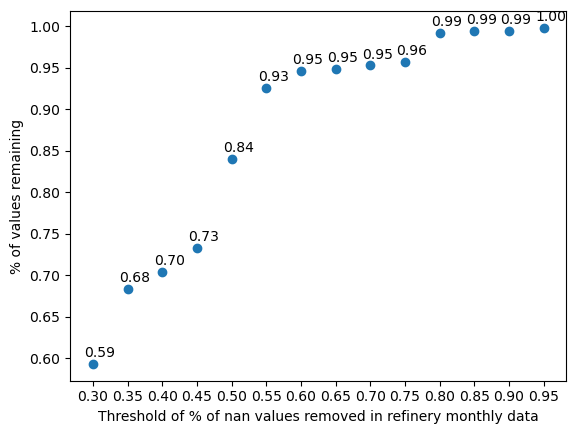

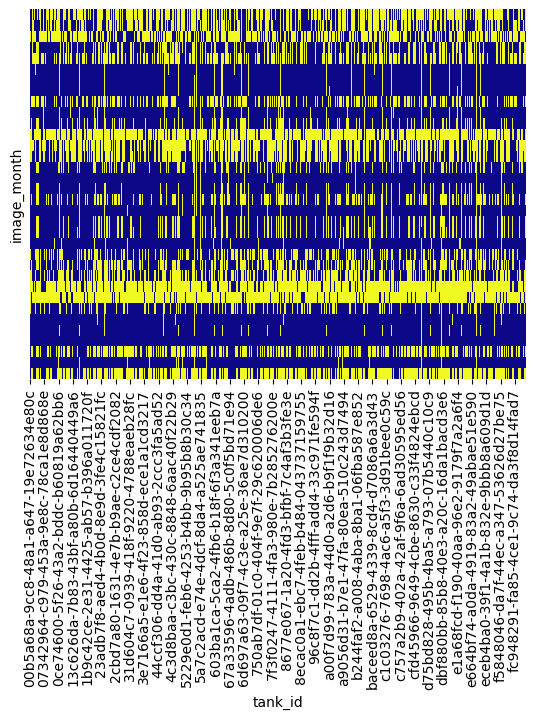

Percentage of NaN values: 33.03%


In [358]:
# data = pd.read_excel("/content/Louisana tank farms version 3.0.xlsm", sheet_name="Raw Data Louisiana", engine = "openpyxl")
data = df
data['image_time_round_day'] = pd.to_datetime(data['image_time_round_day'], dayfirst=True)

#Group into monthly data to better fill out the time series - MAYBE GROUP ACCORDING TO THE PERIOD OVER WHICH THE TIME SERIES IS SEASONAL
data['image_month'] = pd.to_datetime(data['image_time_round_day']).dt.to_period("M").astype(str)
data_monthly = data.groupby(['image_month', 'tank_id'], as_index=False).agg({'fill_pct':'mean', 'Location':'first', 'farm_type':'first', 'tank farm': 'first'})

#separate into two separate dataframes, and extract relevant columns from the original data
ref = data_monthly[data_monthly['farm_type'].str.contains('refinery', case=False, na=False)]
term = data_monthly[data_monthly['farm_type'].str.contains('terminal', case=False, na=False)]

refinery_fill = ref.pivot(index='image_month', columns = 'tank_id', values='fill_pct')
refinery_fill = refinery_fill.iloc[15:] #remove first 15 months
refinery_loc = ref.pivot(index='image_month', columns = 'tank_id', values='Location')
refinery_loc = refinery_loc.iloc[15:]
refinery_farm = ref.pivot(index='image_month', columns = 'tank_id', values='tank farm')
refinery_farm = refinery_farm.iloc[15:]

terminal_fill = term.pivot(index='image_month', columns = 'tank_id', values='fill_pct')
terminal_fill = terminal_fill.iloc[15:]
terminal_loc = term.pivot(index='image_month', columns = 'tank_id', values='Location')
terminal_loc = terminal_loc.iloc[15:]
terminal_farm = term.pivot(index='image_month', columns = 'tank_id', values='tank farm')
terminal_farm = terminal_farm.iloc[15:]

#Store the datasets into a dictionary
datasets = {'refinery': [refinery_fill, refinery_loc, refinery_farm] , 'terminal': [terminal_fill, terminal_loc, terminal_farm]}

#Drop tanks which have less than a certain amount of data
def identify_sparse_data(tank_type, plot):
    if tank_type == 'refinery':
        total_tanks = len(datasets['refinery'][0].columns)
    elif tank_type == 'terminal':
        total_tanks = len(datasets['terminal'][0].columns)
    else:
        raise Exception("Please enter either 'refinery' or 'terminal' as the input.")

    filtered = datasets[tank_type][0].isna().mean()
    sensitivity = []
    x = np.arange(0.3,1,0.05)
    for j in x:
        sensitivity.append(1 - ((sum(i > j for i in filtered))/total_tanks))

    if plot:
        plt.figure(1)
        plt.scatter(x, sensitivity)
        plt.xticks(x)
        for xi, yi in zip(x, sensitivity):
            plt.annotate(f'{yi:.2f}', (xi, yi), textcoords="offset points", xytext=(5, 5), ha='center')

        plt.xlabel('Threshold of % of nan values removed in '+ tank_type + ' monthly data')
        plt.ylabel('% of values remaining')

        plt.figure(2)
        sns.heatmap(datasets[tank_type][0].isna(), cmap='plasma', cbar=False, yticklabels=False)
        plt.show()

    data = datasets[tank_type][0]
    total_elements = data.size
    nan_count = data.isna().sum().sum()
    nan_percentage = (nan_count / total_elements) * 100
    print(f"Percentage of NaN values: {nan_percentage:.2f}%")
    return filtered

identify_sparse_data('terminal', True)
identify_sparse_data('refinery', True)

"""
Based on analysis from the identify_sparse_data function:
- for terminals, remove datasets which have more than 60% of values missing from the monthly timeseries (66% of dataset remains)
- for refineries, remove datasets which have more than 60% of values missing from the monthly timeseries (79% of dataset remains)
"""

def remove_sparse_data(tank_type, threshold, plot):
    filtered = identify_sparse_data(tank_type, False)
    for i in range(len(filtered)):
        if filtered[i] > threshold:
            tank_id = filtered.index[i]
            datasets[tank_type][0].drop(str(tank_id), axis=1, inplace=True)
            datasets[tank_type][1].drop(str(tank_id), axis=1, inplace=True)
            datasets[tank_type][2].drop(str(tank_id), axis=1, inplace=True)
    if plot:
        sns.heatmap(datasets[tank_type][0].isna(), cmap='plasma', cbar=False, yticklabels=False)
        plt.title('Heat map of missing values')
        plt.show()
    data = datasets[tank_type][0]
    total_elements = data.size
    nan_count = data.isna().sum().sum()
    nan_percentage = (nan_count / total_elements) * 100
    print(f"Percentage of NaN values: {nan_percentage:.2f}%")

    return datasets[tank_type][0], datasets[tank_type][1], datasets[tank_type][2]

# remove_sparse_data('terminal', 0.4, True)

In [359]:
# Create a common mapping once with tank_id, tank farm, and farm_type
tank_farm_mapping = df[['tank_id', 'tank farm', 'farm_type']].drop_duplicates().set_index('tank_id')
tank_farm_mapping['tank farm'] = tank_farm_mapping['tank farm'].astype(str)

# Filter and sort for refinery tanks
sorted_ref_tank_ids = tank_farm_mapping[
    tank_farm_mapping['farm_type'].str.contains('refinery', case=False, na=False)
].sort_values(by='tank farm').index

# Filter and sort for terminal tanks
sorted_term_tank_ids = tank_farm_mapping[
    tank_farm_mapping['farm_type'].str.contains('terminal', case=False, na=False)
].sort_values(by='tank farm').index
# Sort tank IDs based on tank farm
# sorted_tank_ids = tank_farm_mapping.sort_values(by='tank farm').index
sorted_tank_ids = sorted_ref_tank_ids.append(sorted_term_tank_ids)

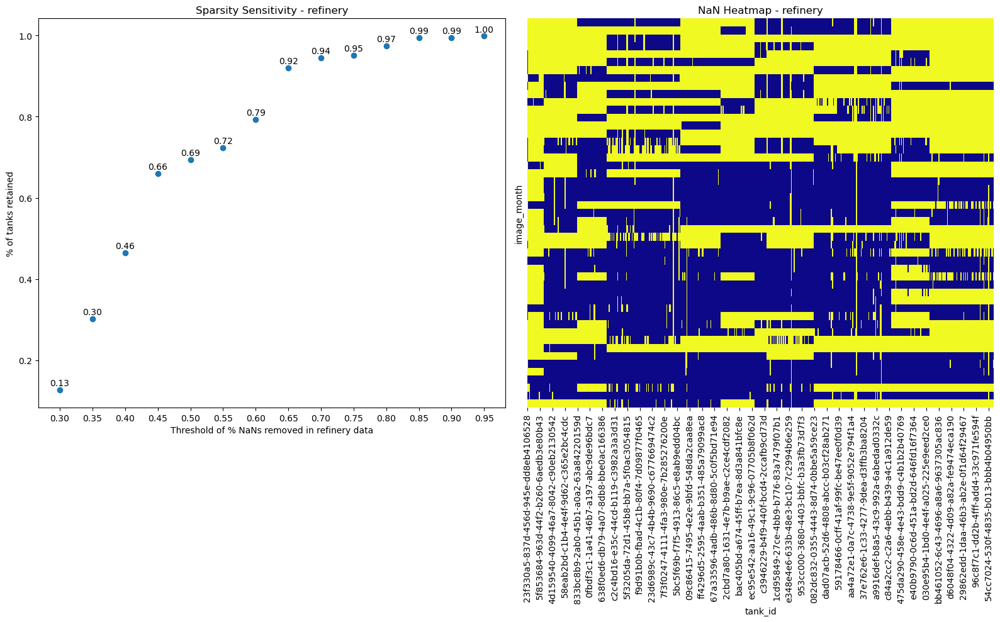

[REFINERY] NaN Percentage for 'fill_pct': 45.04%


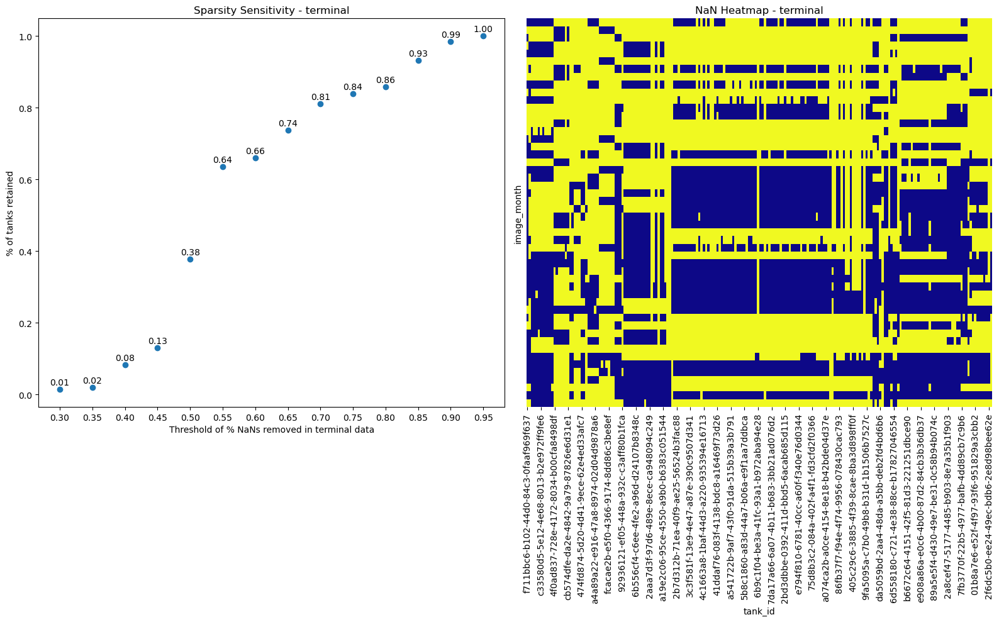

[TERMINAL] NaN Percentage for 'fill_pct': 56.44%


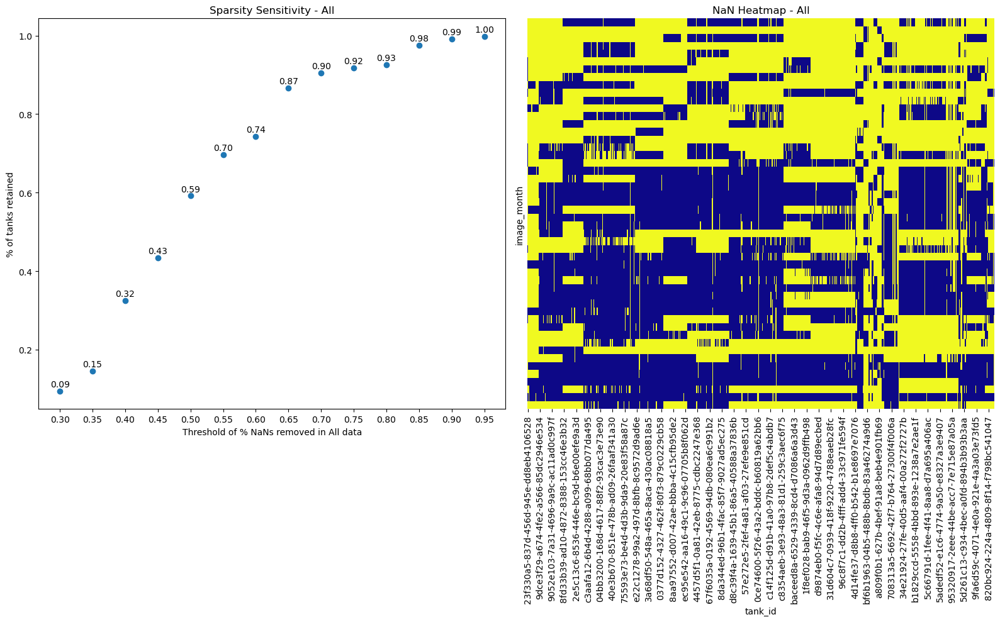

[ALL] NaN Percentage for 'fill_pct': 49.20%


In [360]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_clean_datasets(df, value_column, skip_months=15, plot=False):
    """
    Separates 'refinery' and 'terminal' data from a monthly tank dataset,
    pivots on 'image_month' vs 'tank_id', targets a specific value_column
    (like 'fill_pct', 'Location', 'tank farm'), and analyzes sparsity.

    Parameters:
    - df (pd.DataFrame): The full tank dataset.
    - value_column (str): The column to pivot and analyze (e.g., 'fill_pct').
    - skip_months (int): Number of initial months to skip in the time series.
    - plot (bool): Whether to show NaN threshold sensitivity and heatmap.

    Returns:
    - datasets (dict): {'refinery': DataFrame, 'terminal': DataFrame}
    - sparse_info (dict): Sparse tank percentages by threshold
    - filtered_na (pd.Series): NaN percentage per tank
    """

    # Separate by farm_type
    ref = df[df['farm_type'].str.contains('refinery', case=False, na=False)]
    term = df[df['farm_type'].str.contains('terminal', case=False, na=False)]

    # Pivot the value_column
    refinery_data = ref.pivot(index='image_month', columns='tank_id', values=value_column).iloc[skip_months:]
    refinery_data = refinery_data.reindex(sorted_ref_tank_ids, axis=1)
    terminal_data = term.pivot(index='image_month', columns='tank_id', values=value_column).iloc[skip_months:]
    terminal_data = terminal_data.reindex(sorted_term_tank_ids, axis=1)
    all_data = df.pivot(index='image_month', columns='tank_id', values=value_column).iloc[skip_months:]
    all_data = all_data.reindex(sorted_tank_ids, axis=1)
    # Store datasets
    datasets = {'refinery': refinery_data, 'terminal': terminal_data, 'All': all_data}

    sparse_info = {}
    filtered_na = {}

    for tank_type in datasets:
        data = datasets[tank_type]
        total_tanks = len(data.columns)

        filtered = data.isna().mean()
        filtered_na[tank_type] = filtered

        # Sensitivity curve
        x = np.arange(0.3, 1, 0.05)
        sensitivity = [1 - (sum(filtered > j) / total_tanks) for j in x]
        sparse_info[tank_type] = dict(zip(x, sensitivity))

        if plot:
            fig, axes = plt.subplots(1, 2, figsize=(16, 10))

            # Scatter plot: sensitivity
            axes[0].scatter(x, sensitivity)
            axes[0].set_xticks(x)
            for xi, yi in zip(x, sensitivity):
                axes[0].annotate(f'{yi:.2f}', (xi, yi), textcoords="offset points", xytext=(0, 5), ha='center')
            axes[0].set_xlabel(f'Threshold of % NaNs removed in {tank_type} data')
            axes[0].set_ylabel('% of tanks retained')
            axes[0].set_title(f"Sparsity Sensitivity - {tank_type}")

            # Heatmap: NaNs
            sns.heatmap(data.isna(), cmap='plasma', cbar=False, yticklabels=False, ax=axes[1])
            axes[1].set_title(f"NaN Heatmap - {tank_type}")
            axes[1].set_xlabel("tank_id")
            axes[1].tick_params(axis='x', labelrotation=90)

            plt.tight_layout()
            plt.show()

        # Print overall NaN %
        nan_percentage = (data.isna().sum().sum() / data.size) * 100
        print(f"[{tank_type.upper()}] NaN Percentage for '{value_column}': {nan_percentage:.2f}%")

    return datasets, sparse_info, filtered_na


datasets, sparse_info, filtered_na = generate_clean_datasets(
    data_monthly,
    value_column='fill_pct',
    skip_months=0,
    plot=True
)

In [361]:
refinery_tanks = df.loc[df["farm_type"] == "REFINERY", "tank_id"].nunique()

# Count total unique tank IDs
total_tanks = df["tank_id"].nunique()

# Calculate the percentage of refinery tanks
refinery_percentage = (refinery_tanks / total_tanks) * 100
print(refinery_percentage)

70.27417027417027


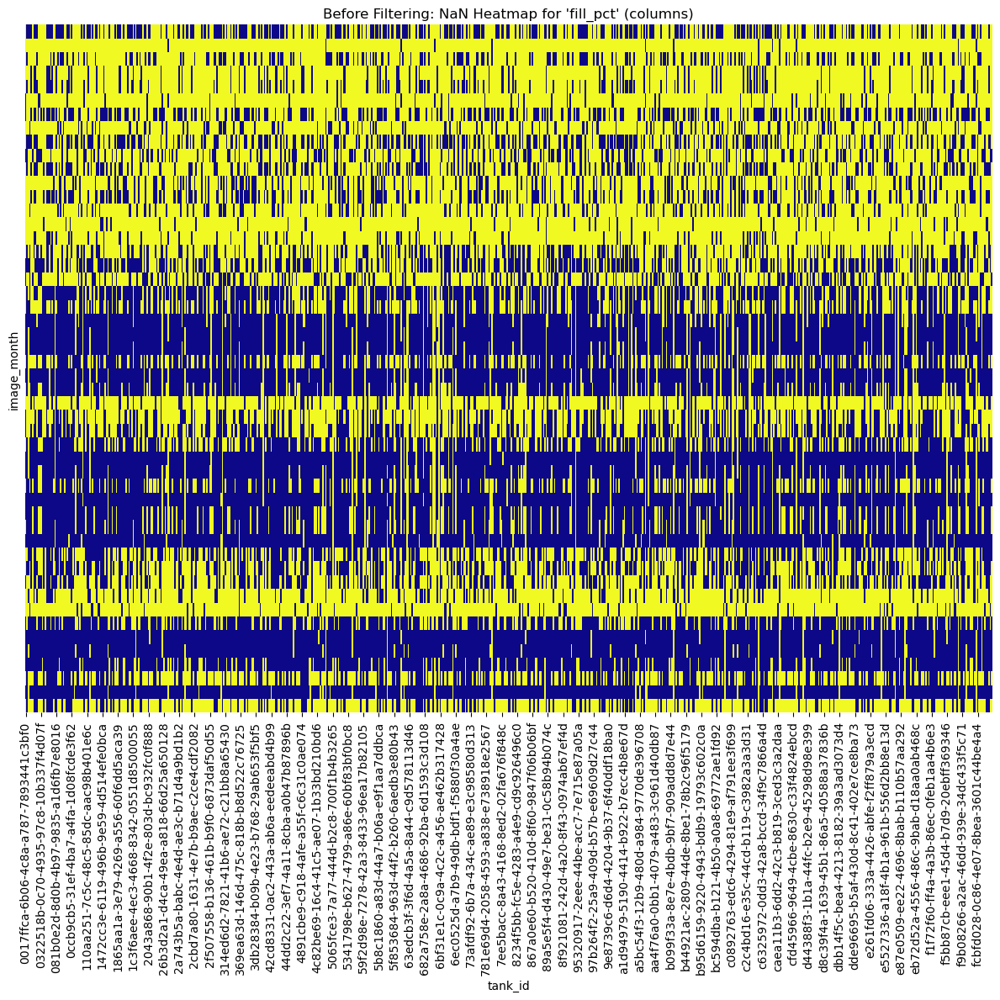

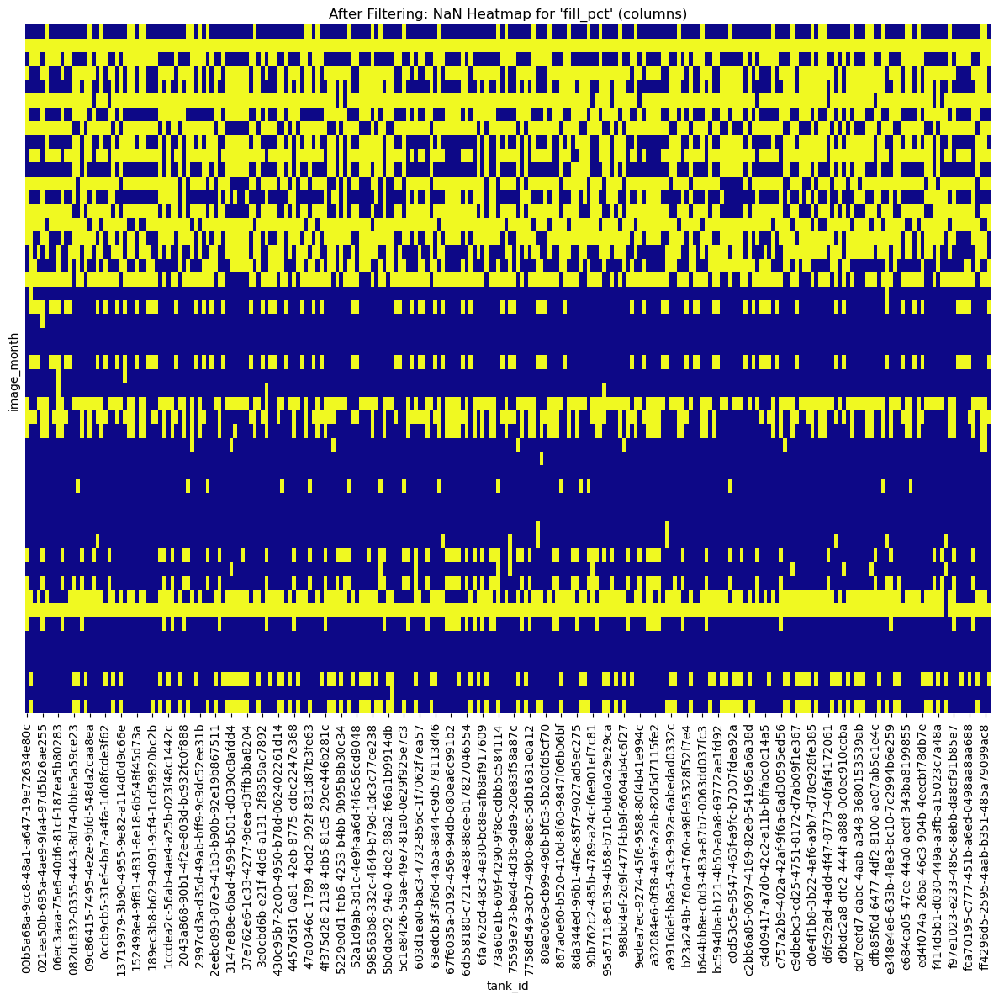

Removed 447 columns with > 40% NaNs.
['0017ffca-6b06-4c8a-a787-7893441c3bf0', '00d8f211-0c0f-48d8-877e-bc405db9cf2c', '00daeac9-dfb4-4553-8438-7bcbb9fce649', '01b8a7e6-e52f-4f97-93f6-951829a3cbb2', '02512c89-4a60-4d0b-813d-98321ca3f98b', '030e95b4-1bd0-4e4f-a025-225e9eed2ce0', '0322518b-0c70-4935-97c8-10b337f4d07f', '0348d023-8f50-4bcb-b88d-94b90130a5de', '037f9c2a-ff00-4b28-b153-599233e791fd', '07a15f99-dd94-4c7b-9671-4441858ed9fc', '07af47b8-0f68-4a45-a412-73a6c94dd3f2', '083f56fa-04d3-4431-b826-f0c941acb6b4', '09a1b1bb-1038-4806-bf3b-6a0206b562d9', '0ce3bf63-2275-42a3-8445-fc9f94639b10', '0ce74600-5f26-43a2-bddc-b60819a62bb6', '0cf80bb9-5b17-48fc-92dc-86ecf546ed40', '0da290eb-596d-4c0e-848a-234ffbc9b36b', '0dd683ef-e886-440e-b288-eebc325edfa7', '0e8d6d62-dc5a-49e8-aa59-7d11de21075e', '0fbdf3c1-1a41-46b7-a197-abc9de96bdc7', '0fe3e0a3-74e2-4116-b7e9-ae88661745a5', '10c8460b-0365-48c9-aa78-27e10d89e805', '1278d395-f6b1-4122-8ee8-9205065eb296', '12a46dc9-c4cd-4120-8c3e-f193867c4131', '1

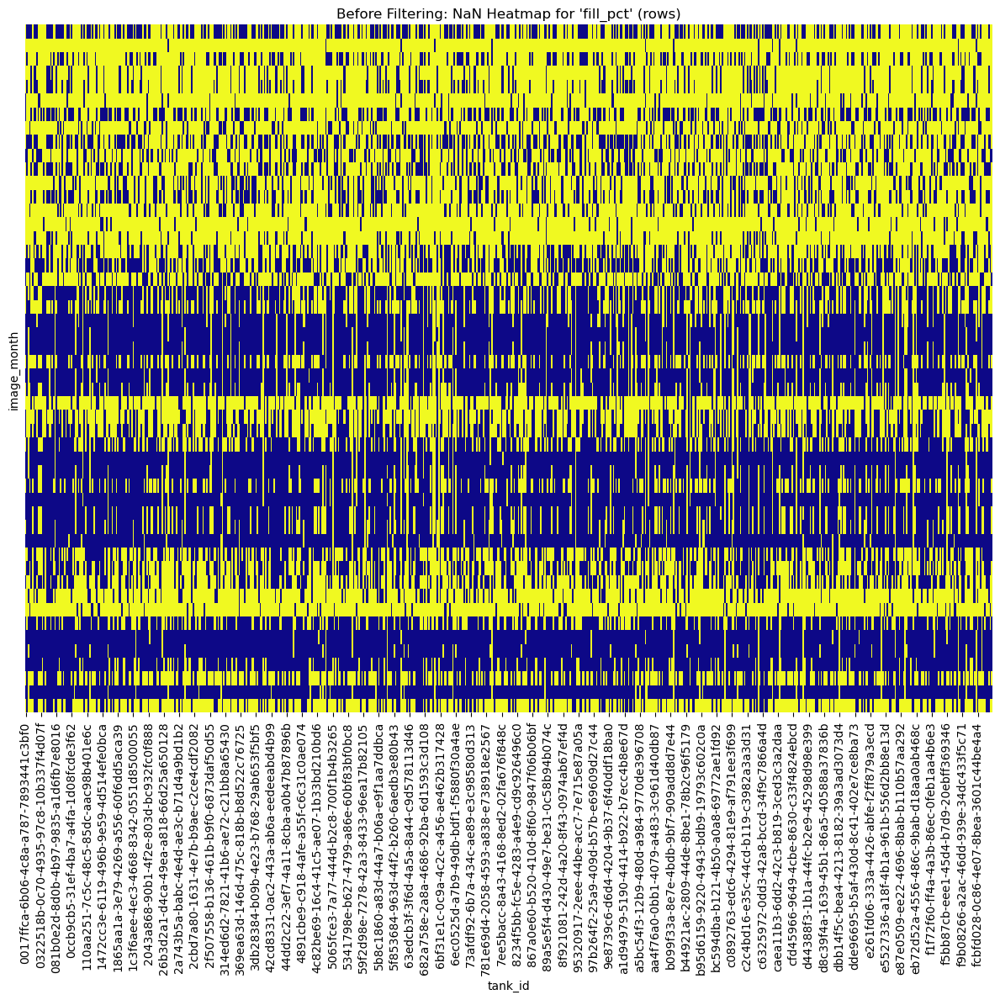

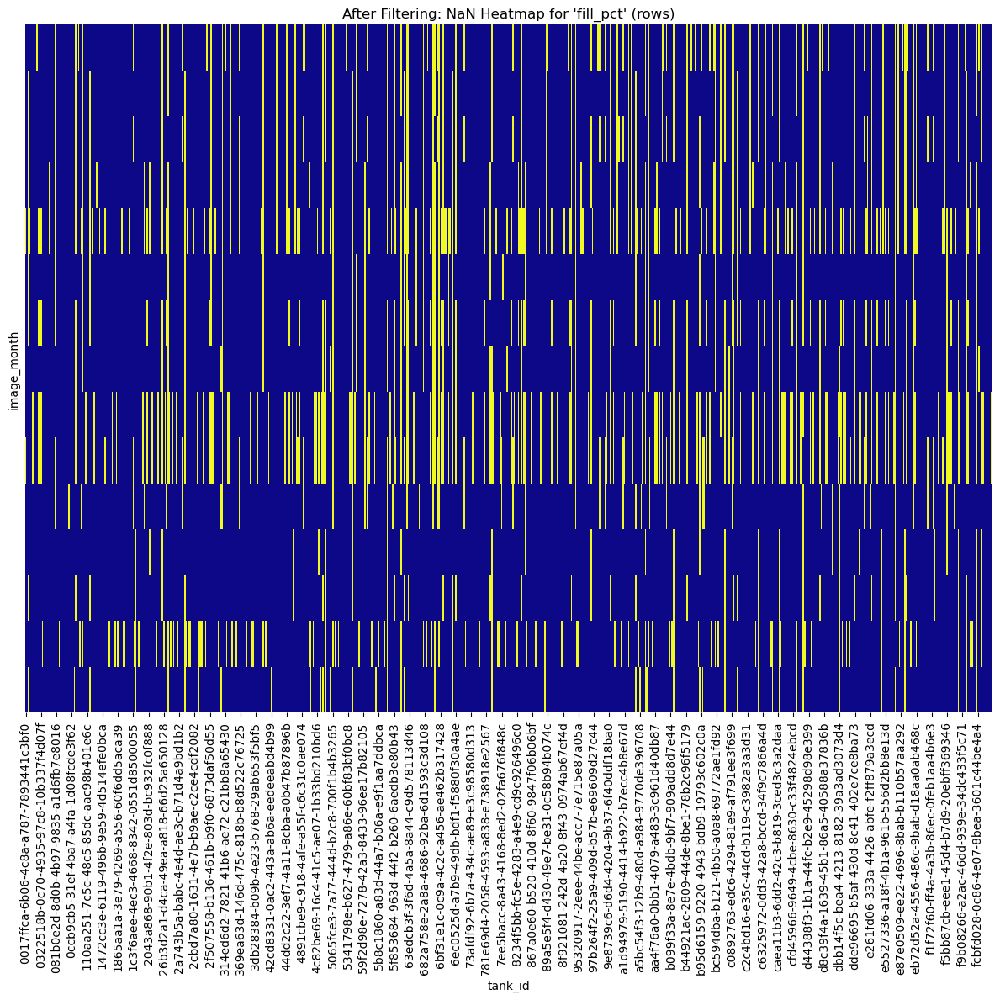

Removed 35 rows with > 30% NaNs.
['2014-01', '2014-02', '2014-03', '2014-04', '2014-05', '2014-06', '2014-07', '2014-08', '2014-10', '2014-11', '2014-12', '2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2016-03', '2016-06', '2016-07', '2016-08', '2016-09', '2016-12', '2017-05', '2017-06', '2017-07', '2017-08', '2017-09', '2017-10', '2018-02', '2018-04']


(15, 693)

In [362]:
def remove_sparse_tanks_or_months(
    df,
    target_column,
    nan_threshold=0.5,
    skip_months=0,
    axis='columns',  # 'columns' for tanks, 'rows' for months
    plot=False
):
    """
    Removes tanks (columns) or months (rows) that have more than `nan_threshold` NaNs
    for a specific target column in a pivoted image_month x tank_id matrix.

    Parameters:
    - df (pd.DataFrame): Input data.
    - target_column (str): Column to pivot (e.g., 'fill_pct').
    - nan_threshold (float): Max % NaNs allowed (0 to 1).
    - skip_months (int): Number of initial months to skip (applies only to rows).
    - axis (str): 'columns' to drop sparse tanks, 'rows' to drop sparse months.
    - plot (bool): Whether to show heatmaps before/after filtering.

    Returns:
    - pd.DataFrame: Cleaned pivot table.
    - list: List of removed tank_ids or months.
    """

    # Pivot table
    pivot = df.pivot(index='image_month', columns='tank_id', values=target_column)

    if axis == 'rows':
        pivot = pivot.iloc[skip_months:]

    # Show original heatmap
    if plot:
        plt.figure(figsize=(12, 12))
        sns.heatmap(pivot.isna(), cmap='plasma', cbar=False, yticklabels=False)
        plt.title(f"Before Filtering: NaN Heatmap for '{target_column}' ({axis})")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    # Compute NaN ratio across specified axis
    if axis == 'columns':
        na_ratio = pivot.isna().mean()
        to_remove = na_ratio[na_ratio > nan_threshold].index
        cleaned = pivot.drop(columns=to_remove)
    elif axis == 'rows':
        na_ratio = pivot.isna().mean(axis=1)
        to_remove = na_ratio[na_ratio > nan_threshold].index
        cleaned = pivot.drop(index=to_remove)
    else:
        raise ValueError("`axis` must be either 'columns' (tanks) or 'rows' (months)")

    # Show cleaned heatmap
    if plot:
        plt.figure(figsize=(12, 12))
        sns.heatmap(cleaned.isna(), cmap='plasma', cbar=False, yticklabels=False)
        plt.title(f"After Filtering: NaN Heatmap for '{target_column}' ({axis})")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    print(f"Removed {len(to_remove)} {axis} with > {nan_threshold*100:.0f}% NaNs.")
    return cleaned, list(to_remove)

cleaned_fill, removed_tanks = remove_sparse_tanks_or_months(
    df=data_monthly,
    target_column='fill_pct',
    nan_threshold=0.4,
    axis='columns',
    skip_months=15,
    plot=True
)

print(removed_tanks)

print(cleaned_fill.shape)

cleaned_fill, removed_months = remove_sparse_tanks_or_months(
    df=data_monthly,
    target_column='fill_pct',
    nan_threshold=0.3,
    axis='rows',
    skip_months=0,
    plot=True
)

print(removed_months)

cleaned_fill.shape

In [363]:
df.nunique()

tank_id                   693
farm_type                   2
region                      1
imaging_time              992
image_time_round_day      382
max_vol                   693
fill_pct                44196
tank volume             44204
scene_id                 1589
provider_scene_id         993
scene_source_id             6
Location                  693
tank farm                  27
expected_tank_vol       44204
tank_vol_check              1
geometry                  693
latitude                  692
longitude                 693
image_month                50
dtype: int64

In [364]:
data = df
data['image_time_round_day'] = pd.to_datetime(data['image_time_round_day'], dayfirst=True)


#Group into monthly data to better fill out the time series - MAYBE GROUP ACCORDING TO THE PERIOD OVER WHICH THE TIME SERIES IS SEASONAL
data['image_month'] = pd.to_datetime(data['image_time_round_day']).dt.to_period("M").astype(str)
static_tank_data = data[['tank_id', 'latitude', 'longitude', 'farm_type', 'tank farm', 'max_vol']].drop_duplicates()
data_monthly = data.groupby(['image_month', 'tank_id'], as_index=False).agg({'fill_pct':'mean', 'Location':'first', 'farm_type':'first', 'tank farm': 'first', 'max_vol': 'first'})
data_monthly_fill = data_monthly.pivot(index='image_month', columns = 'tank_id', values='fill_pct')
data_monthly_fill = data_monthly_fill.reindex(columns=sorted_tank_ids)

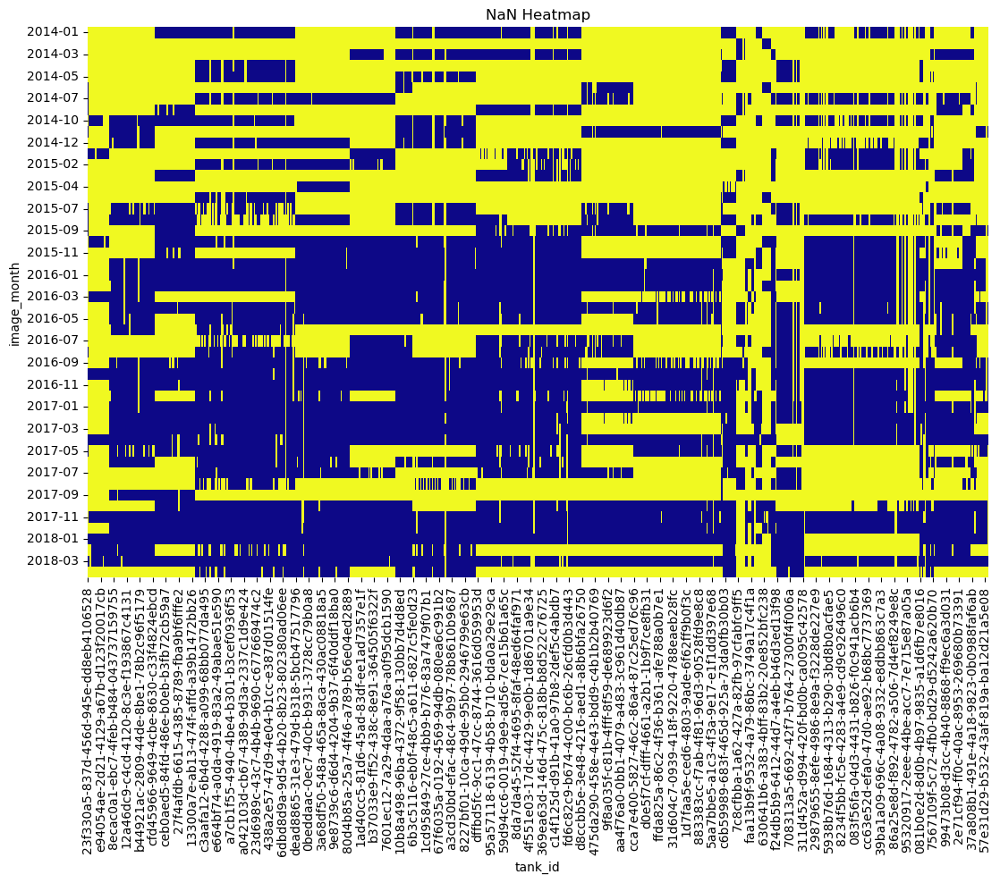

In [365]:
# Plot a heatmap of the missing data
plt.figure(figsize=(13, 8))
ax = plt.gca()
sns.heatmap(data_monthly_fill.isna(), cmap='plasma', cbar=False, ax=ax)
ax.set_title("NaN Heatmap")
ax.set_xlabel("tank_id")
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [366]:
(data_monthly_fill.isna().sum() == 0).sum()

0

In [367]:
(data_monthly_fill.isna().sum(axis = 1) == 0).sum()

0

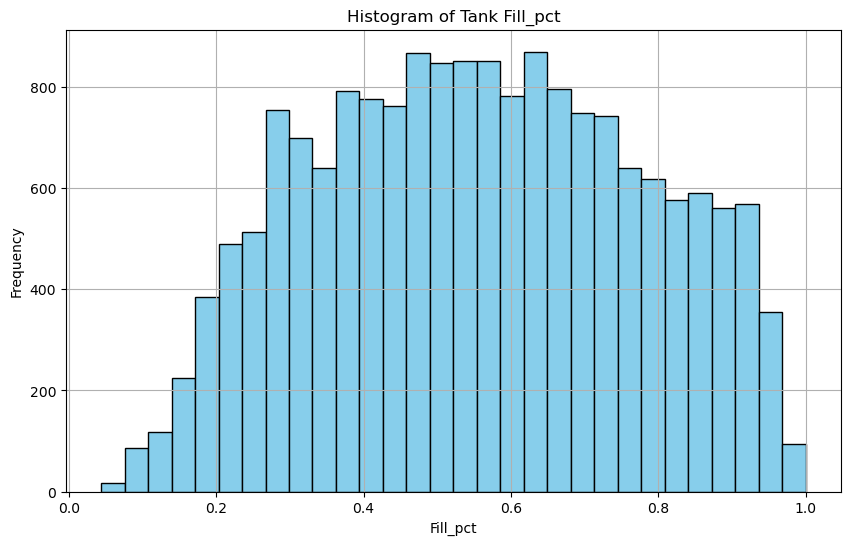

In [368]:
# Plot histogram
plt.figure(figsize=(10,6))
plt.hist(data_monthly_fill.values.ravel(), bins=30, edgecolor='black', color='skyblue')
plt.title('Histogram of Tank Fill_pct')
plt.xlabel('Fill_pct')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [369]:
from scipy.stats import anderson
# Flatten the DataFrame to a 1D array
data_flat = data_monthly_fill.values.ravel()

result = anderson(data_flat)
print("Anderson-Darling Test Statistic:", result.statistic)
for i, crit in enumerate(result.critical_values):
    sl, cv = result.significance_level[i], crit
    if result.statistic < crit:
        print(f"At the {sl}% level, data is normally distributed.")
    else:
        print(f"At the {sl}% level, data is not normally distributed.")

Anderson-Darling Test Statistic: nan
At the 15.0% level, data is not normally distributed.
At the 10.0% level, data is not normally distributed.
At the 5.0% level, data is not normally distributed.
At the 2.5% level, data is not normally distributed.
At the 1.0% level, data is not normally distributed.


In [370]:
# Total number of missing values in data_monthly_fill
missing_count = data_monthly_fill.isna().sum().sum()

# Total number of elements in the DataFrame
total_elements = data_monthly_fill.size

# Calculate the percentage of missing data
pct_missing = (missing_count / total_elements) * 100

print(f"Missing data constitutes {pct_missing:.2f}% of the total dataset.")


Missing data constitutes 49.20% of the total dataset.


In [371]:
import pandas as pd

def prune_missingness(df, threshold=5):
    """
    Iteratively removes the worst row or column until the overall missingness
    percentage falls below the specified threshold.
    
    Parameters:
      df (pd.DataFrame): The input DataFrame.
      threshold (float): The maximum allowed overall missingness percentage.
                         For example, threshold=5 means 5% missing data allowed.
    
    Returns:
      pruned_df (pd.DataFrame): The pruned DataFrame.
      dropped_rows (list): List of row indices that were removed.
      dropped_cols (list): List of column names that were removed.
    """
    pruned_df = df.copy()
    dropped_rows = []
    dropped_cols = []
    
    while True:
        # Calculate overall missingness
        total_cells = pruned_df.shape[0] * pruned_df.shape[1]
        if total_cells == 0:
            # Nothing left in the DataFrame
            break
        total_missing = pruned_df.isna().sum().sum()
        overall_missing_pct = (total_missing / total_cells) * 100
        
        # If overall missingness is below the threshold, exit loop.
        if overall_missing_pct <= threshold:
            break
        
        # Calculate missing ratio for each row and column
        row_missing_ratio = pruned_df.isna().sum(axis=1) / pruned_df.shape[1]
        col_missing_ratio = pruned_df.isna().sum(axis=0) / pruned_df.shape[0]
        
        # Identify the worst row and worst column missing ratios
        worst_row_ratio = row_missing_ratio.max() if not row_missing_ratio.empty else -1
        worst_col_ratio = col_missing_ratio.max() if not col_missing_ratio.empty else -1
        
        # Remove the one (row or column) with the highest missing ratio
        if worst_row_ratio >= worst_col_ratio:
            worst_row = row_missing_ratio.idxmax()
            pruned_df = pruned_df.drop(index=worst_row)
            dropped_rows.append(worst_row)
            #print(f"Dropped row '{worst_row}' with missing ratio {worst_row_ratio:.2f}")
        else:
            worst_col = col_missing_ratio.idxmax()
            pruned_df = pruned_df.drop(columns=worst_col)
            dropped_cols.append(worst_col)
            #print(f"Dropped column '{worst_col}' with missing ratio {worst_col_ratio:.2f}")
    
    print(f"Final overall missingness: {overall_missing_pct:.2f}%")
    return pruned_df, dropped_rows, dropped_cols

# Example usage:
pruned_df, dropped_rows, dropped_cols = prune_missingness(data_monthly_fill, threshold=5)
pruned_df


Final overall missingness: 3.94%


tank_id,a00f7d99-783a-44d0-a2d6-b9f1f9b32d16,9dce3f29-a674-4fe2-a566-85dc2946e534,8eed4d12-1fbb-40d9-a669-545534289a3c,8ecac0a1-ebc7-4feb-b484-043737159755,8844309e-5308-4c6b-925b-bf599ae1ae13,85ec5383-c38d-4f04-a419-15387df1525d,7f49b42e-fb1d-43c1-b525-eed3ee07eb03,66402e3e-bc81-4ff4-abaa-1f47329f096d,49e98ea1-d1f4-4313-94c2-835648109bbd,4d159540-4099-46a7-8042-c90eb2130542,...,22bbd253-cd37-48c6-a01d-6583550d3c4b,7fb3770f-22b5-4977-bafb-4dd89cb7c9b6,37a808b1-491e-4a18-9823-0b0988faf6ab,1f4a7c4e-f6f0-4f56-b14e-61d33d000611,820bc924-224a-4809-8f14-f798bc541047,01b8a7e6-e52f-4f97-93f6-951829a3cbb2,1807da43-44b6-4074-951e-0df0ea104b68,26bb1b69-7609-4d58-8af8-6fdf4eb7c497,3dd24217-cf05-4aeb-befb-11ed832e449c,57e31d29-b532-43af-819a-ba12d21a5e08
image_month,,,,,,,,,,,,,,,,,,,,,
2015-12,0.917731,0.725634,0.485267,0.299305,0.768182,0.806941,0.495567,0.299262,0.594608,0.455563,...,0.660505,0.562972,0.566017,0.905499,0.637707,0.413242,0.557615,0.646301,0.729286,0.439080
2016-01,0.511822,0.754575,0.459629,0.290869,0.709984,0.843047,0.510819,0.530692,0.539998,0.390128,...,0.783501,0.603196,0.605396,0.851539,0.638624,0.544788,0.808898,0.690350,0.664796,0.418421
2016-02,NaN,0.868179,0.455791,0.327825,0.716331,0.772494,0.373403,0.656115,0.786672,0.399647,...,0.899070,0.633520,0.622326,0.819638,0.637482,0.254823,0.407915,0.677107,0.718650,0.348379
2016-04,0.896998,0.638051,0.941505,0.379137,0.783111,0.961978,0.762216,0.425133,0.907008,0.556251,...,0.894370,0.719623,0.639342,0.863941,0.540286,0.380788,0.740430,0.456720,0.916587,0.374598
2016-05,0.839945,0.637264,0.882923,0.451655,0.906349,0.908145,0.836556,0.845405,0.903293,0.649322,...,0.804195,NaN,0.725468,0.809590,0.585624,0.635567,0.703896,0.458678,0.730908,0.520561
2016-10,0.921652,0.871260,0.903580,0.293643,0.815302,0.865985,0.767135,0.386395,0.726651,0.410067,...,0.698196,0.715703,0.652919,0.828138,0.679631,0.242514,0.675876,0.692538,0.795836,0.332736
2016-11,0.863368,0.294950,0.729476,0.324161,0.729868,0.580028,0.629639,0.700460,0.735934,0.482576,...,0.599080,0.576807,0.545837,0.849407,0.641758,0.257243,0.346606,0.636453,0.759676,0.412725
2017-01,0.896599,0.750626,0.679377,0.321905,0.693386,0.920570,0.625379,0.596843,0.578615,0.458463,...,0.516248,NaN,0.726128,0.800571,0.779499,0.346376,0.863644,0.804078,0.720961,0.418926
2017-02,0.695503,0.728708,0.907136,0.322092,0.773650,0.422360,0.479926,0.365806,0.672829,0.419864,...,0.905036,0.672791,0.653271,0.845645,NaN,NaN,NaN,NaN,NaN,NaN


Final overall missingness: 0.00%
Threshold 0%: 78.24% of original data lost
(14, 377)


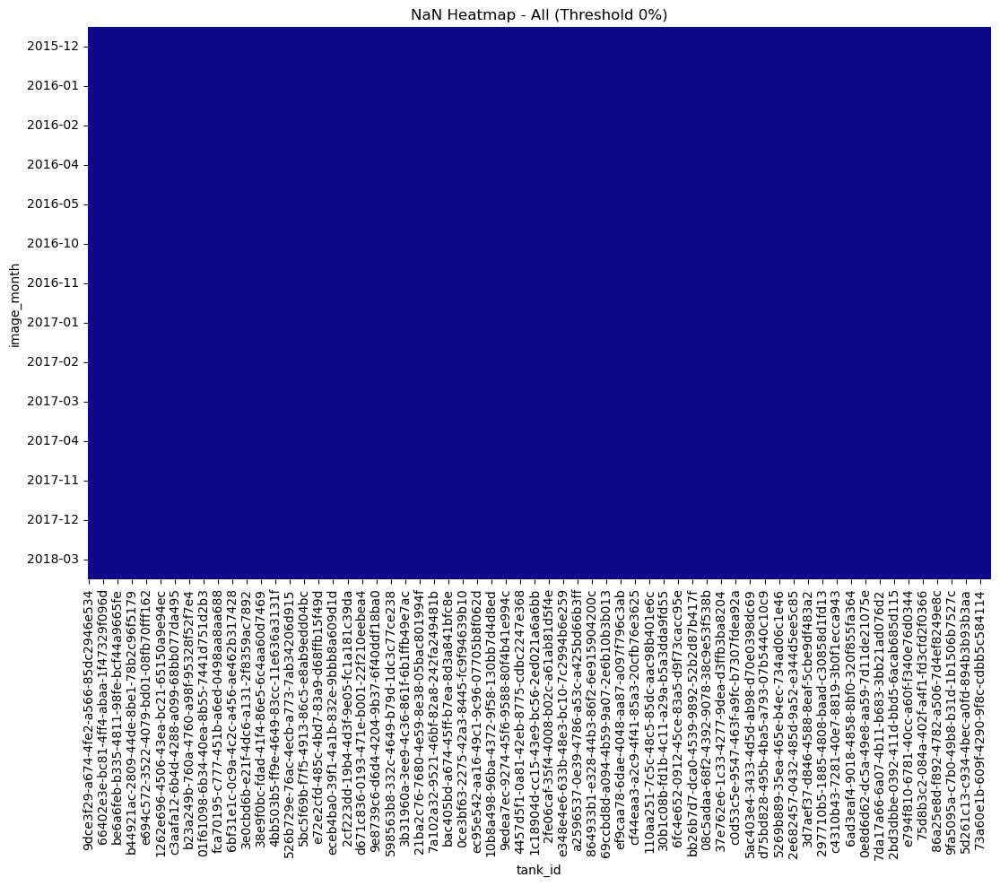

Final overall missingness: 3.94%
Threshold 5%: 67.16% of original data lost
(15, 531)


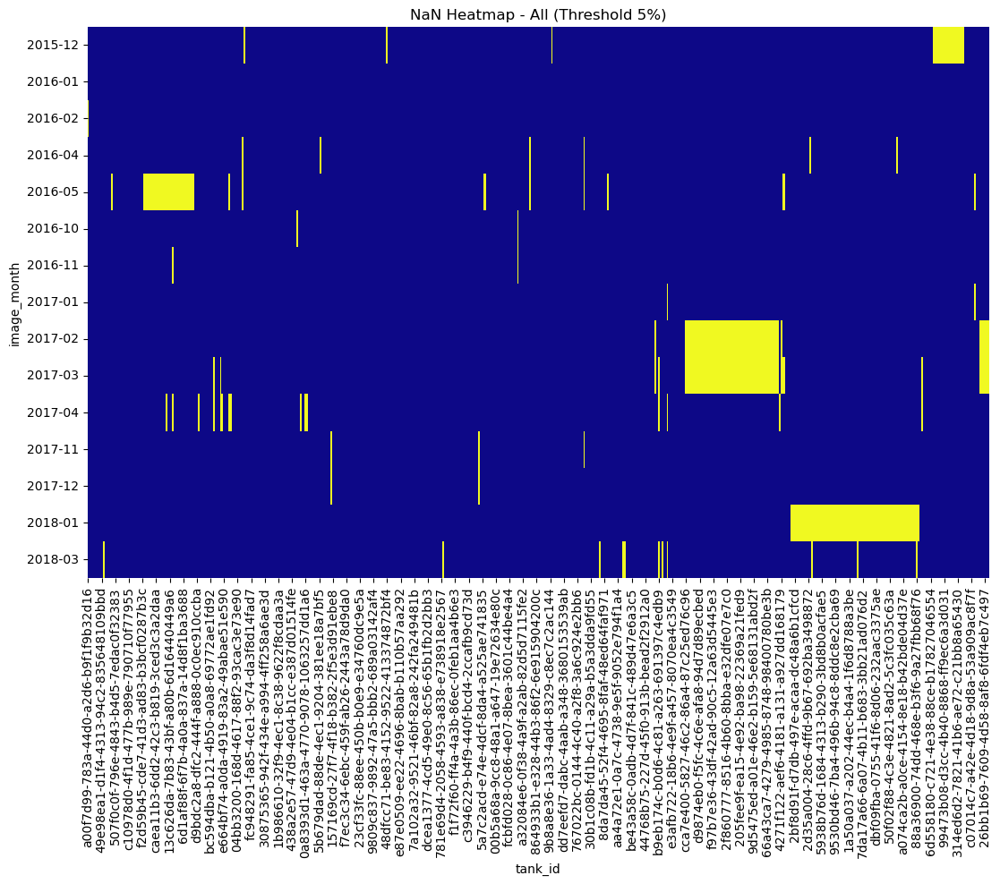

Final overall missingness: 9.61%
Threshold 10%: 55.98% of original data lost
(19, 562)


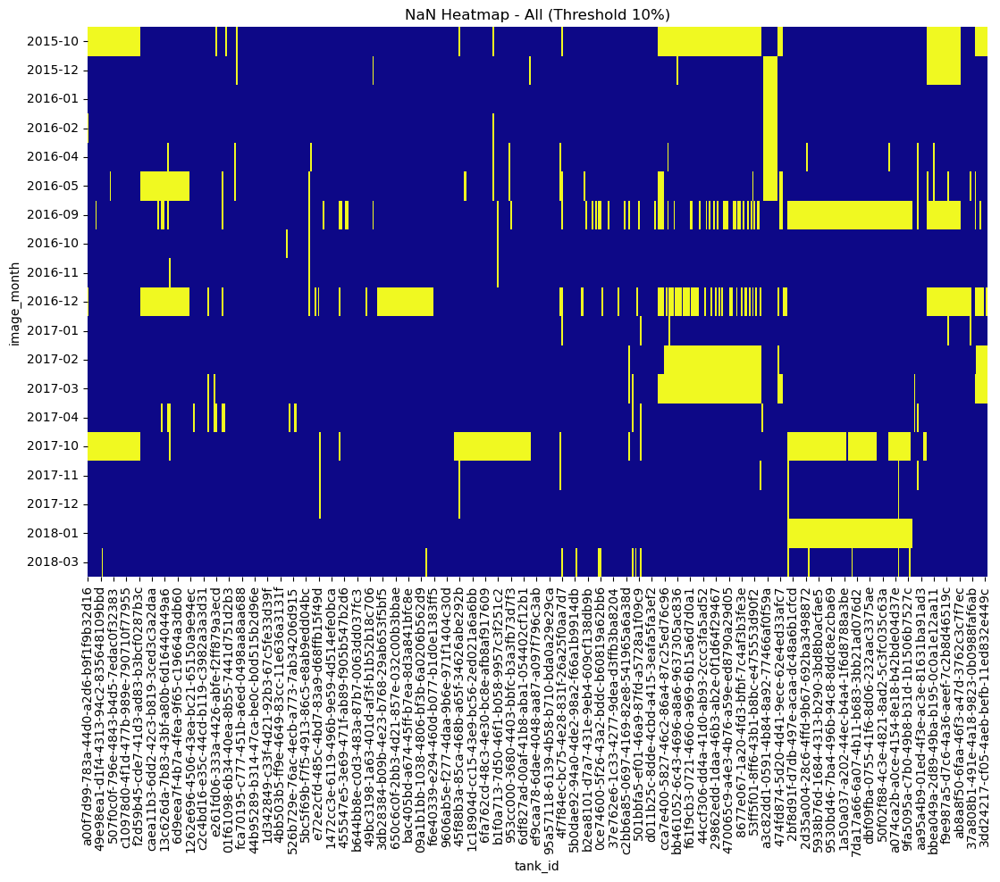

Final overall missingness: 14.32%
Threshold 15%: 47.01% of original data lost
(21, 612)


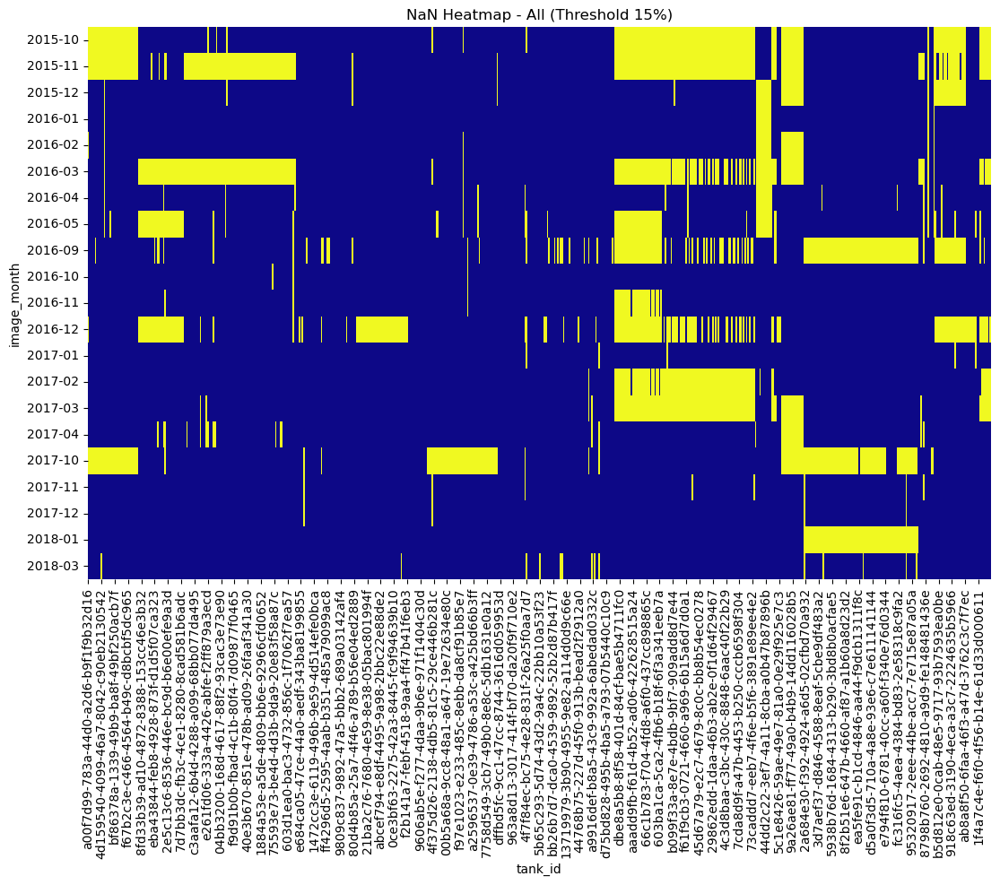

Final overall missingness: 19.74%
Threshold 20%: 35.79% of original data lost
(25, 623)


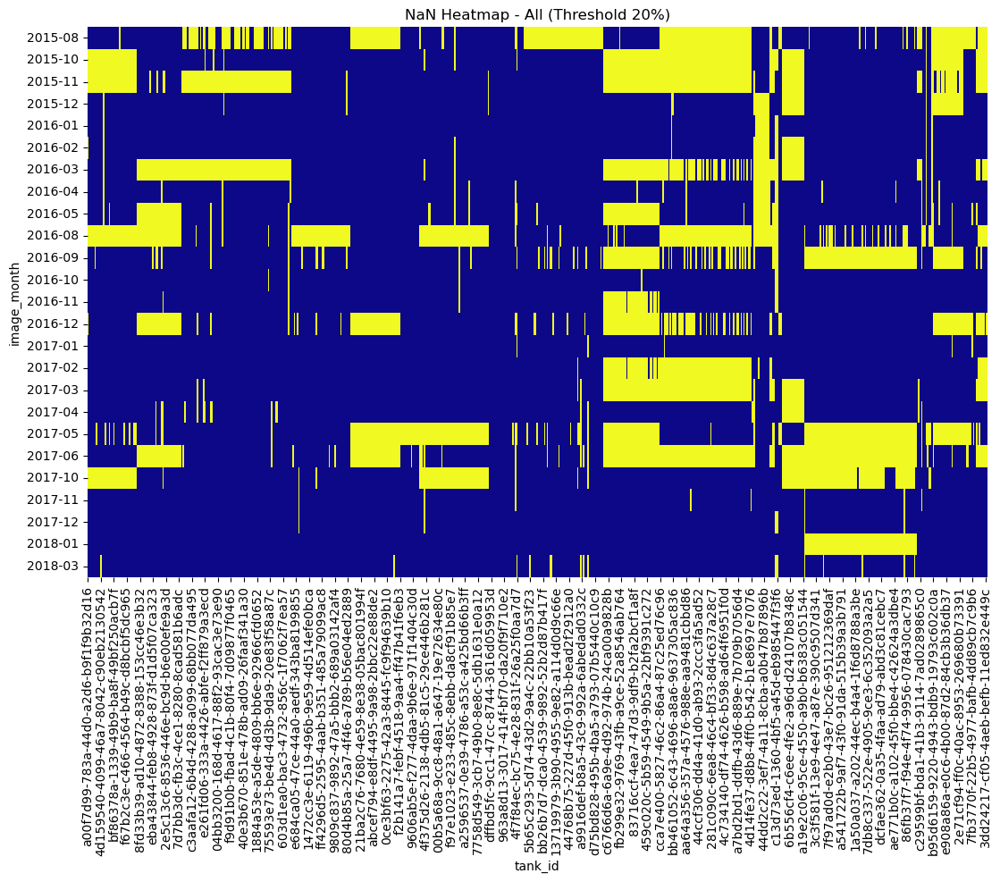

Final overall missingness: 24.05%
Threshold 25%: 27.27% of original data lost
(28, 630)


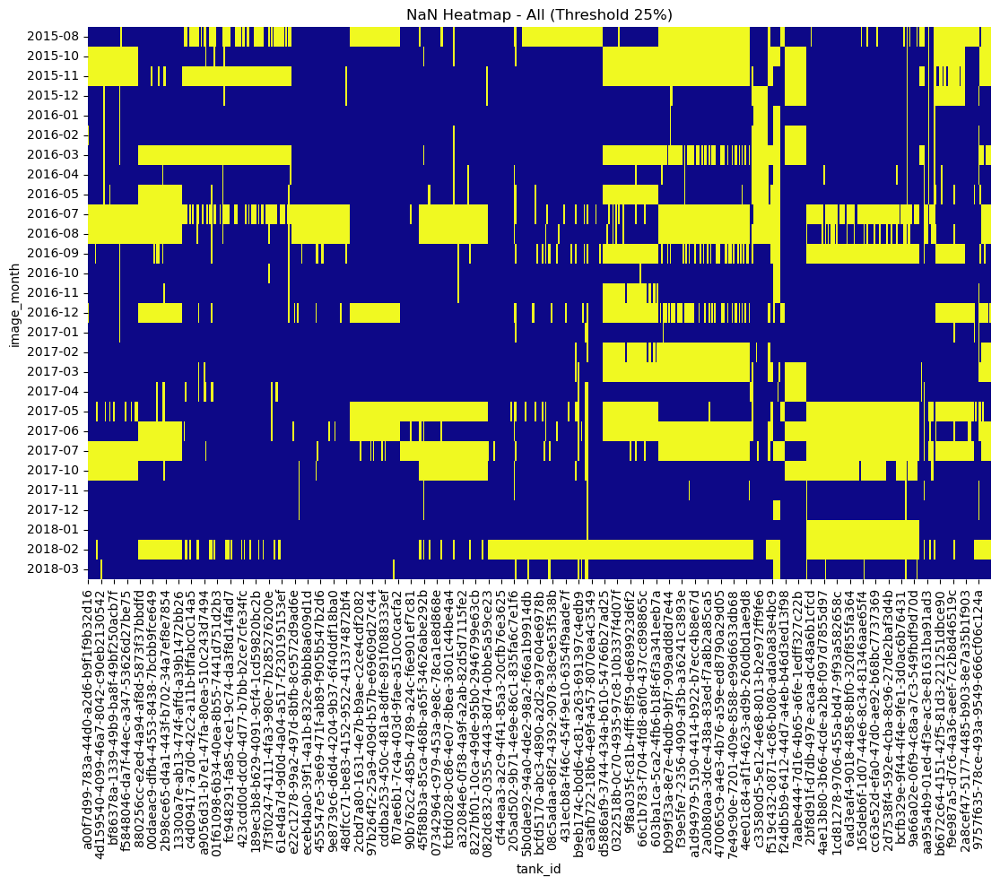

Final overall missingness: 29.97%
Threshold 30%: 15.77% of original data lost
(31, 659)


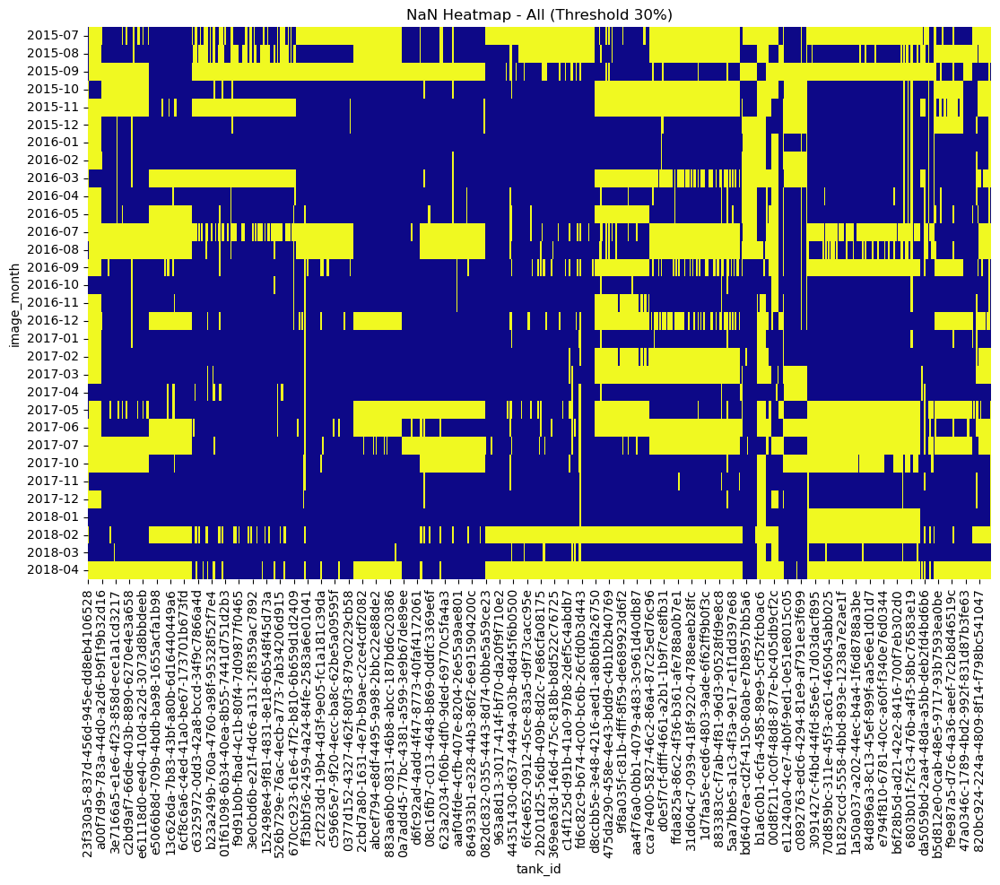

Final overall missingness: 34.90%
Threshold 35%: 6.53% of original data lost
(33, 687)


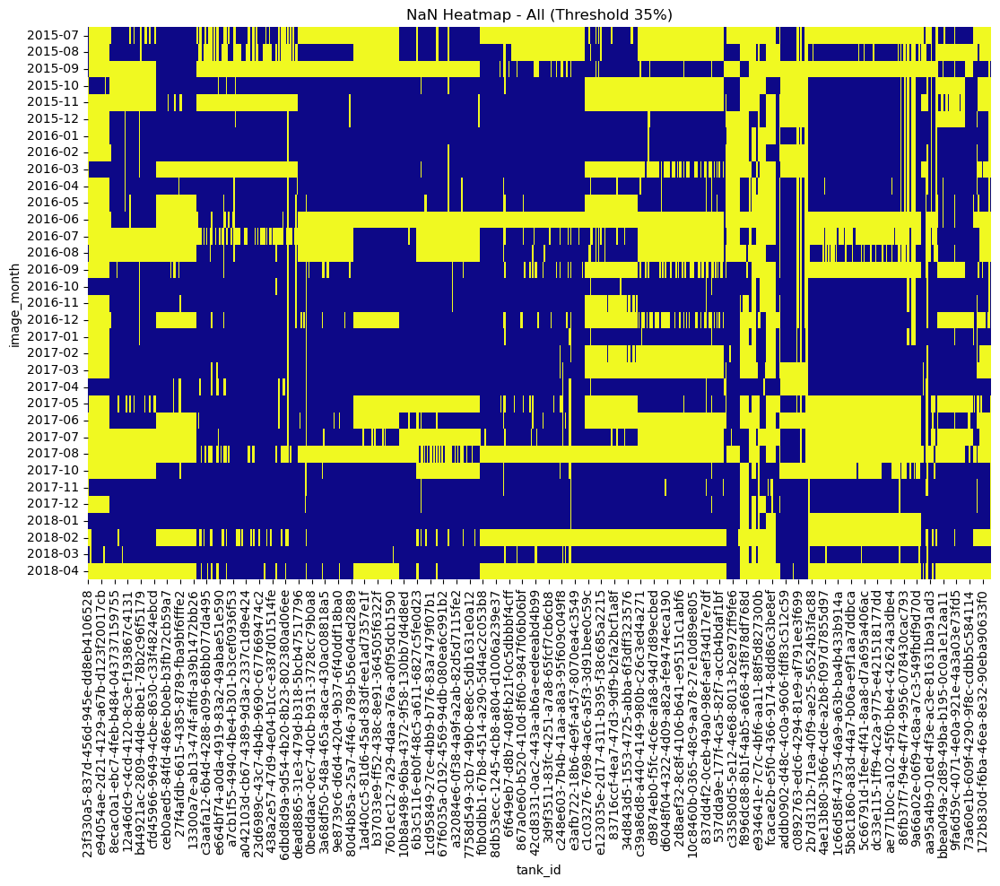

Final overall missingness: 38.44%
Threshold 40%: 0.00% of original data lost
(35, 693)


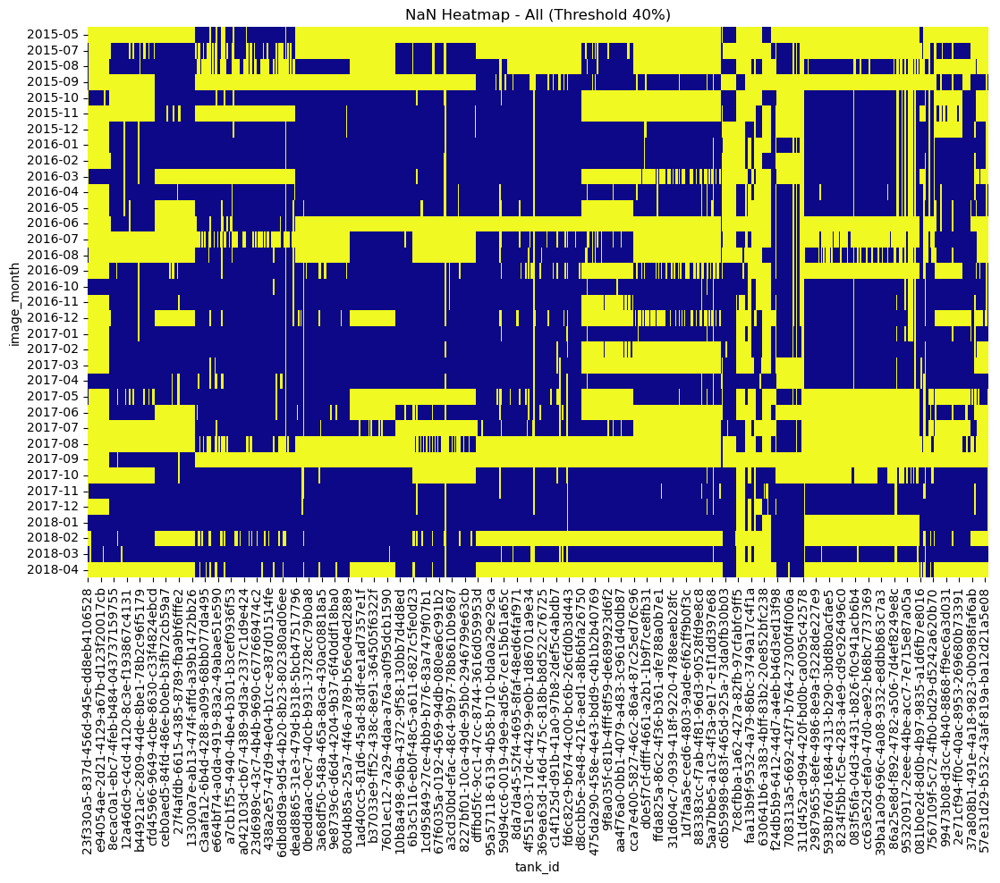

Final overall missingness: 38.44%
Threshold 45%: 0.00% of original data lost
(35, 693)


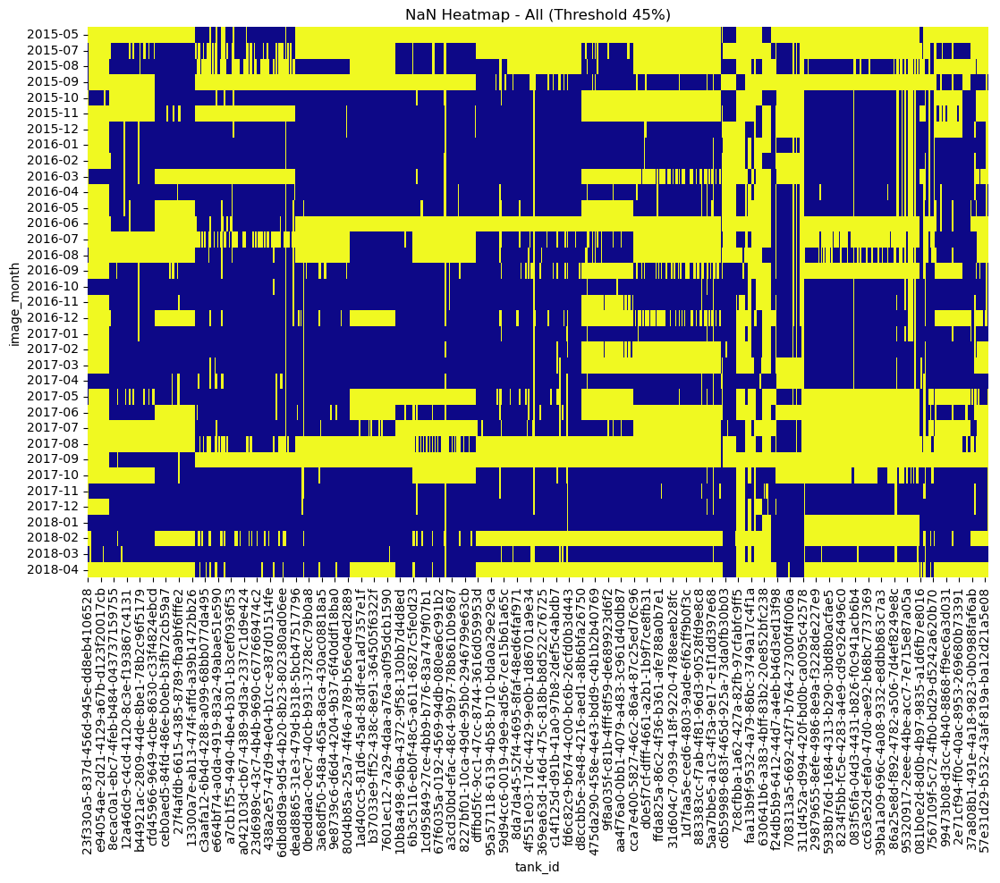

Final overall missingness: 38.44%
Threshold 50%: 0.00% of original data lost
(35, 693)


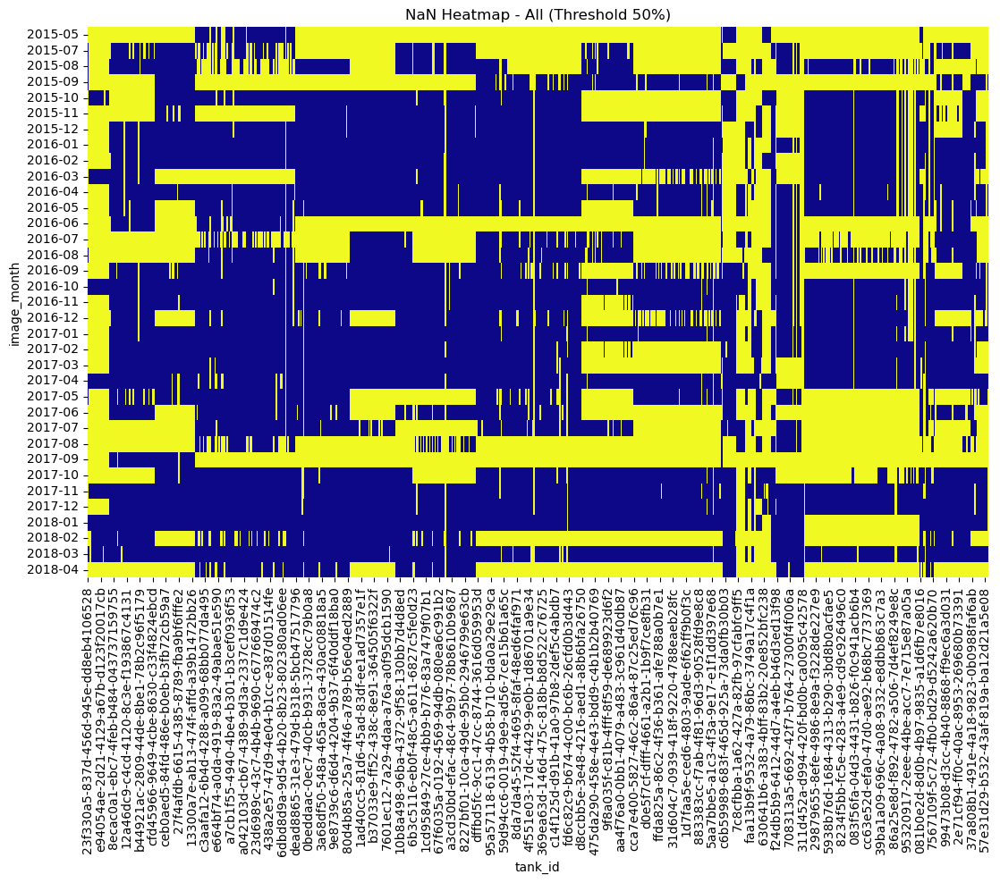

{0: 78.23953823953823, 5: 67.16141001855287, 10: 55.976087404658834, 15: 47.01298701298701, 20: 35.78643578643579, 25: 27.272727272727273, 30: 15.774067202638632, 35: 6.530612244897959, 40: 0.0, 45: 0.0, 50: 0.0}


In [372]:

def evaluate_missingness_pruning(df, sorted_tank_ids, threshold_step=5, max_threshold=100):
    """
    Evaluates the pruning process at intervals of threshold_step (e.g., 5%).
    For each threshold, the function prunes the DataFrame and calculates how 
    much of the original data (in total number of cells) has been lost.
    It also plots a heatmap of missing values using the reindexed columns.
    
    Parameters:
      df (pd.DataFrame): The original DataFrame.
      sorted_tank_ids (list-like): List of tank_id values in the desired order.
      threshold_step (int): Interval for thresholds (default 5).
      max_threshold (int): Maximum threshold to evaluate (default 100).
      
    Returns:
      results (dict): A dictionary where keys are threshold values and values 
                      are the percentage of original cells lost.
    """
    original_cells = df.shape[0] * df.shape[1]
    results = {}
    
    # Evaluate thresholds from threshold_step to max_threshold at the given intervals.
    for t in range(0, max_threshold + 1, threshold_step):
        pruned_df, dropped_rows, dropped_cols = prune_missingness(df, threshold=t)
        remaining_cells = pruned_df.shape[0] * pruned_df.shape[1]
        lost_pct = 100 * (original_cells - remaining_cells) / original_cells
        results[t] = lost_pct
        print(f"Threshold {t}%: {lost_pct:.2f}% of original data lost")
        
        # Reindex columns based on sorted_tank_ids
        all_data = pruned_df.reindex(columns=sorted_tank_ids)
        # Drop rows and columns that are completely empty
        all_data = all_data.dropna(how="all")
        all_data = all_data.dropna(axis="columns", how="all")
        print(all_data.shape)
        # Plot a heatmap of the missing data
        plt.figure(figsize=(13, 8))
        ax = plt.gca()
        sns.heatmap(all_data.isna(), cmap='plasma', cbar=False, ax=ax)
        ax.set_title(f"NaN Heatmap - All (Threshold {t}%)")
        ax.set_xlabel("tank_id")
        ax.tick_params(axis='x', labelrotation=90)
        plt.show()
    
    return results

results = evaluate_missingness_pruning(data_monthly_fill[15:], sorted_tank_ids, threshold_step=5, max_threshold=50)
print(results)

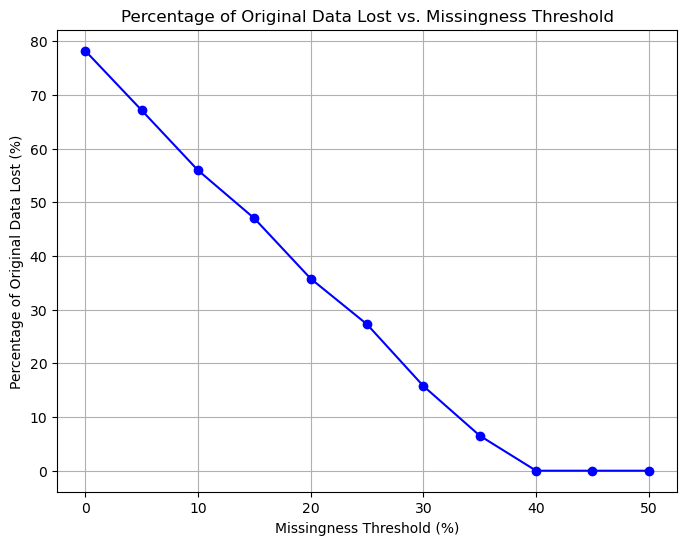

In [373]:
# Extract sorted thresholds and lost percentages
thresholds = results.keys()
lost_percentages = [results[t] for t in thresholds]

# Create a line plot
plt.figure(figsize=(8, 6))
plt.plot(thresholds, lost_percentages, marker='o', color='blue', linestyle='-')
plt.title("Percentage of Original Data Lost vs. Missingness Threshold")
plt.xlabel("Missingness Threshold (%)")
plt.ylabel("Percentage of Original Data Lost (%)")
plt.grid(True)
plt.show()

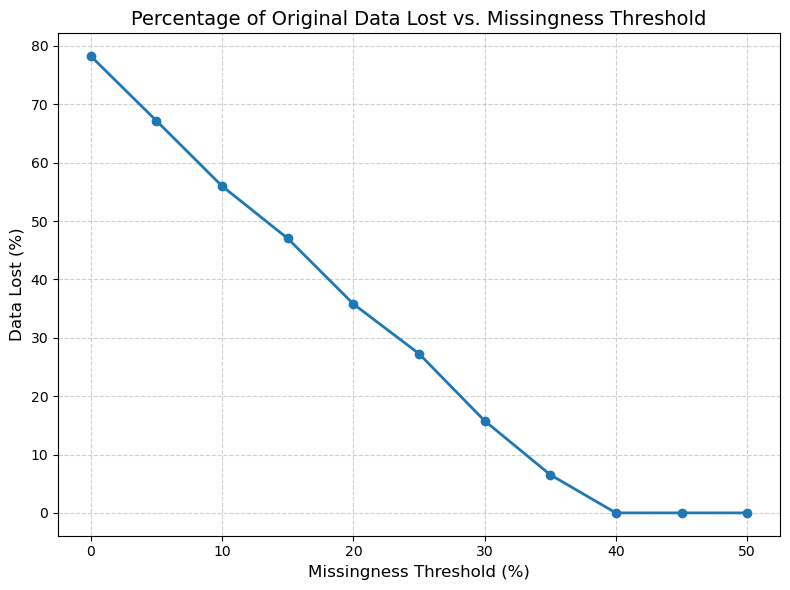

In [419]:
# Extract sorted thresholds and lost percentages
thresholds = list(results.keys())
lost_percentages = [results[t] for t in thresholds]

plt.figure(figsize=(8, 6))
plt.plot(thresholds, lost_percentages, marker='o', linewidth=2, markersize=6)

# Labeling and grid
plt.title("Percentage of Original Data Lost vs. Missingness Threshold", fontsize=14)
plt.xlabel("Missingness Threshold (%)", fontsize=12)
plt.ylabel("Data Lost (%)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

<Axes: >

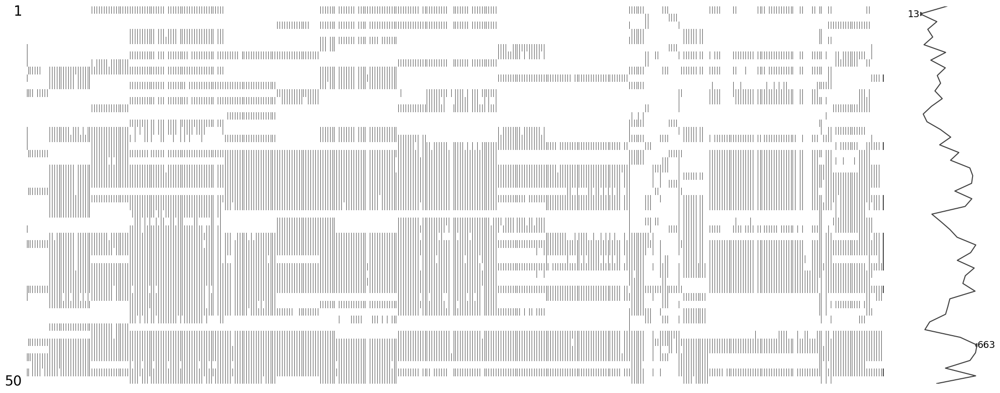

In [374]:
import missingno as msno
msno.matrix(data_monthly_fill)

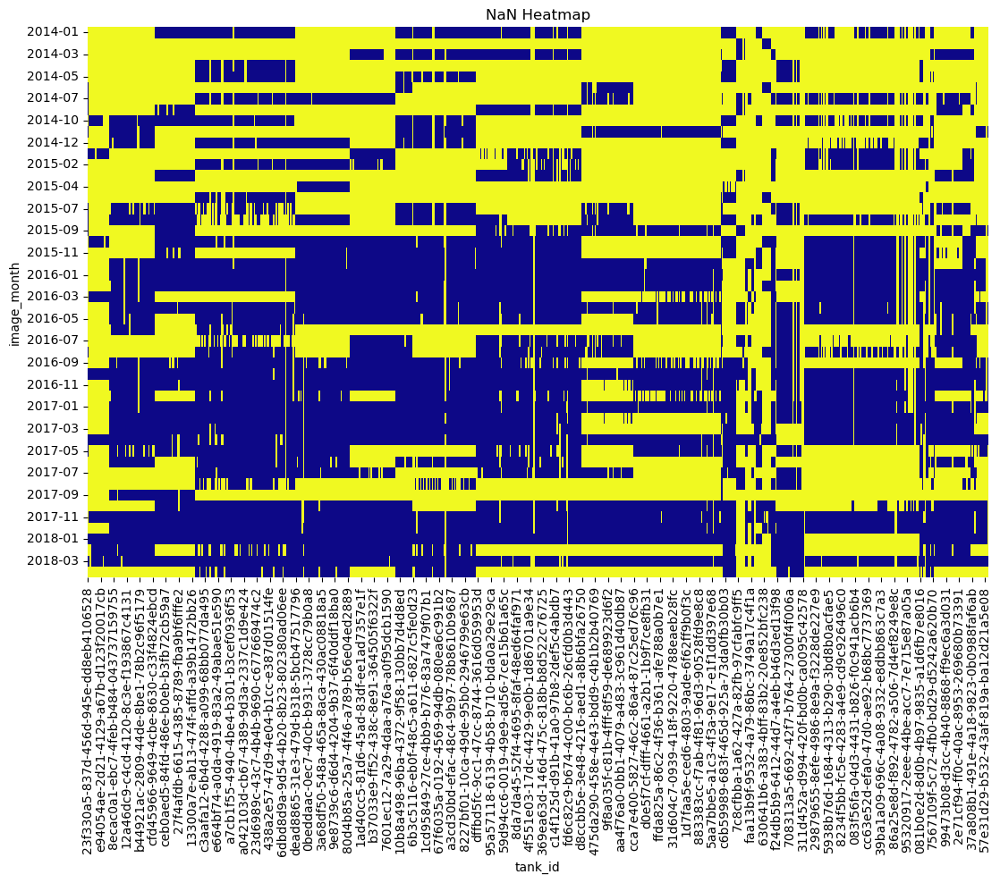

In [375]:
# Reindex columns based on sorted_tank_ids
all_data = data_monthly_fill.reindex(columns=sorted_tank_ids)
# Drop rows and columns that are completely empty
all_data = all_data.dropna(how="all")
all_data = all_data.dropna(axis="columns", how="all")

# Plot a heatmap of the missing data
plt.figure(figsize=(13, 8))
ax = plt.gca()
sns.heatmap(all_data.isna(), cmap='plasma', cbar=False, ax=ax)
ax.set_title("NaN Heatmap")
ax.set_xlabel("tank_id")
ax.tick_params(axis='x', labelrotation=90)
plt.show()

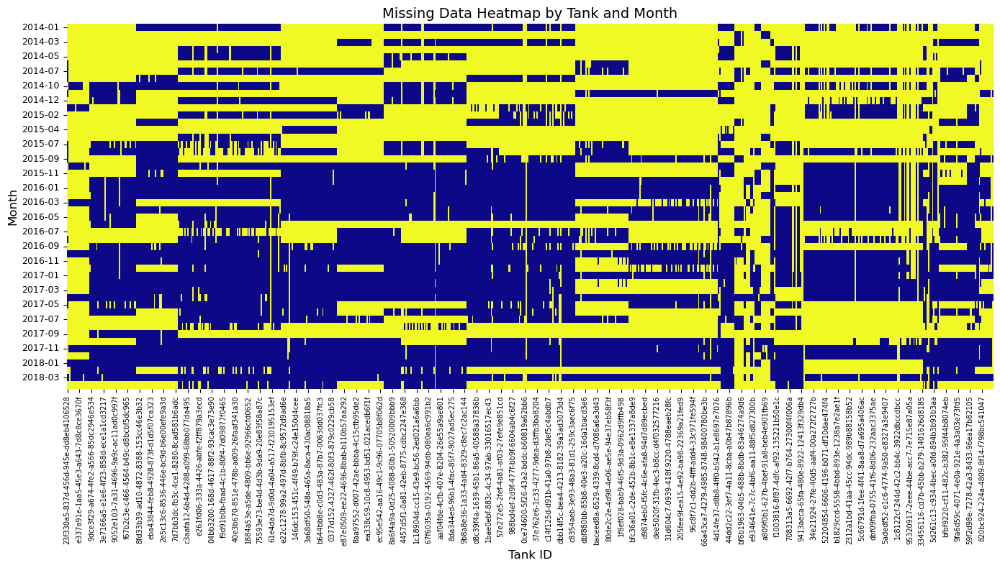

In [376]:
# Set the figure size and create axes
plt.figure(figsize=(14, 8))
ax = plt.gca()

# Plot heatmap
sns.heatmap(
    all_data.isna(),  # Custom colors: blue for data, yellow for NaNs
    cbar=False,
    cmap='plasma',
    ax=ax
)

# Enhancements
ax.set_title("Missing Data Heatmap by Tank and Month", fontsize=14)
ax.set_xlabel("Tank ID", fontsize=12)
ax.set_ylabel("Month", fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=7)
ax.tick_params(axis='y', labelsize=9)

# Improve layout
plt.tight_layout()
plt.show()

# Geographical Data

In [377]:
# Calculate volatility (standard deviation) for each tank's fill_pct over time
tank_volatility = data_monthly_fill.std()

# Calculate mean for each tank's fill_pct over time
tank_mean = data_monthly_fill.mean()

# Calculate missingness (fraction of missing values) for each tank's fill_pct over time
tank_missingness = data_monthly_fill.isna().mean()

# Map each tank's metrics to the static data using tank_id
static_tank_data['tank_volatility'] = static_tank_data['tank_id'].map(tank_volatility)
static_tank_data['tank_mean'] = static_tank_data['tank_id'].map(tank_mean)
static_tank_data['tank_missingness'] = static_tank_data['tank_id'].map(tank_missingness)




In [378]:
static_tank_data.head()

,tank_id,latitude,longitude,farm_type,tank farm,max_vol,tank_volatility,tank_mean,tank_missingness
0,082dc832-0355-4443-8d74-0bbe5a59ce23,30.475176,-91.207185,REFINERY,9456,208035.532654,0.188306,0.516936,0.38
1,110aa251-7c5c-48c5-85dc-aac98b401e6c,30.476981,-91.216927,REFINERY,9456,58083.897039,0.261824,0.668045,0.38
2,1bae0ebf-883c-4c34-97ab-33016517ec43,30.477322,-91.221016,REFINERY,9456,629576.864940,0.104001,0.765262,0.38
3,1ccdea2c-56ab-4ae4-a25b-023f48c1442c,30.475523,-91.207827,REFINERY,9456,29136.899392,0.083283,0.638567,0.36
4,205ad502-9b71-4e9e-86c1-835fa6c7e1f6,30.475175,-91.207860,REFINERY,9456,20953.719142,0.053964,0.772319,0.58


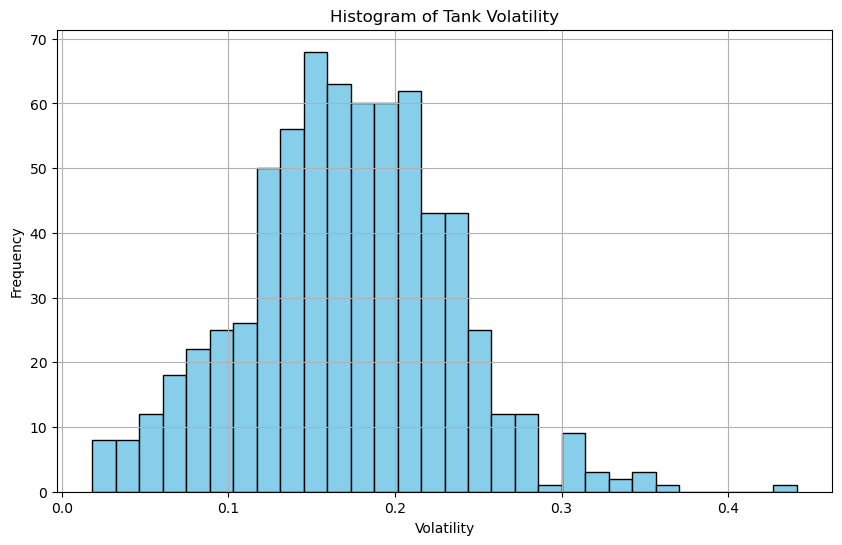

In [379]:
# Extract the volatility values
volatility_values = list(static_tank_data['tank_volatility'])

# Plot histogram
plt.figure(figsize=(10,6))
plt.hist(volatility_values, bins=30, edgecolor='black', color='skyblue')
plt.title('Histogram of Tank Volatility')
plt.xlabel('Volatility')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [380]:
m = folium.Map(location=[static_tank_data['latitude'].mean(),
                         static_tank_data['longitude'].mean()], zoom_start=5)
# Define a function to determine the marker color based on tank_volatility.
def get_color(volatility):
    # Calculate the 33rd and 66th percentiles from the tank_volatility column.
    p33 = np.nanpercentile(static_tank_data["tank_volatility"], 33)
    p66 = np.nanpercentile(static_tank_data["tank_volatility"], 66)
    if volatility <= p33:
        return 'green'
    elif volatility <= p66:
        return 'orange'
    else:
        return 'red'

# Add a marker for each tank using a CircleMarker.
for _, row in static_tank_data.iterrows():
    # Use the tank_volatility value to determine the color.
    vol = row["tank_volatility"]
    color = get_color(vol)
    # Create a popup string to show additional details.
    popup_str = (f"Tank ID: {row['tank_id']}<br>"
                 f"Volatility: {vol:.2f}<br>"
                 f"Mean: {row['tank_mean']:.2f}<br>"
                 f"Missingness: {row['tank_missingness']:.2f}")
    
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=8,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=popup_str
    ).add_to(m)

# Save the map as an HTML file.
m.save("tank_locations_map_with_volatility.html")
m

In [381]:
# Create a folium map centered around the mean location of all tanks.
m = folium.Map(location=[static_tank_data['latitude'].mean(),
                         static_tank_data['longitude'].mean()], zoom_start=5)

# Define a function to determine the marker color based on tank_mean.
def get_color(mean_value):
    p33 = np.nanpercentile(static_tank_data["tank_mean"], 33)
    p66 = np.nanpercentile(static_tank_data["tank_mean"], 66)
    if mean_value <= p33:
        return 'green'
    elif mean_value <= p66:
        return 'orange'
    else:
        return 'red'

# Add a marker for each tank using a CircleMarker.
for _, row in static_tank_data.iterrows():
    # Use the tank_mean value to determine the color.
    mean_val = row["tank_mean"]
    color = get_color(mean_val)
    
    # Create a popup string with additional details.
    popup_str = (f"Tank ID: {row['tank_id']}<br>"
                 f"Mean: {mean_val:.2f}<br>"
                 f"Volatility: {row['tank_volatility']:.2f}<br>"
                 f"Missingness: {row['tank_missingness']:.2f}")
    
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=8,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=popup_str
    ).add_to(m)

# Save the map as an HTML file.
m.save("tank_locations_map_with_mean.html")
m

In [382]:
# Create a folium map centered around the mean location of all tanks.
m = folium.Map(location=[static_tank_data['latitude'].mean(),
                         static_tank_data['longitude'].mean()], zoom_start=5)

# Define a function to determine the marker color based on tank_missingness.
def get_color(missing_pct):
    p33 = np.nanpercentile(static_tank_data["tank_missingness"], 33)
    p66 = np.nanpercentile(static_tank_data["tank_missingness"], 66)
    if missing_pct <= p33:
        return 'green'
    elif missing_pct <= p66:
        return 'orange'
    else:
        return 'red'

# Add a marker for each tank using a CircleMarker.
for _, row in static_tank_data.iterrows():
    missing_val = row["tank_missingness"]
    color = get_color(missing_val)
    
    # Create a popup string with additional details.
    popup_str = (f"Tank ID: {row['tank_id']}<br>"
                 f"Missingness: {missing_val:.2f}<br>"
                 f"Mean: {row['tank_mean']:.2f}<br>"
                 f"Volatility: {row['tank_volatility']:.2f}")
    
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=8,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=popup_str
    ).add_to(m)

# Save the map as an HTML file.
m.save("tank_locations_map_with_missing_pct.html")
m

In [383]:
print(static_tank_data['tank_missingness'])
static_tank_data['tank_id']

0        0.38
1        0.38
2        0.38
3        0.36
4        0.58
         ... 
35315    0.92
35319    0.92
37273    0.88
37276    0.88
37281    0.88
Name: tank_missingness, Length: 693, dtype: float64


0        082dc832-0355-4443-8d74-0bbe5a59ce23
1        110aa251-7c5c-48c5-85dc-aac98b401e6c
2        1bae0ebf-883c-4c34-97ab-33016517ec43
3        1ccdea2c-56ab-4ae4-a25b-023f48c1442c
4        205ad502-9b71-4e9e-86c1-835fa6c7e1f6
                         ...                 
35315    5065fce3-7a77-444d-b2c8-700f1b4b3265
35319    6b9c1f04-be3a-41fc-93a1-b972aba94e28
37273    311d452a-d994-420f-bd0b-ca0095c42578
37276    6aed5225-c9f5-44c7-881e-5a007ccf5c8f
37281    9413aeca-65fa-480e-8922-12413f329db4
Name: tank_id, Length: 693, dtype: object

# Calssify The Missingness

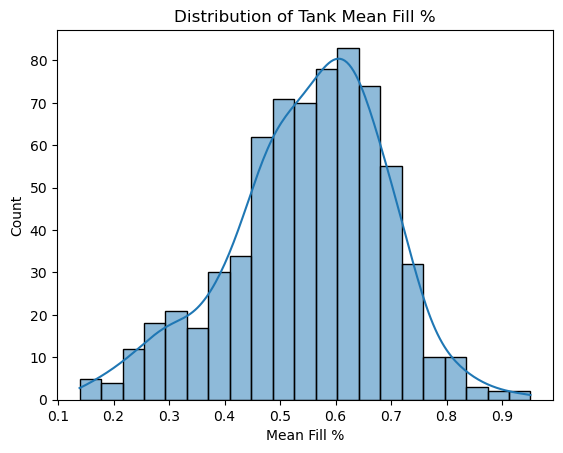

Normal test p-value: 0.0000


In [384]:
from scipy.stats import normaltest, shapiro

# Visual inspection
sns.histplot(static_tank_data['tank_mean'], kde=True)
plt.title("Distribution of Tank Mean Fill %")
plt.xlabel("Mean Fill %")
plt.show()

# Statistical test for normality (e.g., D’Agostino's K^2 or Shapiro-Wilk)
stat, p = normaltest(static_tank_data['tank_mean'].dropna())
print(f"Normal test p-value: {p:.4f}")

## MNAR

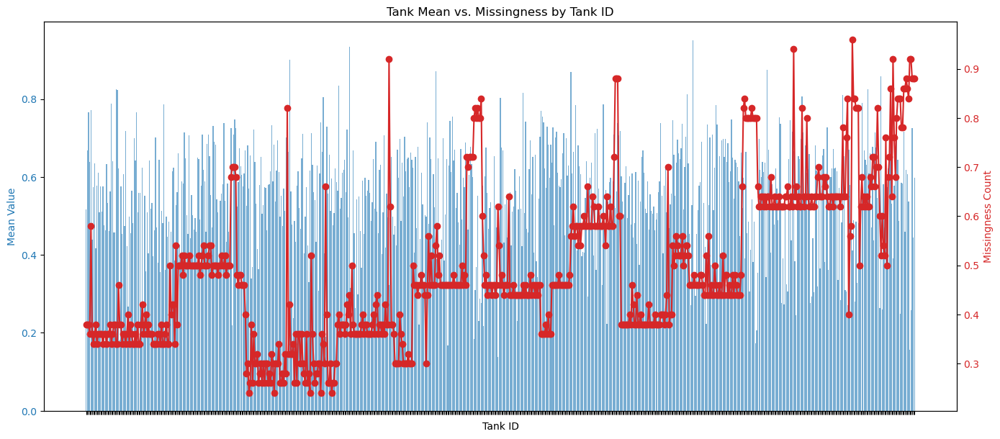

In [385]:

fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot tank means (left y-axis)
ax1.set_xlabel('Tank ID')
ax1.set_ylabel('Mean Value', color='tab:blue')
ax1.bar(static_tank_data['tank_id'], static_tank_data['tank_mean'], color='tab:blue', alpha=0.6, label='Tank Mean')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(range(len(static_tank_data['tank_id'])))
ax1.set_xticklabels([])

# Plot missingness (right y-axis)
ax2 = ax1.twinx()
ax2.set_ylabel('Missingness Count', color='tab:red')
ax2.plot(static_tank_data['tank_id'], static_tank_data['tank_missingness'], color='tab:red', marker='o', label='Missingness')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Optional: Add legends
fig.tight_layout()
plt.title("Tank Mean vs. Missingness by Tank ID")
plt.show()

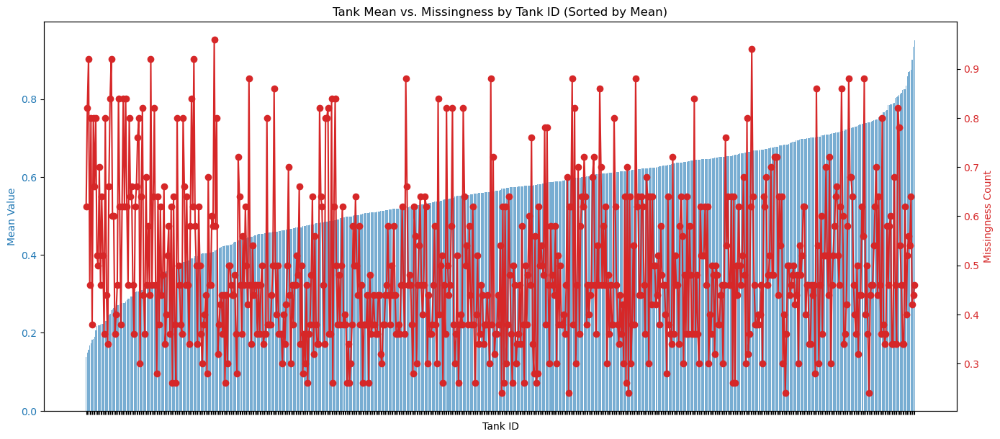

In [386]:
# Sort the DataFrame by missingness
sorted_data = static_tank_data.sort_values(by='tank_mean')
#sorted_data = static_tank_data.sort_values(by='tank_missingness')

fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot tank means (left y-axis)
ax1.set_xlabel('Tank ID')
ax1.set_ylabel('Mean Value', color='tab:blue')
ax1.bar(sorted_data['tank_id'], sorted_data['tank_mean'], color='tab:blue', alpha=0.6, label='Tank Mean')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(range(len(sorted_data['tank_id'])))
ax1.set_xticklabels([])  # remove x-axis labels

# Plot missingness (right y-axis)
ax2 = ax1.twinx()
ax2.set_ylabel('Missingness Count', color='tab:red')
ax2.plot(sorted_data['tank_id'], sorted_data['tank_missingness'], color='tab:red', marker='o', label='Missingness')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Optional: Add legends
fig.tight_layout()
plt.title("Tank Mean vs. Missingness by Tank ID (Sorted by Mean)")
plt.show()

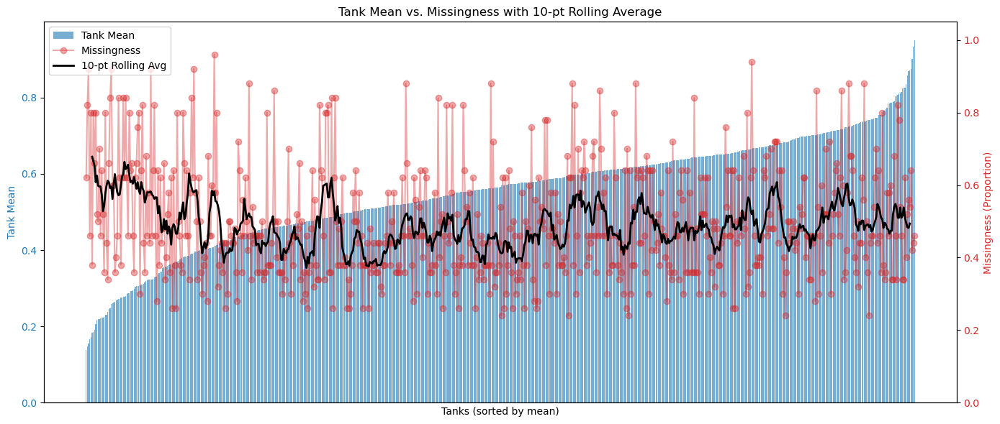

In [415]:
# Sort the DataFrame by tank_mean
sorted_data = static_tank_data.sort_values(by='tank_mean').reset_index(drop=True)

# Calculate a 5-point rolling average for tank_missingness
sorted_data['missingness_rolling'] = sorted_data['tank_missingness'].rolling(window=10, center=True).mean()

fig, ax1 = plt.subplots(figsize=(14, 6))

# Bar plot for tank_mean (left y-axis)
ax1.set_xlabel('Tanks (sorted by mean)')
ax1.set_ylabel('Tank Mean', color='tab:blue')
ax1.bar(sorted_data.index, sorted_data['tank_mean'], color='tab:blue', alpha=0.6, label='Tank Mean')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks([])  # Remove x-axis labels

# Line + Rolling Average for tank_missingness (right y-axis)
ax2 = ax1.twinx()
ax2.set_ylabel('Missingness (Proportion)', color='tab:red')
ax2.plot(sorted_data.index, sorted_data['tank_missingness'], color='tab:red', marker='o', label='Missingness', linestyle='-', alpha=0.4)
ax2.plot(sorted_data.index, sorted_data['missingness_rolling'], color='Black', linestyle='-', linewidth=2, label='10-pt Rolling Avg')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Title and layout
plt.title("Tank Mean vs. Missingness with 10-pt Rolling Average")
ax2.set_ylim(0, 1.05)
# Combined legend from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

plt.tight_layout()
plt.show()

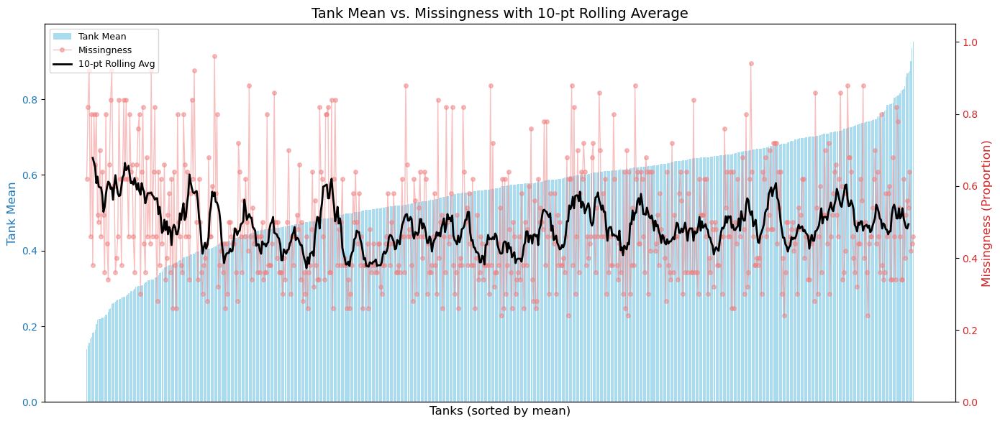

In [411]:
# Sort and calculate rolling average
sorted_data = static_tank_data.sort_values(by='tank_mean').reset_index(drop=True)
sorted_data['missingness_rolling'] = sorted_data['tank_missingness'].rolling(window=10, center=True).mean()

# Create the plot
fig, ax1 = plt.subplots(figsize=(14, 6))

# Bar plot for tank_mean (left axis)
ax1.bar(
    sorted_data.index,
    sorted_data['tank_mean'],
    color='skyblue',
    alpha=0.7,
    label='Tank Mean'
)
ax1.set_ylabel('Tank Mean', fontsize=12, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xlabel('Tanks (sorted by mean)', fontsize=12)
ax1.set_xticks([])  # Remove cluttered x-ticks

# Line + scatter for missingness (right axis)
ax2 = ax1.twinx()
ax2.plot(
    sorted_data.index,
    sorted_data['tank_missingness'],
    color='lightcoral',
    marker='o',
    linestyle='-',
    linewidth=1,
    markersize=4,
    alpha=0.5,
    label='Missingness'
)
ax2.plot(
    sorted_data.index,
    sorted_data['missingness_rolling'],
    color='black',
    linestyle='-',
    linewidth=2,
    label='10-pt Rolling Avg'
)
ax2.set_ylabel('Missingness (Proportion)', fontsize=12, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.set_ylim(0, 1.05)

# Add title
plt.title("Tank Mean vs. Missingness with 10-pt Rolling Average", fontsize=14)

# Merge legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()

In [388]:
# Convert dictionaries to pandas Series
vol_series = pd.Series(static_tank_data['tank_volatility'], name="volatility")
missing_series = pd.Series(static_tank_data['tank_missingness'], name="missing_pct")

# Combine into one DataFrame, aligning by tank_id
df_corr = pd.concat([vol_series, missing_series], axis=1)

# Drop any tanks that might be missing either value
df_corr = df_corr.dropna()

# Calculate the correlation coefficient between volatility and missing_pct
corr_value = df_corr["volatility"].corr(df_corr["missing_pct"])
print("Correlation between tank volatility and missing percentage:", corr_value)

Correlation between tank volatility and missing percentage: 0.11857325002006906


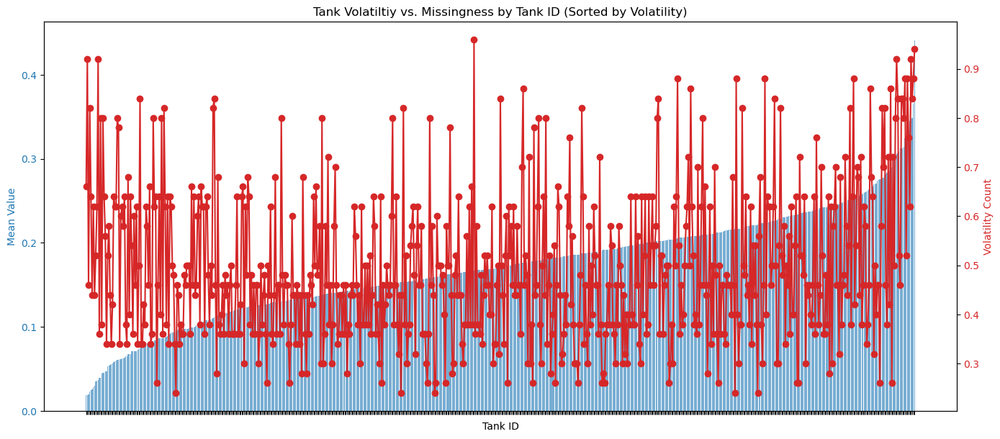

In [389]:
# Sort the DataFrame by missingness
sorted_data = static_tank_data.sort_values(by='tank_volatility')
#sorted_data = static_tank_data.sort_values(by='tank_missingness')

fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot tank means (left y-axis)
ax1.set_xlabel('Tank ID')
ax1.set_ylabel('Mean Value', color='tab:blue')
ax1.bar(sorted_data['tank_id'], sorted_data['tank_volatility'], color='tab:blue', alpha=0.6, label='Tank Volatility')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks(range(len(sorted_data['tank_id'])))
ax1.set_xticklabels([])  # remove x-axis labels

# Plot missingness (right y-axis)
ax2 = ax1.twinx()
ax2.set_ylabel('Volatility Count', color='tab:red')
ax2.plot(sorted_data['tank_id'], sorted_data['tank_missingness'], color='tab:red', marker='o', label='Missingness')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Optional: Add legends
fig.tight_layout()
plt.title("Tank Volatiltiy vs. Missingness by Tank ID (Sorted by Volatility)")
plt.show()

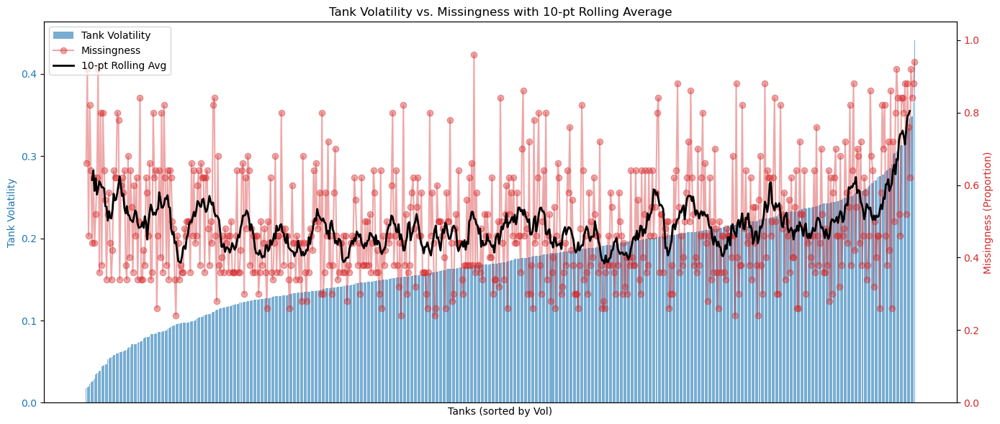

In [417]:
# Sort the DataFrame by tank_mean
sorted_data = static_tank_data.sort_values(by='tank_volatility').reset_index(drop=True)

# Calculate a 5-point rolling average for tank_missingness
sorted_data['missingness_rolling'] = sorted_data['tank_missingness'].rolling(window=10, center=True).mean()

fig, ax1 = plt.subplots(figsize=(14, 6))

# Bar plot for tank_mean (left y-axis)
ax1.set_xlabel('Tanks (sorted by Vol)')
ax1.set_ylabel('Tank Volatility', color='tab:blue')
ax1.bar(sorted_data.index, sorted_data['tank_volatility'], color='tab:blue', alpha=0.6, label='Tank Volatility')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks([])  # Remove x-axis labels

# Line + Rolling Average for tank_missingness (right y-axis)
ax2 = ax1.twinx()
ax2.set_ylabel('Missingness (Proportion)', color='tab:red')
ax2.plot(sorted_data.index, sorted_data['tank_missingness'], color='tab:red', marker='o', label='Missingness', linestyle='-', alpha=0.4)
ax2.plot(sorted_data.index, sorted_data['missingness_rolling'], color='Black', linestyle='-', linewidth=2, label='10-pt Rolling Avg')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Title and layout
plt.title("Tank Volatility vs. Missingness with 10-pt Rolling Average")
ax2.set_ylim(0, 1.05)
# Combined legend from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

plt.tight_layout()
plt.show()

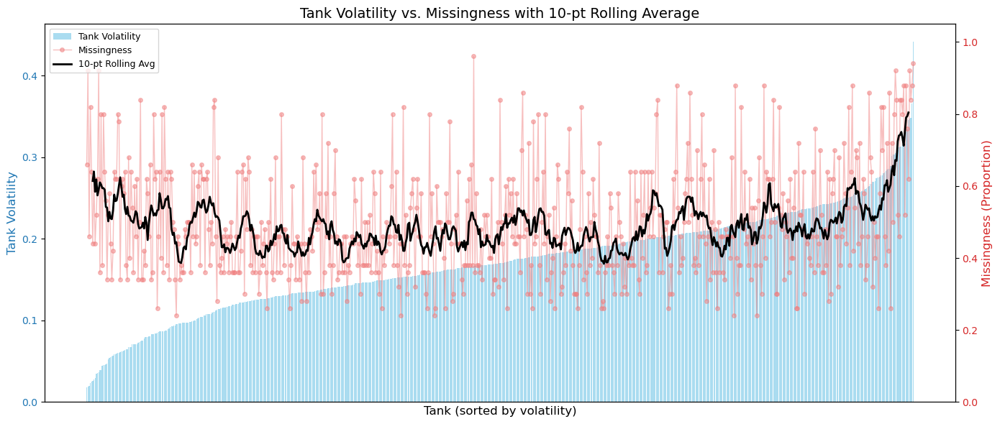

In [416]:
# Sort by tank volatility
sorted_data = static_tank_data.sort_values(by='tank_volatility').reset_index(drop=True)
sorted_data['missingness_rolling'] = sorted_data['tank_missingness'].rolling(window=10, center=True).mean()

fig, ax1 = plt.subplots(figsize=(14, 6))

# Bar plot: Tank Volatility (left y-axis)
ax1.bar(
    sorted_data.index,
    sorted_data['tank_volatility'],
    color='skyblue',
    alpha=0.7,
    label='Tank Volatility'
)
ax1.set_ylabel('Tank Volatility', fontsize=12, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xlabel('Tank (sorted by volatility)', fontsize=12)
ax1.set_xticks([])

# Line + scatter plot: Missingness (right y-axis)
ax2 = ax1.twinx()
ax2.plot(
    sorted_data.index,
    sorted_data['tank_missingness'],
    color='lightcoral',
    marker='o',
    linestyle='-',
    linewidth=1,
    markersize=4,
    alpha=0.5,
    label='Missingness'
)
ax2.plot(
    sorted_data.index,
    sorted_data['missingness_rolling'],
    color='black',
    linewidth=2,
    label='10-pt Rolling Avg'
)
ax2.set_ylabel('Missingness (Proportion)', fontsize=12, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.set_ylim(0, 1.05)

# Title and combined legend
plt.title("Tank Volatility vs. Missingness with 10-pt Rolling Average", fontsize=14)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()


In [391]:
'''# Create a lookup table of static attributes (one row per tank)
static_tank_data = data_monthly[['tank_id', 'Location', 'farm_type', 'tank farm']].drop_duplicates()

# Pivot fill_pct to create the time series DataFrame
fill_pct_ts = data_monthly.pivot(index='image_month', columns='tank_id', values='fill_pct')

# To join later, convert fill_pct_ts to long format:
fill_pct_long = fill_pct_ts.reset_index().melt(id_vars='image_month', var_name='tank_id', value_name='fill_pct')

# Merge the static info back in:
merged_data = fill_pct_long.merge(static_tank_data, on='tank_id', how='left')
print(merged_data.head())
'''

"# Create a lookup table of static attributes (one row per tank)\nstatic_tank_data = data_monthly[['tank_id', 'Location', 'farm_type', 'tank farm']].drop_duplicates()\n\n# Pivot fill_pct to create the time series DataFrame\nfill_pct_ts = data_monthly.pivot(index='image_month', columns='tank_id', values='fill_pct')\n\n# To join later, convert fill_pct_ts to long format:\nfill_pct_long = fill_pct_ts.reset_index().melt(id_vars='image_month', var_name='tank_id', value_name='fill_pct')\n\n# Merge the static info back in:\nmerged_data = fill_pct_long.merge(static_tank_data, on='tank_id', how='left')\nprint(merged_data.head())\n"

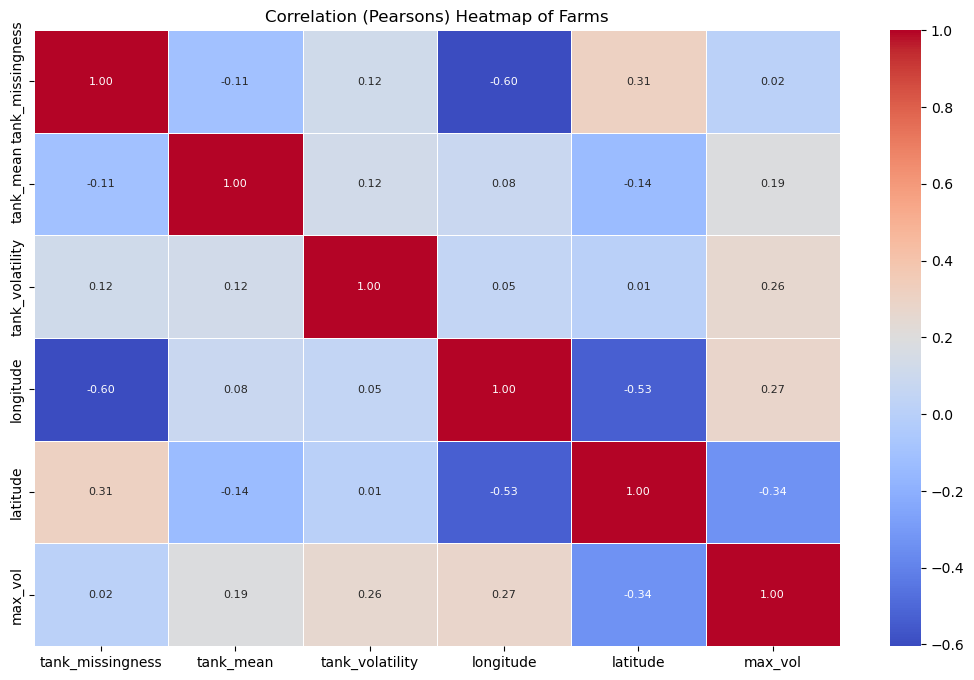

In [405]:
correlation_matrix = static_tank_data.set_index('tank_id')[['tank_missingness', 'tank_mean', 'tank_volatility', 'longitude', 'latitude', 'max_vol']].corr()
plt.figure(figsize=(13, 8))
sns.heatmap(correlation_matrix, annot=True, annot_kws={"size": 8}, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title(f"Correlation (Pearsons) Heatmap of Farms")
plt.show()

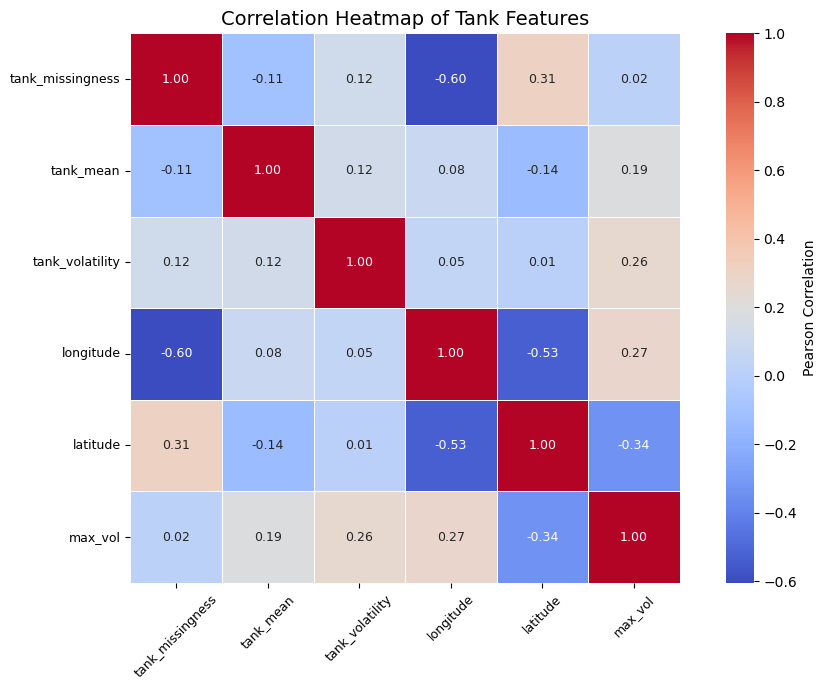

In [408]:
# Compute correlation matrix
corr_matrix = static_tank_data.set_index('tank_id')[
    ['tank_missingness', 'tank_mean', 'tank_volatility', 'longitude', 'latitude', 'max_vol']
].corr()

# Create the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(
    corr_matrix,
    annot=True,
    annot_kws={"size": 9},
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    linecolor='white',
    square=True,
    cbar_kws={'label': 'Pearson Correlation'}
)

# Formatting
plt.title("Correlation Heatmap of Tank Features", fontsize=14)
plt.xticks(fontsize=9, rotation=45)
plt.yticks(fontsize=9, rotation=0)

plt.tight_layout()
plt.show()

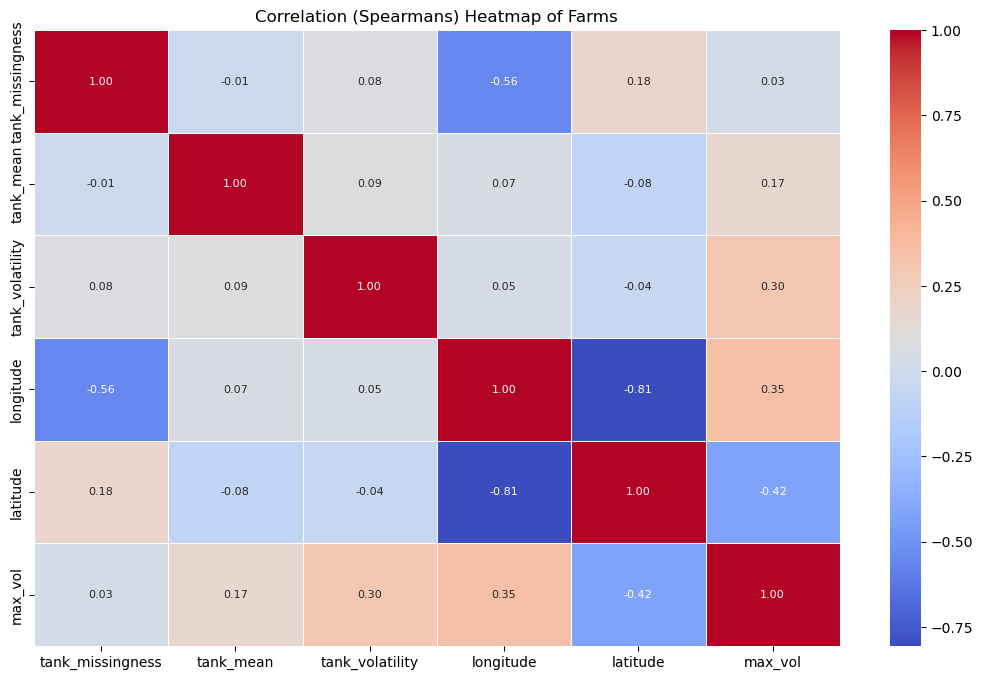

In [393]:
correlation_matrix = static_tank_data.set_index('tank_id')[['tank_missingness', 'tank_mean', 'tank_volatility', 'longitude', 'latitude', 'max_vol']].corr('spearman')
plt.figure(figsize=(13, 8))
sns.heatmap(correlation_matrix, annot=True, annot_kws={"size": 8}, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title(f"Correlation (Spearmans) Heatmap of Farms")
plt.show()

## MAR

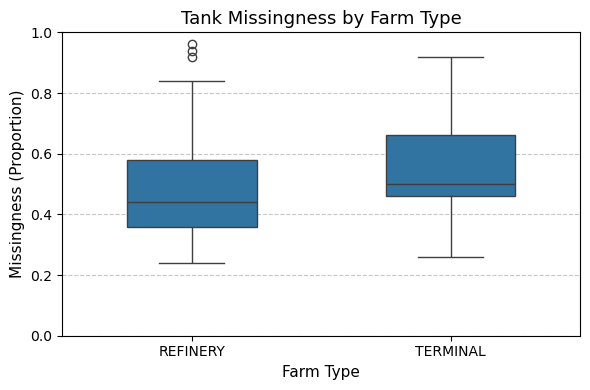

In [394]:
plt.figure(figsize=(6, 4))
ax = sns.boxplot(
    x='farm_type',
    y='tank_missingness',
    data=static_tank_data,
    width=0.5
)

# Improve labels and formatting
ax.set_title("Tank Missingness by Farm Type", fontsize=13)
ax.set_xlabel("Farm Type", fontsize=11)
ax.set_ylabel("Missingness (Proportion)", fontsize=11)
ax.tick_params(axis='both', labelsize=10)
ax.set_ylim(0, 1)  # If you're plotting proportions, this gives visual consistency

# Optional grid
ax.yaxis.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

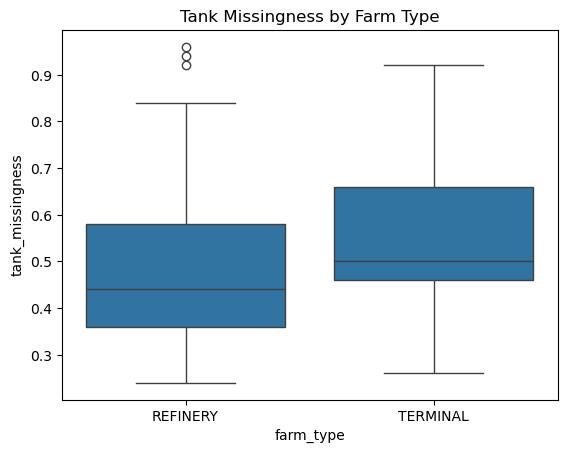

T-test: t-stat = -8.516835028628446 , p-value = 1.0218216500010776e-16
Mann-Whitney U Test: U-statistic = 28555.5000, p-value = 2.4881e-19


In [395]:
import scipy.stats as stats

# Explore the correalion between categorical variables and missingness
sns.boxplot(x='farm_type', y='tank_missingness', data=static_tank_data)
plt.title("Tank Missingness by Farm Type")
plt.show()

# Example for a binary variable using a t-test
group1 = static_tank_data[static_tank_data['farm_type'] == 'REFINERY']['tank_missingness']
group2 = static_tank_data[static_tank_data['farm_type'] == 'TERMINAL']['tank_missingness']

t_stat, p_val = stats.ttest_ind(group1, group2, nan_policy='omit')
print("T-test: t-stat =", t_stat, ", p-value =", p_val)

u_stat, p_val = stats.mannwhitneyu(group1, group2, alternative='two-sided')
print(f"Mann-Whitney U Test: U-statistic = {u_stat:.4f}, p-value = {p_val:.4e}")

In [396]:
stat, p = stats.levene(group1, group2)
print(f"Levene’s test: p = {p:.4f}")

print("Shapiro-Wilk test for normalthis returns ity:")
print("REFINERY:", stats.shapiro(group1))
print("TERMINAL:", stats.shapiro(group2))

Levene’s test: p = 0.8568
Shapiro-Wilk test for normalthis returns ity:
REFINERY: ShapiroResult(statistic=0.926429364445237, pvalue=1.0266098144317562e-14)
TERMINAL: ShapiroResult(statistic=0.9027297238312757, pvalue=2.4363965662961044e-10)


In [397]:
# Run the test
result_refinery = anderson(group1, dist='norm')
result_terminal = anderson(group2, dist='norm')

# Print results
print("REFINERY:")
print(f"Statistic: {result_refinery.statistic:.4f}")
for i in range(len(result_refinery.critical_values)):
    print(f"  {result_refinery.significance_level[i]}%: {result_refinery.critical_values[i]:.4f}")

print("\nTERMINAL:")
print(f"Statistic: {result_terminal.statistic:.4f}")
for i in range(len(result_terminal.critical_values)):
    print(f"  {result_terminal.significance_level[i]}%: {result_terminal.critical_values[i]:.4f}")

REFINERY:
Statistic: 12.3111
  15.0%: 0.5710
  10.0%: 0.6510
  5.0%: 0.7810
  2.5%: 0.9110
  1.0%: 1.0830

TERMINAL:
Statistic: 8.8117
  15.0%: 0.5650
  10.0%: 0.6440
  5.0%: 0.7720
  2.5%: 0.9010
  1.0%: 1.0720


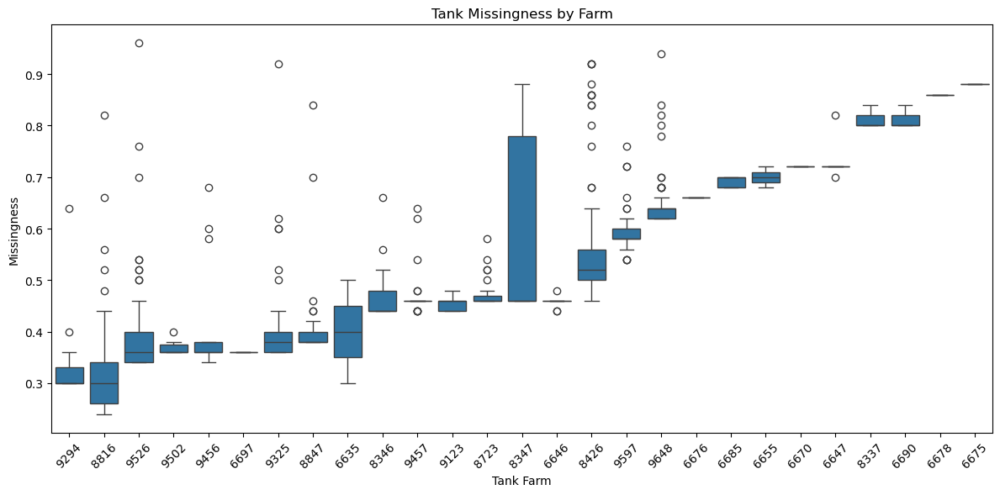

In [398]:
# Convert the 'tank farm' column to string if it's numeric
static_tank_data['tank farm'] = static_tank_data['tank farm'].astype(str)

# Determine an order for the x-axis by median missingness
order = static_tank_data.groupby('tank farm')['tank_missingness'].median().sort_values().index

plt.figure(figsize=(12, 6))  # Make the figure wider
sns.boxplot(
    x='tank farm', 
    y='tank_missingness', 
    data=static_tank_data,
    order=order
)

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Use a descriptive title and axis labels
plt.title("Tank Missingness by Farm")
plt.xlabel("Tank Farm")
plt.ylabel("Missingness")

plt.tight_layout()  # Ensures labels and titles fit nicely
plt.show()

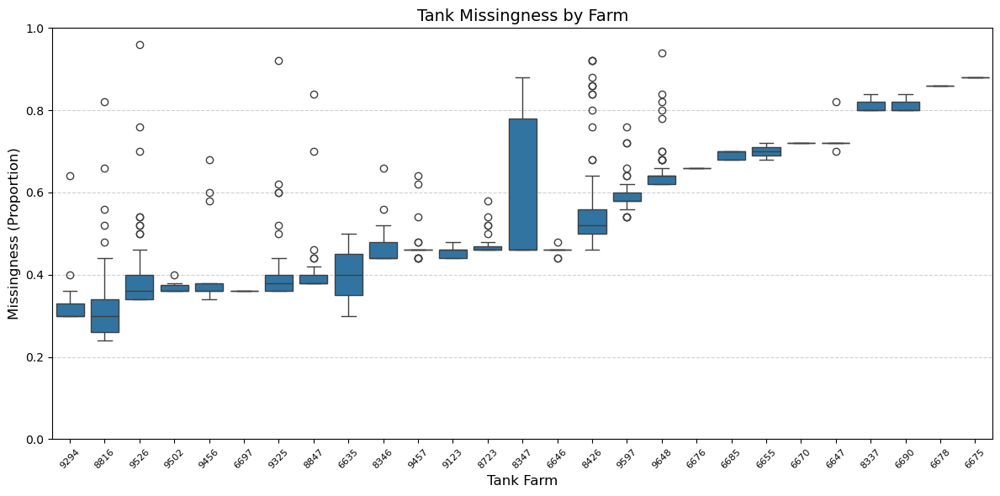

In [399]:
# Order tank farms by median missingness (ascending)
order = static_tank_data.groupby('tank farm')['tank_missingness'].median().sort_values().index

# Create the plot
plt.figure(figsize=(12, 6))
ax = sns.boxplot(
    x='tank farm',
    y='tank_missingness',
    data=static_tank_data,
    order=order,
    linewidth=1
)

# Improve axis labeling and ticks
ax.set_title("Tank Missingness by Farm", fontsize=14)
ax.set_xlabel("Tank Farm", fontsize=12)
ax.set_ylabel("Missingness (Proportion)", fontsize=12)
ax.tick_params(axis='x', rotation=45, labelsize=8)
ax.tick_params(axis='y', labelsize=10)
ax.set_ylim(0, 1)

# Optional: Add horizontal grid lines for readability
ax.yaxis.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

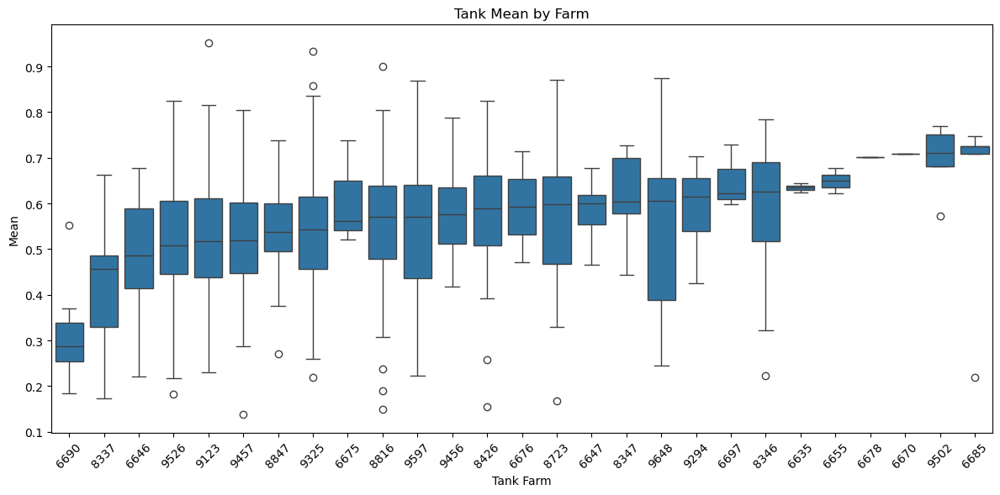

In [279]:
# Convert the 'tank farm' column to string if it's numeric
static_tank_data['tank farm'] = static_tank_data['tank farm'].astype(str)

# Determine an order for the x-axis by median missingness
order = static_tank_data.groupby('tank farm')['tank_mean'].median().sort_values().index

plt.figure(figsize=(12, 6))  # Make the figure wider
sns.boxplot(
    x='tank farm', 
    y='tank_mean', 
    data=static_tank_data,
    order=order
)

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Use a descriptive title and axis labels
plt.title("Tank Mean by Farm")
plt.xlabel("Tank Farm")
plt.ylabel("Mean")

plt.tight_layout()  # Ensures labels and titles fit nicely
plt.show()

In [280]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

static_tank_data = static_tank_data.rename(columns={'tank farm': 'tank_farm'})

# Now you can use the renamed column in your formula:
model = smf.ols('tank_missingness ~ C(tank_farm)', data=static_tank_data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("ANOVA results:")
print(anova_table)

ANOVA results:
                 sum_sq     df          F         PR(>F)
C(tank_farm)  11.260411   26.0  58.897699  1.511865e-153
Residual       4.897301  666.0        NaN            NaN


In [281]:
from scipy.stats import kruskal

# Create a list of missingness values for each tank farm
groups = [group['tank_missingness'].dropna() for name, group in static_tank_data.groupby('tank_farm')]

# Perform the Kruskal-Wallis test
kruskal_result = kruskal(*groups)
print("Kruskal-Wallis test result:")
print(kruskal_result)

Kruskal-Wallis test result:
KruskalResult(statistic=529.0173042734992, pvalue=3.4227576276238806e-95)


In [282]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from itertools import combinations

# Get unique tank farms
groups = static_tank_data['tank_farm'].unique()

# Prepare all pairwise comparisons
comparisons = list(combinations(groups, 2))
p_values = []

# Run tests
for g1, g2 in comparisons:
    data1 = static_tank_data[static_tank_data['tank_farm'] == g1]['tank_missingness']
    data2 = static_tank_data[static_tank_data['tank_farm'] == g2]['tank_missingness']
    _, p = mannwhitneyu(data1, data2, alternative='two-sided')
    p_values.append(p)

# Multiple testing correction
adjusted = multipletests(p_values, method='holm')  # or 'bonferroni'

# Combine into results DataFrame
results_df = pd.DataFrame(comparisons, columns=['tank_farm_1', 'tank_farm_2'])
results_df['raw_p'] = p_values
results_df['adj_p'] = adjusted[1]
results_df['significant'] = adjusted[0]

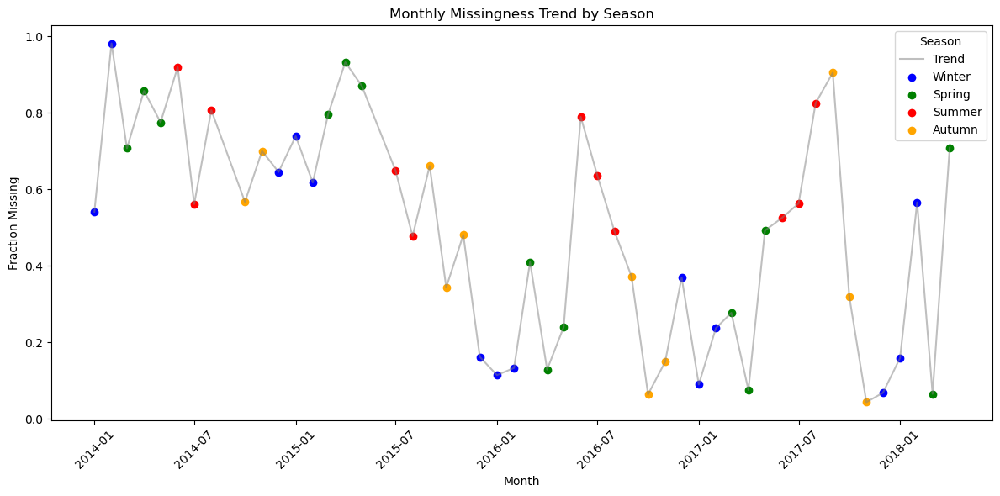

In [409]:
monthly_missingness = data_monthly_fill.isna().mean(axis=1)

# Convert the index from string to datetime. Assuming your index is in "YYYY-MM" format.
monthly_missingness.index = pd.to_datetime(monthly_missingness.index, format='%Y-%m')

# Define a function to get the season for a given datetime:
def get_season(dt):
    month = dt.month
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Map each month (now a datetime) to its season:
seasons = monthly_missingness.index.map(get_season)

# Define a color mapping for each season:
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'red', 'Autumn': 'orange'}

plt.figure(figsize=(12, 6))
# Plot the overall trend (line) in a neutral color:
plt.plot(monthly_missingness.index, monthly_missingness, color='gray', linestyle='-', alpha=0.5, label='Trend')

# Now plot each point with its season color:
for season in season_colors:
    mask = seasons == season
    plt.scatter(monthly_missingness.index[mask],
                monthly_missingness[mask],
                color=season_colors[season],
                label=season)

plt.xlabel("Month")
plt.ylabel("Fraction Missing")
plt.title("Monthly Missingness Trend by Season")
plt.xticks(rotation=45)
plt.legend(title="Season")
plt.tight_layout()
plt.show()

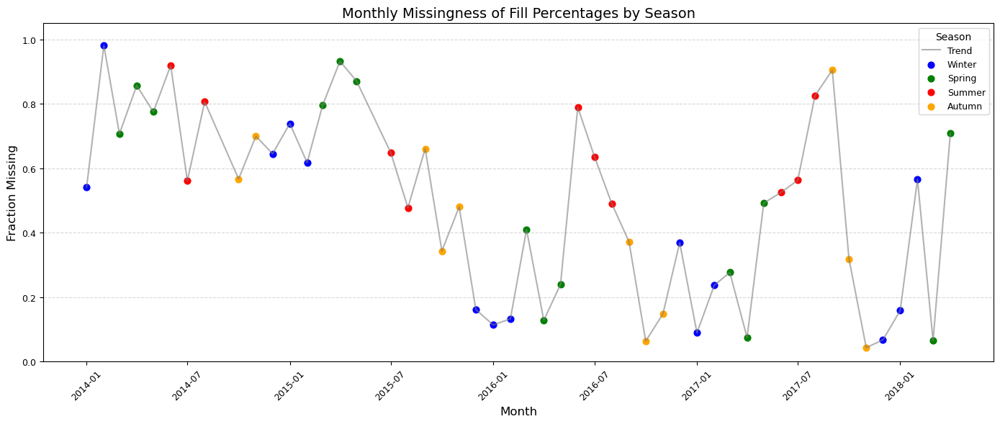

In [410]:
# Assuming `monthly_missingness` and `seasons` are already defined
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'red', 'Autumn': 'orange'}

plt.figure(figsize=(14, 6))

# Plot the trend line
plt.plot(monthly_missingness.index, monthly_missingness, color='gray', linestyle='-', linewidth=1.5, alpha=0.6, label='Trend')

# Plot colored scatter points by season
for season, color in season_colors.items():
    mask = seasons == season
    plt.scatter(
        monthly_missingness.index[mask],
        monthly_missingness[mask],
        color=color,
        label=season,
        s=40  # slightly larger dots for visibility
    )

# Labels & titles
plt.xlabel("Month", fontsize=12)
plt.ylabel("Fraction Missing", fontsize=12)
plt.title("Monthly Missingness of Fill Percentages by Season", fontsize=14)

# Improve ticks and legend
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.legend(title="Season", fontsize=9, title_fontsize=10)
plt.ylim(0, 1.05)  # Make space above dots
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [284]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Create a DataFrame with the monthly missingness and corresponding season
df_missing = pd.DataFrame({
    'missingness': monthly_missingness.values,
    'season': monthly_missingness.index.map(get_season)
})

# Fit an ANOVA model: missingness as a function of season
model = ols('missingness ~ C(season)', data=df_missing).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

             sum_sq    df         F    PR(>F)
C(season)  0.532654   3.0  2.384647  0.081375
Residual   3.424976  46.0       NaN       NaN


In [285]:
from scipy.stats import kruskal

# Assuming df_missing is defined as:
# df_missing = pd.DataFrame({
#     'missingness': monthly_missingness.values,
#     'season': monthly_missingness.index.map(get_season)
# })

# Get the unique seasons
seasons = df_missing['season'].unique()

# Create a list of missingness values for each season
groups = [df_missing[df_missing['season'] == s]['missingness'] for s in seasons]

# Perform the Kruskal-Wallis test
kruskal_result = kruskal(*groups)
print("Kruskal-Wallis test result:", kruskal_result)

Kruskal-Wallis test result: KruskalResult(statistic=5.896073338426248, pvalue=0.11677742376023846)


In [286]:
(data_monthly_fill.isna().sum(axis = 1) == 0).sum()

0

## Little's MCAR test and assumptions:

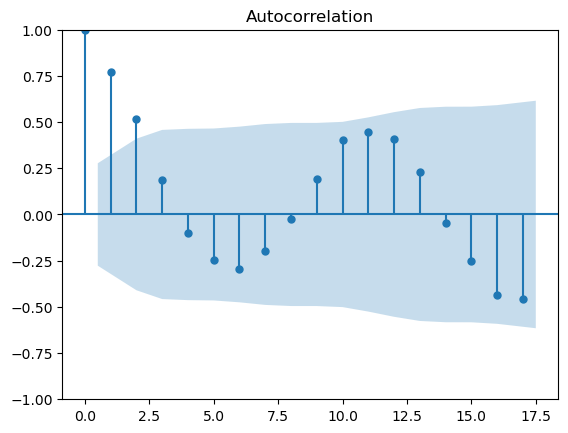

In [287]:
from statsmodels.graphics.tsaplots import plot_acf
# Mean across tanks each month
row_means = data_monthly_fill.mean(axis=1)

plot_acf(row_means, alpha=0.05)
plt.show()

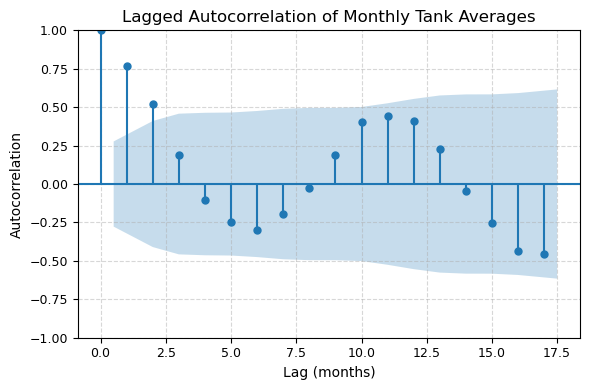

In [288]:
# Calculate the mean across tanks each month
row_means = data_monthly_fill.mean(axis=1)

# Create the ACF plot with improvements
fig, ax = plt.subplots(figsize=(6, 4))
plot_acf(row_means, alpha=0.05, ax=ax)

# Apply enhancements
ax.set_title("Lagged Autocorrelation of Monthly Tank Averages", fontsize=12)
ax.set_xlabel("Lag (months)", fontsize=10)
ax.set_ylabel("Autocorrelation", fontsize=10)
ax.tick_params(axis='both', labelsize=9)
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

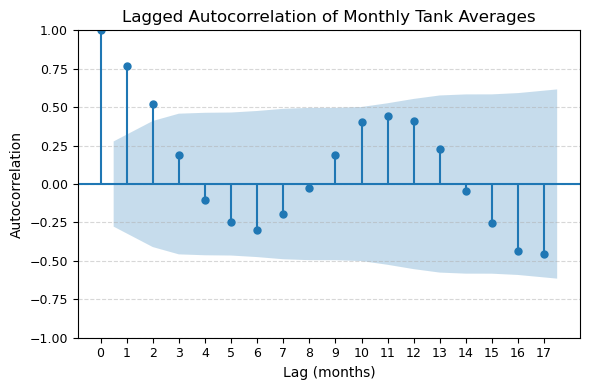

In [424]:
# Calculate the mean across tanks each month
row_means = data_monthly_fill.mean(axis=1)

# Create the ACF plot
fig, ax = plt.subplots(figsize=(6, 4))
plot_acf(row_means, alpha=0.05, ax=ax)

# Force x-axis ticks to whole numbers
ax.set_xticks(np.arange(0, 18, 1))

ax.xaxis.grid(False)
ax.yaxis.grid(True, linestyle='--', alpha=0.5)

# Apply enhancements
ax.set_title("Lagged Autocorrelation of Monthly Tank Averages", fontsize=12)
ax.set_xlabel("Lag (months)", fontsize=10)
ax.set_ylabel("Autocorrelation", fontsize=10)
ax.tick_params(axis='both', labelsize=9)


plt.tight_layout()
plt.show()

In [289]:
from scipy.stats import chi2
# Suppose df_sub is your DataFrame with only the columns of interest
def little_mcar_test(data, alpha=0.05):
    """
    Performs Little's MCAR (Missing Completely At Random) test on a dataset with missing values.
    """
    data = pd.DataFrame(data)
    data.columns = ['x' + str(i) for i in range(data.shape[1])]
    data['missing'] = np.sum(data.isnull(), axis=1)
    n = data.shape[0]
    k = data.shape[1] - 1
    df = k * (k - 1) / 2
    chi2_crit = chi2.ppf(1 - alpha, df)
    chi2_val = ((n - 1 - (k - 1) / 2) ** 2) / (k - 1) / ((n - k) * np.mean(data['missing']))
    p_val = 1 - chi2.cdf(chi2_val, df)
    if chi2_val > chi2_crit:
        print(
            'Reject null hypothesis: Data is not MCAR (p-value={:.4f}, chi-square={:.4f})'.format(p_val, chi2_val)
        )
    else:
        print(
            'Do not reject null hypothesis: Data is MCAR (p-value={:.4f}, chi-square={:.4f})'.format(p_val, chi2_val)
        )

little_mcar_test(data_monthly_fill[30:])



Do not reject null hypothesis: Data is MCAR (p-value=1.0000, chi-square=-0.0010)


In [290]:
from scipy.stats import anderson


# Loop through each column in the DataFrame
for col in data_monthly_fill.columns:
    # Drop NaN values for the current column
    data_col = data_monthly_fill[col].dropna()
    
    # Skip the column if there's not enough data to test normality
    if len(data_col) < 5:
        print(f"Column {col}: Not enough data to test normality.")
        continue

    result = anderson(data_col)
    print(f"Column: {col}")
    print("Anderson-Darling Test Statistic:", result.statistic)
    for i, crit in enumerate(result.critical_values):
        sl, cv = result.significance_level[i], crit
        if result.statistic < crit:
            print(f"  At the {sl}% level, data is normally distributed.")
        else:
            print(f"  At the {sl}% level, data is not normally distributed.")
    print("\n")

Column: 23f330a5-837d-456d-945e-dd8eb4106528
Anderson-Darling Test Statistic: 1.1520253273259637
  At the 15.0% level, data is not normally distributed.
  At the 10.0% level, data is not normally distributed.
  At the 5.0% level, data is not normally distributed.
  At the 2.5% level, data is not normally distributed.
  At the 1.0% level, data is not normally distributed.


Column: 0cf80bb9-5b17-48fc-92dc-86ecf546ed40
Anderson-Darling Test Statistic: 0.2796864486730488
  At the 15.0% level, data is normally distributed.
  At the 10.0% level, data is normally distributed.
  At the 5.0% level, data is normally distributed.
  At the 2.5% level, data is normally distributed.
  At the 1.0% level, data is normally distributed.


Column: 4e3f6c7b-e608-4130-8ed0-2627811ad177
Anderson-Darling Test Statistic: 0.7879115942789277
  At the 15.0% level, data is not normally distributed.
  At the 10.0% level, data is not normally distributed.
  At the 5.0% level, data is not normally distributed.
  At

In [291]:
static_tank_data.shape

(693, 9)

In [292]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score


def evaluate_metrics(y_true, y_pred):
    """
    Computes multiple metrics between y_true and y_pred:
      - Bias: mean(y_pred - y_true)
      - % Bias: 100 * (Bias / mean(y_true))
      - RMSE: sqrt( mean( (y_pred - y_true)^2 ) )

    Returns a dictionary with the results.
    """

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Bias
    bias = np.mean(y_pred - y_true)

    # % Bias
    # Handle the case where mean(y_true) might be 0 or very close to 0
    mean_y_true = np.mean(y_true)
    if mean_y_true != 0:
        pct_bias = (bias / mean_y_true) * 100
    else:
        pct_bias = np.nan

    # RMSE
    rmse = root_mean_squared_error(y_pred, y_true)

    # MAE
    mae = mean_absolute_error(y_pred, y_true)

    # R2
    R2 = r2_score(y_pred, y_true)

    return {
        'Bias': bias,
        '% Bias': pct_bias,
        'RMSE': rmse,
        'MAE' : mae,
        'R² Score' : R2
    }

# Basic Models

In [293]:
cleaned_df, dropped_rows, dropped_cols = prune_missingness(data_monthly_fill[15:], threshold=30)
tank_data_imputation = static_tank_data[~static_tank_data['tank_id'].isin(dropped_cols)]

print(dropped_rows,dropped_cols)
# cleaned_df

Final overall missingness: 29.97%
['2017-09', '2015-05', '2017-08', '2016-06'] ['e6d6905d-dd6f-41cb-ac22-6eb3ce38290f', 'd14a38b4-5c33-41cf-96e8-e5553ebd0014', '54cc7024-530f-4835-b013-bbb4b04950bb', '6b9c1f04-be3a-41fc-93a1-b972aba94e28', '5cf1c51d-8889-4e91-9513-a88f65c8e0be', '5065fce3-7a77-444d-b2c8-700f1b4b3265', '2b36aade-f7a4-4407-bab1-32cd820e9a97', '6dcc49b8-1a68-41c3-b3e3-fd717b6652f9', 'faa13b9f-9532-4a79-86bc-3749a17c4f1a', 'fcacae2b-e5f0-4366-9174-8dd86c3be8ef', '4e3f6c7b-e608-4130-8ed0-2627811ad177', '630641b6-a383-4bff-83b2-20e852bfc238', 'a809f0b1-627b-4bef-91a8-beb4e901fb69', '6aed5225-c9f5-44c7-881e-5a007ccf5c8f', '9413aeca-65fa-480e-8922-12413f329db4', '311d452a-d994-420f-bd0b-ca0095c42578', 'bc5437aa-d239-4f25-976e-ac381f95013a', '0cf80bb9-5b17-48fc-92dc-86ecf546ed40', '15c7209b-ae7c-45c8-a411-1c0193c96f31', '5f853684-963d-44f2-b260-6aedb3e80b43', '63a4b1b2-f57e-4261-843b-020dae91ad14', 'e934641e-7c7c-4bf6-aa11-88f5d827300b', '2815242b-dc65-43a0-8149-8fc159d1853a', 

In [294]:
# Generate a new random seed for each run
# seed = np.random.randint(0, 10_000_000)
seed = 2034376
np.random.seed(seed)
print(f"Random seed used: {seed}")

non_missing_mask = ~cleaned_df.isna() 

# Find row/column indices of all valid (non-missing) cells
valid_positions = np.argwhere(non_missing_mask.values)

# Calculate how many cells = 5% of these valid positions
sample_size = int(0.05 * valid_positions.shape[0])

# Shuffle & select random subset of positions
sample_indices = np.random.choice(valid_positions.shape[0], size=sample_size, replace=False)

# Subset those into actual row/column pairs
masked_positions = valid_positions[sample_indices]

imputation_df = cleaned_df.copy()

for (r, c) in masked_positions:
    imputation_df.iat[r, c] = np.nan
 
#print(imputation_df, imputation_df.isna().sum().sum() / imputation_df.size)
#imputation_df

Random seed used: 2034376


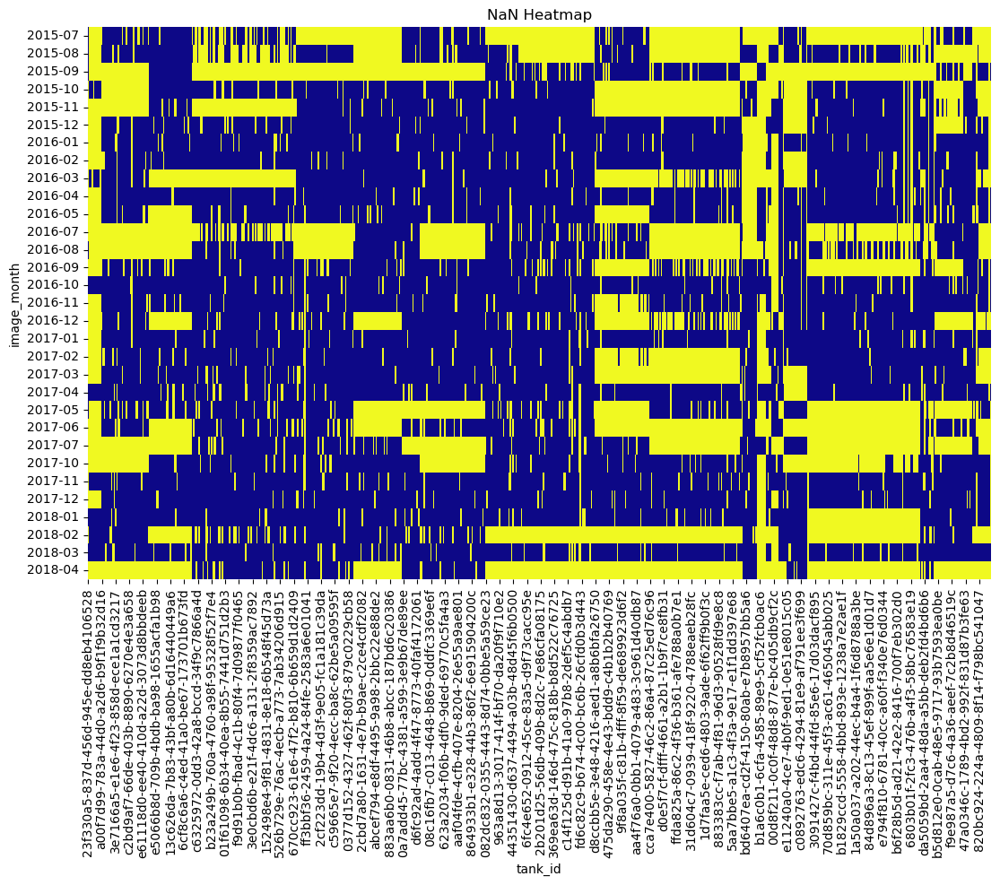

In [295]:
# Plot a heatmap of the missing data
plt.figure(figsize=(13, 8))
ax = plt.gca()
sns.heatmap(imputation_df.isna(), cmap='plasma', cbar=False, ax=ax)
ax.set_title("NaN Heatmap")
ax.set_xlabel("tank_id")
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [296]:
long_ts = imputation_df.reset_index().melt(
    id_vars='image_month',
    var_name='tank_id',
    value_name='Fill_pct'  # The time-series measurement
)
merged_df = long_ts.merge(tank_data_imputation[['tank_id', 'latitude', 'longitude', 'farm_type', 'tank_farm']], on='tank_id', how='left')

merged_df = pd.get_dummies(merged_df, columns=['farm_type'])

# Convert image_month to a numeric form, e.g. an integer timestamp
merged_df['month_numeric'] = pd.to_datetime(merged_df['image_month']).astype('int64')

#print(merged_df.head())
#print(merged_df.info())

## Mean Imputaion (Baseline)

In [297]:
# Copy the original DataFrame
target_df = merged_df.copy()

target_df['Fill_pct'] = target_df.groupby('tank_id')['Fill_pct'].transform(lambda x: x.fillna(x.mean()))


In [298]:
# Reshape back to wide format for evaluation
filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_mean_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

# Evaluation (same as before)
y_true_mean = []
y_pred_mean = []
for (r, c) in masked_positions:
    y_true_mean.append(cleaned_df.iat[r, c])
    y_pred_mean.append(imputed_mean_df.iat[r, c])

# Evaluate
evaluate_metrics(y_true_mean, y_pred_mean)

{'Bias': -0.011188910049080989,
 '% Bias': -2.001354490527323,
 'RMSE': 0.2919652535775028,
 'MAE': 0.23338940262185232,
 'R² Score': -1.0900341848702317}

## Linear Interpolation (Baseline)

In [299]:
# Copy the original DataFrame
target_df = imputation_df.copy()

target_df.interpolate(method='linear', axis=0, inplace=True)
target_df.bfill(inplace=True)


In [300]:

imputed_linear_df = target_df

# Evaluation (same as before)
y_true_linear = []
y_pred_linear = []
for (r, c) in masked_positions:
    y_true_linear.append(cleaned_df.iat[r, c])
    y_pred_linear.append(imputed_linear_df.iat[r, c])

# Evaluate
evaluate_metrics(y_true_linear, y_pred_linear)

{'Bias': 0.00047230442809775825,
 '% Bias': 0.08448084611664444,
 'RMSE': 0.18777767577853974,
 'MAE': 0.13307853429377958,
 'R² Score': 0.04962446226415884}

## MICE

In [301]:
'''from statsmodels.imputation.mice import MICEData
# Copy the original DataFrame
target_df = merged_df.copy()

# Define the features for MICE imputation
columns_for_mice = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    #'tank_farm',
    'month_numeric'
]


# assert target_df[columns_for_mice].applymap(np.isreal).all().all(), "Some columns are not numeric!"

# Create MICEData object (it internally handles missing values)
mice_data = MICEData(target_df[columns_for_mice])

# Perform the MICE updates (e.g. 5 chained iterations)
mice_data.update_all(10)  # You can increase this if needed

# Replace imputed values back into the target DataFrame
target_df[columns_for_mice] = mice_data.data

# Reshape back to wide format for evaluation
filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_MICE_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

# Evaluation (same as before)
y_true_MICE = []
y_pred_MICE = []
for (r, c) in masked_positions:
    y_true_MICE.append(cleaned_df.iat[r, c])
    y_pred_MICE.append(imputed_MICE_df.iat[r, c])

# Evaluate
evaluate_metrics(y_true_MICE, y_pred_MICE)'''

'from statsmodels.imputation.mice import MICEData\n# Copy the original DataFrame\ntarget_df = merged_df.copy()\n\n# Define the features for MICE imputation\ncolumns_for_mice = [\n    \'Fill_pct\',\n    \'latitude\',\n    \'longitude\',\n    \'farm_type_REFINERY\', \n    #\'tank_farm\',\n    \'month_numeric\'\n]\n\n\n# assert target_df[columns_for_mice].applymap(np.isreal).all().all(), "Some columns are not numeric!"\n\n# Create MICEData object (it internally handles missing values)\nmice_data = MICEData(target_df[columns_for_mice])\n\n# Perform the MICE updates (e.g. 5 chained iterations)\nmice_data.update_all(10)  # You can increase this if needed\n\n# Replace imputed values back into the target DataFrame\ntarget_df[columns_for_mice] = mice_data.data\n\n# Reshape back to wide format for evaluation\nfilled_long = target_df[[\'image_month\', \'tank_id\', \'Fill_pct\']]\nimputed_MICE_df = filled_long.pivot(index=\'image_month\', columns=\'tank_id\', values=\'Fill_pct\')\n\n# Evaluation (

In [ ]:
from statsmodels.imputation.mice import MICEData
from statsmodels.imputation.mice import MICE
# Copy the original DataFrame
target_df = merged_df.copy()

# Define the features for MICE imputation
columns_for_mice = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    #'tank_farm',
    'month_numeric'
]


# Create MICEData object
mice_data = MICEData(target_df[columns_for_mice])

fml = 'Fill_pct ~ latitude + longitude + farm_type_REFINERY + month_numeric'
mice = MICE(fml, sm.OLS, mice_data)


results = mice.fit(10, 10)

# print(results.summary())

# Replace imputed values back into the target DataFrame
target_df[columns_for_mice] = mice_data.data

# Reshape back to wide format for evaluation
filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_MICE_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

# Evaluation
y_true_MICE = []
y_pred_MICE = []
for (r, c) in masked_positions:
    y_true_MICE.append(cleaned_df.iat[r, c])
    y_pred_MICE.append(imputed_MICE_df.iat[r, c])

# Evaluate
evaluate_metrics(y_true_MICE, y_pred_MICE)

c:\Users\jonah\anaconda3\Lib\site-packages\statsmodels\imputation\mice.py:1255: RuntimeWarning: invalid value encountered in divide
  fmi = f * np.diag(cov_between) / np.diag(cov_params)


{'Bias': 0.005014276825637013,
 '% Bias': 0.8969010741631611,
 'RMSE': 0.29374899670279786,
 'MAE': 0.23699996931315173,
 'R² Score': -0.8227241396334126}

In [303]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
target_df = merged_df.copy()
columns_for_MICE = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    'tank_farm',
    'month_numeric'
]

MICE_imputer = IterativeImputer(random_state=42, max_iter=10)
target_df[columns_for_MICE] = MICE_imputer.fit_transform(target_df[columns_for_MICE])

filled_long = target_df[['image_month','tank_id','Fill_pct']]

imputed_MICE_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct' )

y_true_MICE = []
y_pred_MICE = []
for (r, c) in masked_positions:
    y_true_MICE.append(cleaned_df.iat[r, c])
    y_pred_MICE.append(imputed_MICE_df.iat[r, c])

evaluate_metrics(y_true_MICE, y_pred_MICE)

{'Bias': -0.0056503394316277655,
 '% Bias': -1.0106732599410477,
 'RMSE': 0.2857407257523891,
 'MAE': 0.2296667773777611,
 'R² Score': -1.1680444353850339}

## KNN

In [304]:
from sklearn.impute import KNNImputer
target_df = merged_df.copy()
columns_for_knn = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    'tank_farm',
    'month_numeric'
]

KNN_imputer = KNNImputer(n_neighbors=5)
target_df[columns_for_knn] = KNN_imputer.fit_transform(target_df[columns_for_knn])


In [305]:
filled_long = target_df[['image_month','tank_id','Fill_pct']]

imputed_KNN_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct' )

y_true_KNN = []
y_pred_KNN = []
for (r, c) in masked_positions:
    y_true_KNN.append(cleaned_df.iat[r, c])
    y_pred_KNN.append(imputed_KNN_df.iat[r, c])

evaluate_metrics(y_true_KNN, y_pred_KNN)

{'Bias': 0.0026110511834801274,
 '% Bias': 0.46703736004060975,
 'RMSE': 0.2819021684044969,
 'MAE': 0.2261384449448584,
 'R² Score': -1.1152383760331972}

## Random Forest

In [306]:
from sklearn.ensemble import RandomForestRegressor

target_df = merged_df.copy()

columns_for_rf = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    'tank_farm',
    'month_numeric'
]

# Create Random Forest Regressor
rf_estimator = RandomForestRegressor(n_estimators=100, random_state=42)
RF_imputer = IterativeImputer(estimator=rf_estimator, max_iter=10, random_state=0, skip_complete=True)
target_df[columns_for_rf] = RF_imputer.fit_transform(target_df[columns_for_rf])

In [307]:
filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_RF_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

y_true_RF = []
y_pred_RF = []
for (r, c) in masked_positions:
    y_true_RF.append(cleaned_df.iat[r, c])
    y_pred_RF.append(imputed_RF_df.iat[r, c])

evaluate_metrics(y_true_RF, y_pred_RF)

{'Bias': -0.012351886785620264,
 '% Bias': -2.209375531347368,
 'RMSE': 0.29193508917175337,
 'MAE': 0.23343442792732863,
 'R² Score': -1.0492785055937288}

In [308]:
'''from missforest import MissForest

target_df = merged_df.copy()

target_df['farm_type_REFINERY'] = target_df['farm_type_REFINERY'].astype('int')

columns_for_rf = [
    'Fill_pct',
    'latitude',
    'longitude',
    'farm_type_REFINERY', 
    # 'tank_farm',
    'month_numeric'
]

# Create Random Forest Regressor
RF_imputer = MissForest(categorical=['farm_type_REFINERY'])
target_df[columns_for_rf] = RF_imputer.fit_transform(target_df[columns_for_rf])


filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_RF_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

y_true_RF = []
y_pred_RF = []
for (r, c) in masked_positions:
    y_true_RF.append(cleaned_df.iat[r, c])
    y_pred_RF.append(imputed_RF_df.iat[r, c])

evaluate_metrics(y_true_RF, y_pred_RF)'''

"from missforest import MissForest\n\ntarget_df = merged_df.copy()\n\ntarget_df['farm_type_REFINERY'] = target_df['farm_type_REFINERY'].astype('int')\n\ncolumns_for_rf = [\n    'Fill_pct',\n    'latitude',\n    'longitude',\n    'farm_type_REFINERY', \n    # 'tank_farm',\n    'month_numeric'\n]\n\n# Create Random Forest Regressor\nRF_imputer = MissForest(categorical=['farm_type_REFINERY'])\ntarget_df[columns_for_rf] = RF_imputer.fit_transform(target_df[columns_for_rf])\n\n\nfilled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]\nimputed_RF_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')\n\ny_true_RF = []\ny_pred_RF = []\nfor (r, c) in masked_positions:\n    y_true_RF.append(cleaned_df.iat[r, c])\n    y_pred_RF.append(imputed_RF_df.iat[r, c])\n\nevaluate_metrics(y_true_RF, y_pred_RF)"

## Spatial Interpolation

In [309]:
'''from pykrige.ok import OrdinaryKriging

target_df = merged_df.copy()

columns_for_OK = [
    'Fill_pct',
    'latitude',
    'longitude'
]

krige_df = target_df[columns_for_OK].copy()

known = krige_df[krige_df['Fill_pct'].notnull()]
missing = krige_df[krige_df['Fill_pct'].isnull()]

# Create Kriging model (you can tune variogram_model)
OK = OrdinaryKriging(
    known['longitude'],  # x-coords
    known['latitude'],   # y-coords
    known['Fill_pct'],   # values
    variogram_model='gaussian',  # or 'gaussian', 'spherical', etc.
    verbose=False,
    enable_plotting=False
)


# Interpolate missing values
z, ss = OK.execute(
    'points', 
    missing['longitude'].values, 
    missing['latitude'].values
)

# Fill predictions back into DataFrame
target_df.loc[target_df['Fill_pct'].isnull(), 'Fill_pct'] = z

filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_OK_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

y_true_OK = []
y_pred_OK = []
for (r, c) in masked_positions:
    y_true_OK.append(cleaned_df.iat[r, c])
    y_pred_OK.append(imputed_OK_df.iat[r, c])

evaluate_metrics(y_true_OK, y_pred_OK)'''

"from pykrige.ok import OrdinaryKriging\n\ntarget_df = merged_df.copy()\n\ncolumns_for_OK = [\n    'Fill_pct',\n    'latitude',\n    'longitude'\n]\n\nkrige_df = target_df[columns_for_OK].copy()\n\nknown = krige_df[krige_df['Fill_pct'].notnull()]\nmissing = krige_df[krige_df['Fill_pct'].isnull()]\n\n# Create Kriging model (you can tune variogram_model)\nOK = OrdinaryKriging(\n    known['longitude'],  # x-coords\n    known['latitude'],   # y-coords\n    known['Fill_pct'],   # values\n    variogram_model='gaussian',  # or 'gaussian', 'spherical', etc.\n    verbose=False,\n    enable_plotting=False\n)\n\n\n# Interpolate missing values\nz, ss = OK.execute(\n    'points', \n    missing['longitude'].values, \n    missing['latitude'].values\n)\n\n# Fill predictions back into DataFrame\ntarget_df.loc[target_df['Fill_pct'].isnull(), 'Fill_pct'] = z\n\nfilled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]\nimputed_OK_df = filled_long.pivot(index='image_month', columns='tank_id', values

In [310]:
from pykrige.ok import OrdinaryKriging
# Copy working dataframe
target_df = merged_df.copy()

# Track all interpolated results
interpolated_frames = []

# Loop over each time step
for month, monthly_df in target_df.groupby('image_month'):
    monthly_df = monthly_df.copy()

    # Separate known and missing
    known = monthly_df[monthly_df['Fill_pct'].notnull()]
    missing = monthly_df[monthly_df['Fill_pct'].isnull()]

    # Skip if not enough known points to krige
    if len(known) < 5 or len(missing) == 0:
        interpolated_frames.append(monthly_df)
        continue

    try:
        # Create and fit Ordinary Kriging model
        OK = OrdinaryKriging(
            known['longitude'].values,
            known['latitude'].values,
            known['Fill_pct'].values,
            variogram_model='gaussian',  # or try 'spherical', 'linear'
            verbose=False,
            enable_plotting=False
        )

        # Predict missing Fill_pct
        z, ss = OK.execute(
            'points',
            missing['longitude'].values,
            missing['latitude'].values
        )

        # Assign back into the DataFrame
        monthly_df.loc[missing.index, 'Fill_pct'] = z

    except Exception as e:
        print(f"Kriging failed for {month}: {e}")

    interpolated_frames.append(monthly_df)

# Combine all months
target_df_interpolated = pd.concat(interpolated_frames).sort_values(['image_month', 'tank_id'])

In [311]:
filled_long = target_df_interpolated[['image_month', 'tank_id', 'Fill_pct']]
imputed_OK_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

y_true_OK = []
y_pred_OK = []
for (r, c) in masked_positions:
    y_true_OK.append(cleaned_df.iat[r, c])
    y_pred_OK.append(imputed_OK_df.iat[r, c])

evaluate_metrics(y_true_OK, y_pred_OK)

{'Bias': -0.006324392554938197,
 '% Bias': -1.1312407896891399,
 'RMSE': 0.2777820502440733,
 'MAE': 0.22295487294909924,
 'R² Score': -1.2159231870650267}

## IDW

In [312]:
'''from scipy.spatial import cKDTree
target_df = merged_df.copy()
# Make a working copy
idw_df = target_df[['latitude', 'longitude', 'Fill_pct']].copy()

# Separate known and unknown values
known = idw_df[idw_df['Fill_pct'].notnull()].copy()
unknown = idw_df[idw_df['Fill_pct'].isnull()].copy()

# Coordinates of known and unknown points
known_coords = known[['latitude', 'longitude']].values
unknown_coords = unknown[['latitude', 'longitude']].values

# Tree for fast nearest-neighbor lookups
tree = cKDTree(known_coords)

# Parameters
k = 5         # number of neighbors
power = 2     # weighting power (1 = linear, 2 = squared inverse)

# Query nearest neighbors
distances, indices = tree.query(unknown_coords, k=k)

# Avoid division by zero
distances[distances == 0] = 1e-10

# Compute weights
weights = 1 / distances**power
weights /= weights.sum(axis=1, keepdims=True)

# Estimate Fill_pct at unknown points
estimated = np.sum(weights * known['Fill_pct'].values[indices], axis=1)

# Fill in the missing values
target_df.loc[target_df['Fill_pct'].isnull(), 'Fill_pct'] = estimated

filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_IDW_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')

y_true_IDW = []
y_pred_IDW = []
for (r, c) in masked_positions:
    y_true_IDW.append(cleaned_df.iat[r, c])
    y_pred_IDW.append(imputed_IDW_df.iat[r, c])

evaluate_metrics(y_true_IDW, y_pred_IDW)'''

"from scipy.spatial import cKDTree\ntarget_df = merged_df.copy()\n# Make a working copy\nidw_df = target_df[['latitude', 'longitude', 'Fill_pct']].copy()\n\n# Separate known and unknown values\nknown = idw_df[idw_df['Fill_pct'].notnull()].copy()\nunknown = idw_df[idw_df['Fill_pct'].isnull()].copy()\n\n# Coordinates of known and unknown points\nknown_coords = known[['latitude', 'longitude']].values\nunknown_coords = unknown[['latitude', 'longitude']].values\n\n# Tree for fast nearest-neighbor lookups\ntree = cKDTree(known_coords)\n\n# Parameters\nk = 5         # number of neighbors\npower = 2     # weighting power (1 = linear, 2 = squared inverse)\n\n# Query nearest neighbors\ndistances, indices = tree.query(unknown_coords, k=k)\n\n# Avoid division by zero\ndistances[distances == 0] = 1e-10\n\n# Compute weights\nweights = 1 / distances**power\nweights /= weights.sum(axis=1, keepdims=True)\n\n# Estimate Fill_pct at unknown points\nestimated = np.sum(weights * known['Fill_pct'].values[ind

## Graph Interpolation

In [313]:
'''import plotly.express as px

# Copy the original DataFrame
target_df = imputation_df.copy()

correlation_matrix = target_df.corr()

# Create interactive heatmap
fig = px.imshow(
    correlation_matrix.values,
    labels=dict(color="Correlation"),  # No x and y labels needed
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    color_continuous_scale='RdBu'
)

# Update layout to remove both x and y axis labels and ticks
fig.update_layout(
    title="Interactive Correlation Heatmap (Grouped by Tank Farm)",
    width=1000, height=1000,
    xaxis=dict(showticklabels=False),  # Remove tick labels (tank names)
    yaxis=dict(showticklabels=False),  # Remove tick labels (tank names)
)

# Show interactive plot
fig.show()'''

'import plotly.express as px\n\n# Copy the original DataFrame\ntarget_df = imputation_df.copy()\n\ncorrelation_matrix = target_df.corr()\n\n# Create interactive heatmap\nfig = px.imshow(\n    correlation_matrix.values,\n    labels=dict(color="Correlation"),  # No x and y labels needed\n    x=correlation_matrix.columns,\n    y=correlation_matrix.index,\n    color_continuous_scale=\'RdBu\'\n)\n\n# Update layout to remove both x and y axis labels and ticks\nfig.update_layout(\n    title="Interactive Correlation Heatmap (Grouped by Tank Farm)",\n    width=1000, height=1000,\n    xaxis=dict(showticklabels=False),  # Remove tick labels (tank names)\n    yaxis=dict(showticklabels=False),  # Remove tick labels (tank names)\n)\n\n# Show interactive plot\nfig.show()'

In [314]:
'''import pandas as pd
import numpy as np
import plotly.express as px

# Copy the imputed DataFrame
target_df = imputation_df.copy()

# Compute correlation matrix
correlation_matrix = target_df.corr()

# Find and print feature pairs with NaN correlation
nan_pairs = []
for col1 in correlation_matrix.columns:
    for col2 in correlation_matrix.columns:
        if col1 != col2 and pd.isna(correlation_matrix.loc[col1, col2]):
            nan_pairs.append((col1, col2))

# Deduplicate symmetrical pairs
unique_nan_pairs = set(tuple(sorted(pair)) for pair in nan_pairs)

if unique_nan_pairs:
    print("⚠️ Pairs with NaN correlation:")
    for pair in sorted(unique_nan_pairs):
        print(f"  - {pair[0]} <-> {pair[1]}")
else:
    print("✅ No NaN correlations between feature pairs.")

# --- Plot the correlation heatmap ---
fig = px.imshow(
    correlation_matrix.values,
    labels=dict(color="Correlation"),
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    color_continuous_scale='RdBu'
)

fig.update_layout(
    title="Interactive Correlation Heatmap (Grouped by Tank Farm)",
    width=1000, height=1000,
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False),
)

fig.show()
'''

'import pandas as pd\nimport numpy as np\nimport plotly.express as px\n\n# Copy the imputed DataFrame\ntarget_df = imputation_df.copy()\n\n# Compute correlation matrix\ncorrelation_matrix = target_df.corr()\n\n# Find and print feature pairs with NaN correlation\nnan_pairs = []\nfor col1 in correlation_matrix.columns:\n    for col2 in correlation_matrix.columns:\n        if col1 != col2 and pd.isna(correlation_matrix.loc[col1, col2]):\n            nan_pairs.append((col1, col2))\n\n# Deduplicate symmetrical pairs\nunique_nan_pairs = set(tuple(sorted(pair)) for pair in nan_pairs)\n\nif unique_nan_pairs:\n    print("⚠️ Pairs with NaN correlation:")\n    for pair in sorted(unique_nan_pairs):\n        print(f"  - {pair[0]} <-> {pair[1]}")\nelse:\n    print("✅ No NaN correlations between feature pairs.")\n\n# --- Plot the correlation heatmap ---\nfig = px.imshow(\n    correlation_matrix.values,\n    labels=dict(color="Correlation"),\n    x=correlation_matrix.columns,\n    y=correlation_matrix

In [315]:
'''import networkx as nx
from scipy.sparse import csr_matrix
from scipy.sparse import csgraph
from scipy.sparse.linalg import cg
from fast_tmfg import *

# Copy the original DataFrame
target_df = imputation_df.copy()

corr = target_df.corr()
cov = target_df.cov()
model = TMFG()

_, _, A = model.fit_transform(weights=corr, cov=cov, output='weighted_sparse_W_matrix')
L = csgraph.laplacian(A, normed=True)

interpolated_rows = []

for timestamp, row in target_df.iterrows():
    known_mask = row.notna().values
    missing_mask = ~known_mask

    if known_mask.sum() < 2 or missing_mask.sum() == 0:
        interpolated_rows.append(row)
        continue

    # Laplacian blocks
    L_mm = L[missing_mask][:, missing_mask]
    L_mk = L[missing_mask][:, known_mask]
    y_k = row[known_mask].values

    try:
        y_m, _ = cg(L_mm, -L_mk @ y_k)
        filled_row = row.copy()
        filled_row[missing_mask] = y_m
        interpolated_rows.append(filled_row)
    except Exception as e:
        print(f"Graph Interpolation failed for {timestamp}: {e}")
        interpolated_rows.append(row)
        '''

'import networkx as nx\nfrom scipy.sparse import csr_matrix\nfrom scipy.sparse import csgraph\nfrom scipy.sparse.linalg import cg\nfrom fast_tmfg import *\n\n# Copy the original DataFrame\ntarget_df = imputation_df.copy()\n\ncorr = target_df.corr()\ncov = target_df.cov()\nmodel = TMFG()\n\n_, _, A = model.fit_transform(weights=corr, cov=cov, output=\'weighted_sparse_W_matrix\')\nL = csgraph.laplacian(A, normed=True)\n\ninterpolated_rows = []\n\nfor timestamp, row in target_df.iterrows():\n    known_mask = row.notna().values\n    missing_mask = ~known_mask\n\n    if known_mask.sum() < 2 or missing_mask.sum() == 0:\n        interpolated_rows.append(row)\n        continue\n\n    # Laplacian blocks\n    L_mm = L[missing_mask][:, missing_mask]\n    L_mk = L[missing_mask][:, known_mask]\n    y_k = row[known_mask].values\n\n    try:\n        y_m, _ = cg(L_mm, -L_mk @ y_k)\n        filled_row = row.copy()\n        filled_row[missing_mask] = y_m\n        interpolated_rows.append(filled_row)\n  

In [316]:
'''import networkx as nx
from scipy.sparse import csr_matrix
from scipy.sparse import csgraph
from scipy.sparse.linalg import cg
from fast_tmfg import *
from scipy.sparse import eye

from numpy.linalg import LinAlgError, cond

epsilon = 1e-3
interpolated_rows = []
fail_count = 0

for timestamp, row in target_df.iterrows():
    known_mask = row.notna().values
    missing_mask = ~known_mask

    if known_mask.sum() < 2 or missing_mask.sum() == 0:
        interpolated_rows.append(row)
        continue

    # Laplacian blocks
    L_mm = L[missing_mask][:, missing_mask]
    L_mk = L[missing_mask][:, known_mask]
    y_k = row[known_mask].values

    # Regularize L_mm
    L_mm_reg = L_mm + epsilon * eye(L_mm.shape[0])

    try:
        # Convert to dense for conditioning check
        cond_val = np.linalg.cond(L_mm_reg.A)
        print(f"Condition number: {cond_val:.2e}")
    except LinAlgError:
        print("❌ L_mm is singular or ill-formed.")
        fail_count += 1
        interpolated_rows.append(row)
        continue

    try:
        y_m, _ = cg(L_mm_reg, -L_mk @ y_k)
        filled_row = row.copy()
        filled_row[missing_mask] = y_m
        interpolated_rows.append(filled_row)
    except Exception as e:
        print(f"❌ Graph Interpolation failed for {timestamp}: {e}")
        fail_count += 1
        interpolated_rows.append(row)

print(f"\n❗ Total rows failed to interpolate: {fail_count} / {len(target_df)}")'''


'import networkx as nx\nfrom scipy.sparse import csr_matrix\nfrom scipy.sparse import csgraph\nfrom scipy.sparse.linalg import cg\nfrom fast_tmfg import *\nfrom scipy.sparse import eye\n\nfrom numpy.linalg import LinAlgError, cond\n\nepsilon = 1e-3\ninterpolated_rows = []\nfail_count = 0\n\nfor timestamp, row in target_df.iterrows():\n    known_mask = row.notna().values\n    missing_mask = ~known_mask\n\n    if known_mask.sum() < 2 or missing_mask.sum() == 0:\n        interpolated_rows.append(row)\n        continue\n\n    # Laplacian blocks\n    L_mm = L[missing_mask][:, missing_mask]\n    L_mk = L[missing_mask][:, known_mask]\n    y_k = row[known_mask].values\n\n    # Regularize L_mm\n    L_mm_reg = L_mm + epsilon * eye(L_mm.shape[0])\n\n    try:\n        # Convert to dense for conditioning check\n        cond_val = np.linalg.cond(L_mm_reg.A)\n        print(f"Condition number: {cond_val:.2e}")\n    except LinAlgError:\n        print("❌ L_mm is singular or ill-formed.")\n        fail_c

In [ ]:
import numpy as np
import pandas as pd
from scipy.sparse import csgraph
from scipy.sparse.linalg import cg
from fast_tmfg import TMFG

def laplacian_iterative_impute(df, max_iter=10, tol=1e-3, normed=True, epsilon=0.0):
    df_imputed = df.copy()

    # Initial fill with column means
    for col in df_imputed.columns:
        df_imputed[col].fillna(df_imputed[col].mean(), inplace=True)
    
    for iteration in range(max_iter):
        old_values = df_imputed.values.copy()

        # Build adjacency from new data
        corr = df_imputed.corr()
        cov = df_imputed.cov()
        model = TMFG()
        _, _, A = model.fit_transform(weights=corr, cov=cov,
                                      output='weighted_sparse_W_matrix')
        L = csgraph.laplacian(A, normed=normed)

        # Row-by-row solve
        new_rows = []
        for idx, row in df.iterrows():
            known_mask = row.notna().values
            missing_mask = ~known_mask

            # If there's insufficient known data or no missing data in row:
            if known_mask.sum() < 2 or missing_mask.sum() == 0:
                new_rows.append(row)
                continue

            L_mm = L[missing_mask][:, missing_mask]
            L_mk = L[missing_mask][:, known_mask]
            y_k = row[known_mask].values

            # Optional: Regularize L_mm
            if epsilon > 0:
                from scipy.sparse import eye
                L_mm = L_mm + epsilon * eye(L_mm.shape[0], format='csr')

            try:
                y_m, _ = cg(L_mm, -L_mk @ y_k)
                filled_row = row.copy()
                filled_row[missing_mask] = y_m
                new_rows.append(filled_row)
            except:
                # If solver fails, revert to old row
                new_rows.append(row)

        df_imputed = pd.DataFrame(new_rows, index=df_imputed.index, columns=df_imputed.columns)

        # Check for convergence
        diff = np.nanmean(np.abs(df_imputed.values - old_values))
        print(f"Iteration {iteration+1}: mean change = {diff:.4e}")
        if diff < tol:
            print("Converged!")
            break

    return df_imputed



In [ ]:
import numpy as np
import pandas as pd
from scipy.sparse import csgraph
from scipy.sparse.linalg import cg
from fast_tmfg import TMFG

def laplacian_iterative_impute_fixed_corr(df, max_iter=10, tol=1e-3, normed=True, epsilon=0.0):
    # Copy the original DF and fill with means
    df_imputed = df.copy()
    for col in df_imputed.columns:
        df_imputed[col].fillna(df_imputed[col].mean(), inplace=True)

    

    corr = df.corr()
    corr = corr.fillna(0.0001)
    cov = df.cov()
    model = TMFG()
    _, _, A = model.fit_transform(weights=corr, cov=cov, output='weighted_sparse_W_matrix')
    L = csgraph.laplacian(A, normed=normed)

    # Iterative updates
    for iteration in range(max_iter):
        old_values = df_imputed.values.copy()

        new_rows = []
        
        for idx, row in df.iterrows():
            known_mask = row.notna().values  # which columns were actually known
            missing_mask = ~known_mask       # which columns are truly missing

            # If there's insufficient known data or no missing data in row, just keep it
            if known_mask.sum() < 2 or missing_mask.sum() == 0:
                new_rows.append(df_imputed.loc[idx])  # keep the existing imputed row
                continue

            # Extract sub-blocks
            L_mm = L[missing_mask][:, missing_mask]
            L_mk = L[missing_mask][:, known_mask]

            # The known values come from the *imputed* DF (which is being refined),
            # but only for columns that were actually known in the original data.
            # y_k = df_imputed.loc[idx, known_mask].values
            y_k = row[known_mask].values

            # (Optional) regularization
            if epsilon > 0:
                from scipy.sparse import eye
                L_mm = L_mm + epsilon * eye(L_mm.shape[0], format='csr')

            # Solve Laplacian system
            try:
                y_m, _ = cg(L_mm, -L_mk @ y_k)

                # Build a new row with updated missing columns
                updated_row = df_imputed.loc[idx].copy()
                updated_row[missing_mask] = y_m
                new_rows.append(updated_row)
            except Exception as e:
                # If the solver fails, revert to the existing row in df_imputed
                new_rows.append(df_imputed.loc[idx])

        # Replace df_imputed with the newly solved rows
        df_imputed = pd.DataFrame(new_rows, index=df_imputed.index, columns=df_imputed.columns)

        
        diff = np.nanmean(np.abs(df_imputed.values - old_values))
        print(f"Iteration {iteration+1}: mean change = {diff:.4e}")
        if diff < tol:
            print("Converged!")
            break

    return df_imputed


In [319]:
'''from scipy.sparse.csgraph import connected_components

n_components, labels = connected_components(csgraph=A, directed=False)
print(f"Number of connected components: {n_components}")'''

'from scipy.sparse.csgraph import connected_components\n\nn_components, labels = connected_components(csgraph=A, directed=False)\nprint(f"Number of connected components: {n_components}")'

C:\Users\jonah\AppData\Local\Temp\ipykernel_45256\2721550041.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_imputed[col].fillna(df_imputed[col].mean(), inplace=True)


Iteration 1: mean change = 9.3606e-02
Iteration 2: mean change = 0.0000e+00
Converged!


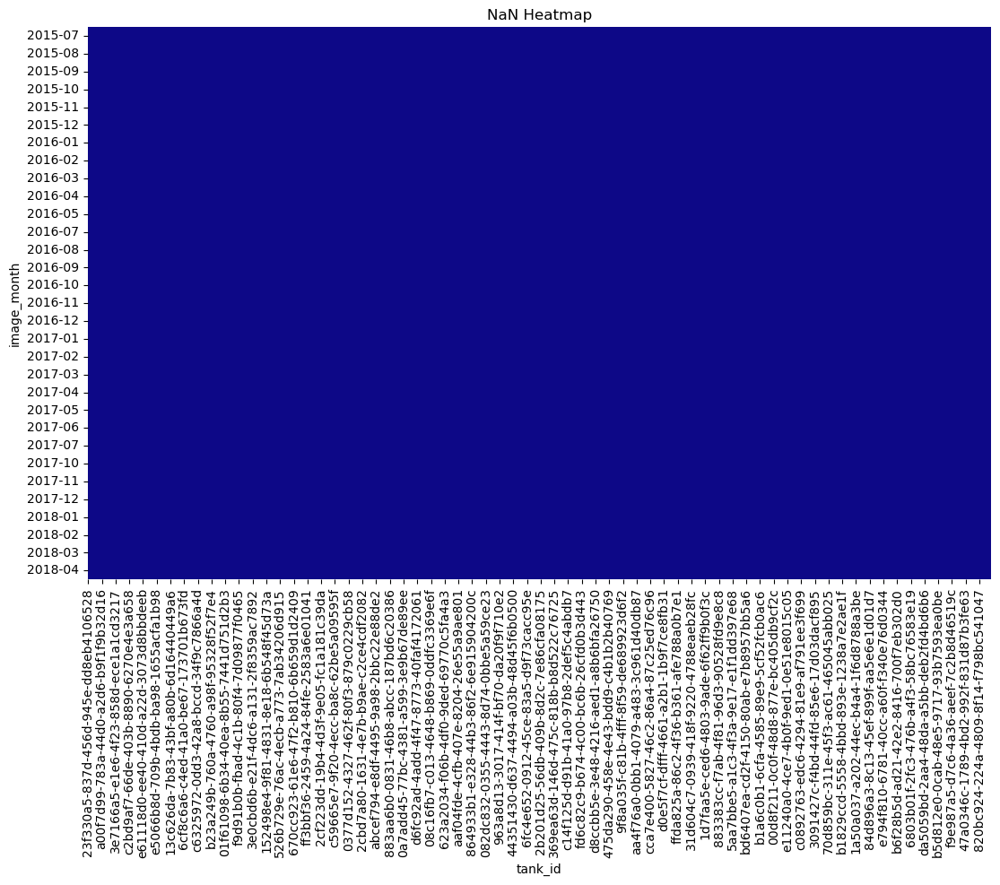

In [320]:
imputed_graph_df = laplacian_iterative_impute_fixed_corr(imputation_df)
# imputed_graph_df = pd.DataFrame(interpolated_rows)
plt.figure(figsize=(13, 8))
ax = plt.gca()
sns.heatmap(imputed_graph_df.isna(), cmap='plasma', cbar=False, ax=ax)
ax.set_title("NaN Heatmap")
ax.set_xlabel("tank_id")
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [321]:
'''import matplotlib.colors as mcolors
import matplotlib as mpl

corr = np.abs(imputation_df.corr())
corr = corr.fillna(0.001)
cov = imputation_df.cov()
model = TMFG()
_, _, A = model.fit_transform(weights=corr, cov=cov, output='weighted_sparse_W_matrix')


# Ensure unique tank IDs match adjacency matrix
unique_tank_ids = imputation_df.columns.tolist()
if isinstance(A, np.ndarray):
    adjacency_matrix = pd.DataFrame(A, index=unique_tank_ids, columns=unique_tank_ids)

# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(adjacency_matrix)

# Ensure tank_id is string
df["tank_id"] = df["tank_id"].astype(str)

# Map tank IDs to their tank farm
tank_farm_mapping = df.drop_duplicates("tank_id").set_index("tank_id")["tank farm"].to_dict()
G = nx.relabel_nodes(G, lambda x: str(x))

# Assign colors based on tank farms
unique_farms = list(set(tank_farm_mapping.values()))
num_farms = len(unique_farms)
norm = mcolors.Normalize(vmin=0, vmax=num_farms - 1)
cmap = mpl.colormaps['rainbow']
color_map = {farm: cmap(norm(i)) for i, farm in enumerate(unique_farms)}

node_colors = [color_map.get(tank_farm_mapping.get(node, "Unknown"), "gray") for node in G.nodes]

# Kamada-Kawai Layout for better spacing
pos = nx.kamada_kawai_layout(G, weight='weight')  # Balanced spacing

# Draw the graph
plt.figure(figsize=(14, 10))
nx.draw(
    G, pos, with_labels=False, node_color=node_colors, edge_color="gray", node_size=60, alpha=0.8
)

# Add Legend
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[farm], markersize=10, label=farm)
                  for farm in unique_farms]
plt.legend(handles=legend_patches, title="Tank Farms", loc="upper right")

plt.title("Triangulated Maximally Filtered Graph (TMFG) - Kamada-Kawai Layout")
plt.show()'''

'import matplotlib.colors as mcolors\nimport matplotlib as mpl\n\ncorr = np.abs(imputation_df.corr())\ncorr = corr.fillna(0.001)\ncov = imputation_df.cov()\nmodel = TMFG()\n_, _, A = model.fit_transform(weights=corr, cov=cov, output=\'weighted_sparse_W_matrix\')\n\n\n# Ensure unique tank IDs match adjacency matrix\nunique_tank_ids = imputation_df.columns.tolist()\nif isinstance(A, np.ndarray):\n    adjacency_matrix = pd.DataFrame(A, index=unique_tank_ids, columns=unique_tank_ids)\n\n# Create a graph from the adjacency matrix\nG = nx.from_pandas_adjacency(adjacency_matrix)\n\n# Ensure tank_id is string\ndf["tank_id"] = df["tank_id"].astype(str)\n\n# Map tank IDs to their tank farm\ntank_farm_mapping = df.drop_duplicates("tank_id").set_index("tank_id")["tank farm"].to_dict()\nG = nx.relabel_nodes(G, lambda x: str(x))\n\n# Assign colors based on tank farms\nunique_farms = list(set(tank_farm_mapping.values()))\nnum_farms = len(unique_farms)\nnorm = mcolors.Normalize(vmin=0, vmax=num_farms 

In [322]:
imputed_graph_df = laplacian_iterative_impute(imputation_df)
# imputed_graph_df = pd.DataFrame(interpolated_rows)

y_true_graph = []
y_pred_graph = []
for (r, c) in masked_positions:
    y_true_graph.append(cleaned_df.iat[r, c])
    y_pred_graph.append(imputed_graph_df.iat[r, c])

evaluate_metrics(y_true_graph, y_pred_graph)

C:\Users\jonah\AppData\Local\Temp\ipykernel_45256\3081657987.py:25: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_imputed[col].fillna(df_imputed[col].mean(), inplace=True)


Iteration 1: mean change = 7.5832e-02
Iteration 2: mean change = 5.5089e-02
Iteration 3: mean change = 4.4312e-02
Iteration 4: mean change = 4.1119e-02
Iteration 5: mean change = 3.9249e-02
Iteration 6: mean change = 3.6312e-02
Iteration 7: mean change = 3.6094e-02
Iteration 8: mean change = 3.3045e-02
Iteration 9: mean change = 2.8843e-02
Iteration 10: mean change = 2.5712e-02


{'Bias': -0.029543276101579502,
 '% Bias': -5.284390350036025,
 'RMSE': 0.2744990887741965,
 'MAE': 0.21879294472507912,
 'R² Score': -0.6551002497569172}

In [323]:
imputed_graph_df = laplacian_iterative_impute_fixed_corr(imputation_df)
# imputed_graph_df = pd.DataFrame(interpolated_rows)

y_true_graph = []
y_pred_graph = []
for (r, c) in masked_positions:
    y_true_graph.append(cleaned_df.iat[r, c])
    y_pred_graph.append(imputed_graph_df.iat[r, c])

evaluate_metrics(y_true_graph, y_pred_graph)

C:\Users\jonah\AppData\Local\Temp\ipykernel_45256\2721550041.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_imputed[col].fillna(df_imputed[col].mean(), inplace=True)


Iteration 1: mean change = 9.3606e-02
Iteration 2: mean change = 0.0000e+00
Converged!


{'Bias': -0.06142565570492784,
 '% Bias': -10.987174920468679,
 'RMSE': 0.3121487926587548,
 'MAE': 0.24513433178864386,
 'R² Score': -0.8973418517274407}

In [324]:
'''import networkx as nx
from sklearn.neighbors import kneighbors_graph
from scipy.sparse import csgraph
from scipy.sparse.linalg import cg

target_df = merged_df.copy()

# Use lat/lon and Fill_pct
graph_df = target_df[['latitude', 'longitude', 'Fill_pct']].copy()
coords = graph_df[['latitude', 'longitude']].values

# Build adjacency matrix (kNN graph)
A = kneighbors_graph(coords, n_neighbors=5, mode='connectivity', include_self=False)
L = csgraph.laplacian(A, normed=True)

# Identify known/missing indices
known_mask = ~graph_df['Fill_pct'].isnull().values
missing_mask = ~known_mask

# Build Laplacian blocks
L = L.tocsr()
L_mm = L[missing_mask][:, missing_mask]
L_mk = L[missing_mask][:, known_mask]
y_k = graph_df.loc[known_mask, 'Fill_pct'].values


# Solve: L_mm * y_m = -L_mk * y_k
y_m, _ = cg(L_mm, -L_mk @ y_k)

# Fill back into the DataFrame
graph_df.loc[missing_mask, 'Fill_pct'] = y_m
target_df['Fill_pct'] = graph_df['Fill_pct']

filled_long = target_df[['image_month', 'tank_id', 'Fill_pct']]
imputed_graph_df = filled_long.pivot(index='image_month', columns='tank_id', values='Fill_pct')
y_true_graph = []
y_pred_graph = []
for (r, c) in masked_positions:
    y_true_graph.append(cleaned_df.iat[r, c])
    y_pred_graph.append(imputed_graph_df.iat[r, c])

evaluate_metrics(y_true_graph, y_pred_graph)'''

"import networkx as nx\nfrom sklearn.neighbors import kneighbors_graph\nfrom scipy.sparse import csgraph\nfrom scipy.sparse.linalg import cg\n\ntarget_df = merged_df.copy()\n\n# Use lat/lon and Fill_pct\ngraph_df = target_df[['latitude', 'longitude', 'Fill_pct']].copy()\ncoords = graph_df[['latitude', 'longitude']].values\n\n# Build adjacency matrix (kNN graph)\nA = kneighbors_graph(coords, n_neighbors=5, mode='connectivity', include_self=False)\nL = csgraph.laplacian(A, normed=True)\n\n# Identify known/missing indices\nknown_mask = ~graph_df['Fill_pct'].isnull().values\nmissing_mask = ~known_mask\n\n# Build Laplacian blocks\nL = L.tocsr()\nL_mm = L[missing_mask][:, missing_mask]\nL_mk = L[missing_mask][:, known_mask]\ny_k = graph_df.loc[known_mask, 'Fill_pct'].values\n\n\n# Solve: L_mm * y_m = -L_mk * y_k\ny_m, _ = cg(L_mm, -L_mk @ y_k)\n\n# Fill back into the DataFrame\ngraph_df.loc[missing_mask, 'Fill_pct'] = y_m\ntarget_df['Fill_pct'] = graph_df['Fill_pct']\n\nfilled_long = target_

# Distribution comparrison models